In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import pycwt as wavelet
import scaleogram as scg 
from datetime import datetime as dt
from scipy import signal
from scipy.stats import pearsonr, spearmanr 
from pandas.plotting import scatter_matrix
from matplotlib.image import NonUniformImage
import pywt
import piwavelet

## Acquire Gauge Region Data

In [2]:
df_regions = pd.read_csv(
    "../Data/Streamflow_Drought_Data/Unregulated_Gauges_Regions.csv",
    dtype={"site": "string"}
)
df_regions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70 entries, 0 to 69
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   site        70 non-null     string 
 1   DRAIN_SQKM  70 non-null     float64
 2   HUC02       70 non-null     object 
dtypes: float64(1), object(1), string(1)
memory usage: 1.8+ KB


In [3]:
df_regions.describe()

,DRAIN_SQKM
count,70.000000
mean,419.722857
std,995.449282
min,2.200000
25%,45.400000
50%,163.150000
75%,402.650000
max,6783.600000


In [4]:
df_regions.head(10)

,site,DRAIN_SQKM,HUC02
0,06191500,6783.6,10U
1,06224000,484.9,10U
2,06280300,794.0,10U
3,06309200,117.5,10U
4,06614800,4.0,10L
5,06622700,98.7,10L
6,06623800,187.7,10L
7,06632400,163.0,10L
8,06746095,8.9,10L
9,07083000,60.8,11


## Load 6 Selected Gauges

In [5]:
selected_gauges = [
    '06224000',
    '07207000',
    '08324000',
    '09223000',
    '09404450',
    '13023000'
]

In [6]:
regions = []
for gauge in selected_gauges:
    df_gauge = df_regions.loc[df_regions['site'] == gauge]
    regions.append(df_gauge['HUC02'].values[0])
print(regions)

['10U', '11', '13', '14', '15', '17']


10U = Upper Missouri

11 = Arkansas-White-Red

13 = Rio Grande

14 = Upper Colorado

15 = Lower Colorado

17 = Pacific Northwest

In [7]:
df_10U_orig = pd.read_csv(
    "../Data/Streamflow_Drought_Data/Streamflow_Percentiles/Clean_Unregulated_Guages/" + 
        selected_gauges[0] + 
        "_Clean.csv",
    index_col = "dt", 
    parse_dates=True
)
df_10U = df_10U_orig[24:13418]
df_10U = df_10U.resample('M').mean()
df_10U = df_10U.drop(['value', 'jd', 'mean_value'], axis=1)
df_10U.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-31 to 2016-12-31
Freq: M
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   weibull_site  440 non-null    float64
 1   weibull_jd    440 non-null    float64
dtypes: float64(2)
memory usage: 10.3 KB


In [8]:
df_11_orig = pd.read_csv(
    "../Data/Streamflow_Drought_Data/Streamflow_Percentiles/Clean_Unregulated_Guages/" + 
        selected_gauges[1] + 
        "_Clean.csv",
    index_col = "dt", 
    parse_dates=True
)
df_11 = df_11_orig[24:13418]
df_11 = df_11.resample('M').mean()
df_11 = df_11.drop(['value', 'jd', 'mean_value'], axis=1)
df_11.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-31 to 2016-12-31
Freq: M
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   weibull_site  440 non-null    float64
 1   weibull_jd    440 non-null    float64
dtypes: float64(2)
memory usage: 10.3 KB


In [9]:
df_13_orig = pd.read_csv(
    "../Data/Streamflow_Drought_Data/Streamflow_Percentiles/Clean_Unregulated_Guages/" + 
        selected_gauges[2] + 
        "_Clean.csv",
    index_col = "dt", 
    parse_dates=True
)
df_13 = df_13_orig[24:13418]
df_13 = df_13.resample('M').mean()
df_13 = df_13.drop(['value', 'jd', 'mean_value'], axis=1)
df_13.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-31 to 2016-12-31
Freq: M
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   weibull_site  440 non-null    float64
 1   weibull_jd    440 non-null    float64
dtypes: float64(2)
memory usage: 10.3 KB


In [10]:
df_14_orig = pd.read_csv(
    "../Data/Streamflow_Drought_Data/Streamflow_Percentiles/Clean_Unregulated_Guages/" + 
        selected_gauges[3] + 
        "_Clean.csv",
    index_col = "dt", 
    parse_dates=True
)
df_14 = df_14_orig[24:13418]
df_14 = df_14.resample('M').mean()
df_14 = df_14.drop(['value', 'jd', 'mean_value'], axis=1)
df_14.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-31 to 2016-12-31
Freq: M
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   weibull_site  440 non-null    float64
 1   weibull_jd    440 non-null    float64
dtypes: float64(2)
memory usage: 10.3 KB


In [11]:
df_15_orig = pd.read_csv(
    "../Data/Streamflow_Drought_Data/Streamflow_Percentiles/Clean_Unregulated_Guages/" + 
        selected_gauges[4] + 
        "_Clean.csv",
    index_col = "dt", 
    parse_dates=True
)
df_15 = df_15_orig[24:13418]
df_15 = df_15.resample('M').mean()
df_15 = df_15.drop(['value', 'jd', 'mean_value'], axis=1)
df_15.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-31 to 2016-12-31
Freq: M
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   weibull_site  440 non-null    float64
 1   weibull_jd    440 non-null    float64
dtypes: float64(2)
memory usage: 10.3 KB


In [12]:
df_17_orig = pd.read_csv(
    "../Data/Streamflow_Drought_Data/Streamflow_Percentiles/Clean_Unregulated_Guages/" + 
        selected_gauges[5] + 
        "_Clean.csv",
    index_col = "dt", 
    parse_dates=True
)
df_17 = df_17_orig[24:13418]
df_17 = df_17.resample('M').mean()
df_17 = df_17.drop(['value', 'jd', 'mean_value'], axis=1)
df_17.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-31 to 2016-12-31
Freq: M
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   weibull_site  440 non-null    float64
 1   weibull_jd    440 non-null    float64
dtypes: float64(2)
memory usage: 10.3 KB


## Load Teleconnection Pattern Data

In [13]:
df_amo_orig = pd.read_csv(
    "../Data/Teleconnection_Time_Series/AMO_Clean.csv",
    index_col = "Date", 
    parse_dates=True
)
df_amo = df_amo_orig[364:804]
df_amo.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-01 to 2016-12-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   value   440 non-null    float64
dtypes: float64(1)
memory usage: 6.9 KB


In [14]:
df_enso_orig = pd.read_csv(
    "../Data/Teleconnection_Time_Series/ENSO_Clean.csv",
    index_col = "Date", 
    parse_dates=True
)
df_enso = df_enso_orig[364:804]
df_enso.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-01 to 2016-12-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   value   440 non-null    float64
dtypes: float64(1)
memory usage: 6.9 KB


In [15]:
df_pdo_orig = pd.read_csv(
    "../Data/Teleconnection_Time_Series/PDO_Clean.csv",
    index_col = "Date", 
    parse_dates=True
)
df_pdo = df_pdo_orig[364:804]
df_pdo.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-01 to 2016-12-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   value   440 non-null    float64
dtypes: float64(1)
memory usage: 6.9 KB


In [16]:
df_pna_orig = pd.read_csv(
    "../Data/Teleconnection_Time_Series/PNA_Clean.csv",
    index_col = "Date", 
    parse_dates=True
)
df_pna = df_pna_orig[364:804]
df_pna.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-01 to 2016-12-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   value   440 non-null    float64
dtypes: float64(1)
memory usage: 6.9 KB


In [17]:
df_sun_orig = pd.read_csv(
    "../Data/Teleconnection_Time_Series/Sun_Spots_Clean.csv",
    index_col = "Date", 
    parse_dates=True
)
df_sun = df_sun_orig[851:14245]
df_sun = df_sun.resample('M').mean()
df_sun.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-31 to 2016-12-31
Freq: M
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sun_spots_north  440 non-null    float64
 1   sun_spots_south  440 non-null    float64
dtypes: float64(2)
memory usage: 10.3 KB


## Correlation

### Multicollinearity

In [18]:
df_all_jd = pd.DataFrame(
    {
        "10U": df_10U['weibull_jd'],
        "11": df_11['weibull_jd'],
        "13": df_13['weibull_jd'],
        "14": df_14['weibull_jd'],
        "15": df_15['weibull_jd'],
        "17": df_17['weibull_jd'],   
    }
)
df_all_jd.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-31 to 2016-12-31
Freq: M
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   10U     440 non-null    float64
 1   11      440 non-null    float64
 2   13      440 non-null    float64
 3   14      440 non-null    float64
 4   15      440 non-null    float64
 5   17      440 non-null    float64
dtypes: float64(6)
memory usage: 24.1 KB


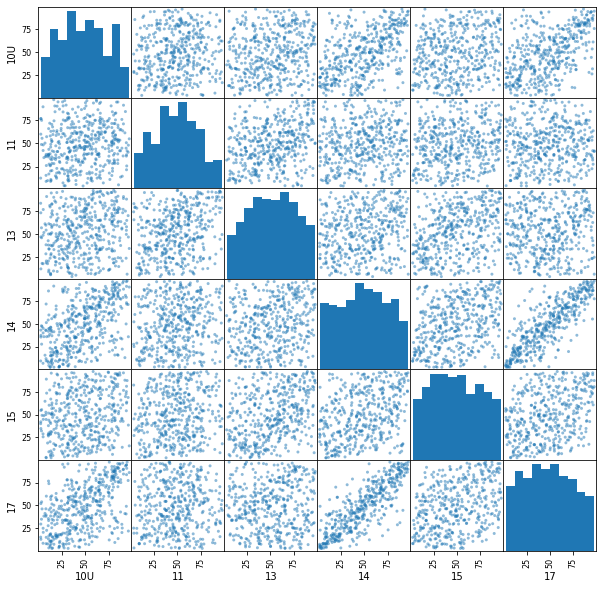

In [19]:
scatter_matrix(df_all_jd, figsize=(10,10))
plt.rcParams.update({'font.size': 15})
plt.show()

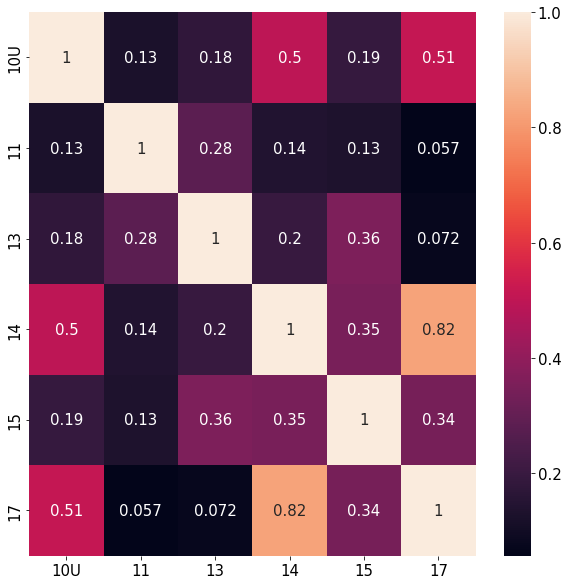

In [20]:
corr_matrix = df_all_jd.corr(method='spearman')

f, ax = plt.subplots(figsize=(10, 10))
ax = sns.heatmap(corr_matrix, annot=True)
ax = plt.rcParams.update({'font.size': 15})
plt.show()

In [123]:
weibull_jd_spearman = {}
for i in df_all_jd.columns.values:
    for j in df_all_jd.columns.values:
        weibull_jd_spearman[i+","+j] = spearmanr(df_all_jd[i], df_all_jd[j])
weibull_jd_spearman

{'10U,10U': SpearmanrResult(correlation=1.0, pvalue=0.0),
 '10U,11': SpearmanrResult(correlation=0.12500147915990759, pvalue=0.0086675129335161),
 '10U,13': SpearmanrResult(correlation=0.1780676650365273, pvalue=0.00017361698684679991),
 '10U,14': SpearmanrResult(correlation=0.4966475708222994, pvalue=8.772592050808698e-29),
 '10U,15': SpearmanrResult(correlation=0.19146163680676462, pvalue=5.296019602397546e-05),
 '10U,17': SpearmanrResult(correlation=0.5128739576367882, pvalue=6.894113364954229e-31),
 '11,10U': SpearmanrResult(correlation=0.12500147915990759, pvalue=0.0086675129335161),
 '11,11': SpearmanrResult(correlation=0.9999999999999999, pvalue=0.0),
 '11,13': SpearmanrResult(correlation=0.28096166393956745, pvalue=1.9979214239933953e-09),
 '11,14': SpearmanrResult(correlation=0.14060625351587744, pvalue=0.0031197222874931197),
 '11,15': SpearmanrResult(correlation=0.13199695659243638, pvalue=0.005553213854752251),
 '11,17': SpearmanrResult(correlation=0.05650879770761262, pval

In [21]:
df_all_site = pd.DataFrame(
    {
        "10U": df_10U['weibull_site'],
        "11": df_11['weibull_site'],
        "13": df_13['weibull_site'],
        "14": df_14['weibull_site'],
        "15": df_15['weibull_site'],
        "17": df_17['weibull_site'],   
    }
)
df_all_site.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-31 to 2016-12-31
Freq: M
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   10U     440 non-null    float64
 1   11      440 non-null    float64
 2   13      440 non-null    float64
 3   14      440 non-null    float64
 4   15      440 non-null    float64
 5   17      440 non-null    float64
dtypes: float64(6)
memory usage: 24.1 KB


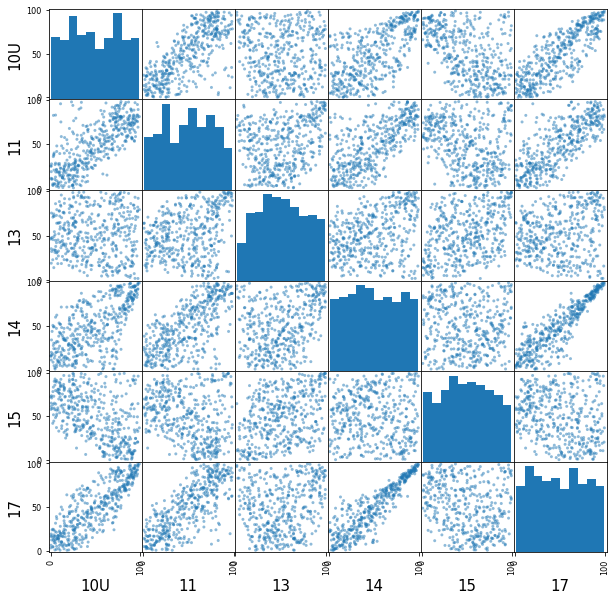

In [22]:
scatter_matrix(df_all_site, figsize=(10,10))
plt.rcParams.update({'font.size': 15})
plt.show()

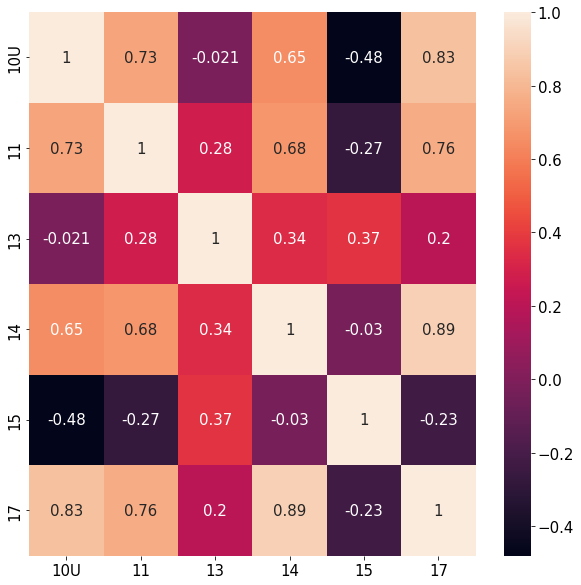

In [23]:
corr_matrix = df_all_site.corr(method='spearman')

f, ax = plt.subplots(figsize=(10, 10))
ax = sns.heatmap(corr_matrix, annot=True)
ax = plt.rcParams.update({'font.size': 15})
plt.show()

### Region: 10U

In [24]:
df_10U['amo'] = df_amo['value'].values
df_10U['enso'] = df_enso['value'].values
df_10U['pdo'] = df_pdo['value'].values
df_10U['pna'] = df_pna['value'].values
df_10U['sun_n'] = df_sun['sun_spots_north'].values
df_10U['sun_s'] = df_sun['sun_spots_south'].values
df_10U.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-31 to 2016-12-31
Freq: M
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   weibull_site  440 non-null    float64
 1   weibull_jd    440 non-null    float64
 2   amo           440 non-null    float64
 3   enso          440 non-null    float64
 4   pdo           440 non-null    float64
 5   pna           440 non-null    float64
 6   sun_n         440 non-null    float64
 7   sun_s         440 non-null    float64
dtypes: float64(8)
memory usage: 30.9 KB


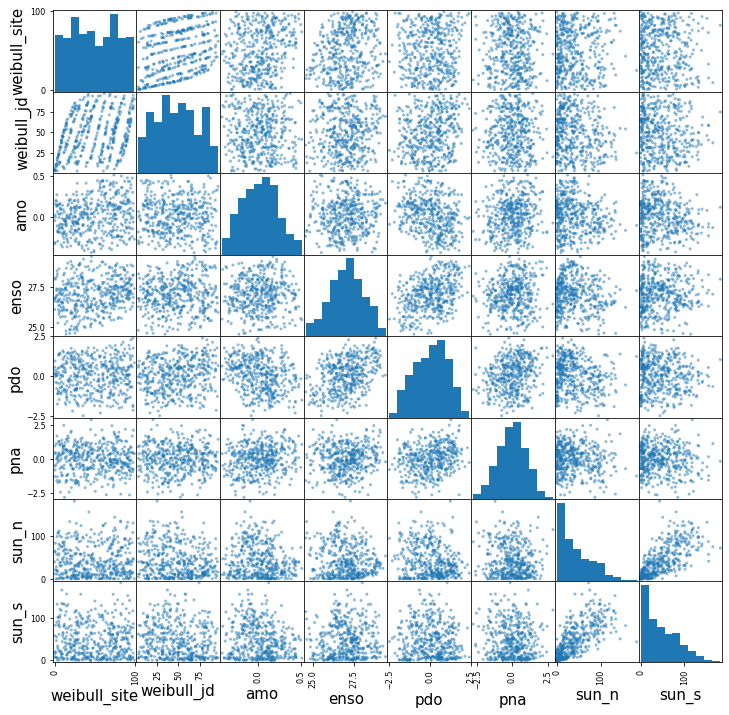

In [25]:
scatter_matrix(df_10U, figsize=(12,12))
plt.rcParams.update({'font.size': 15})
plt.show()

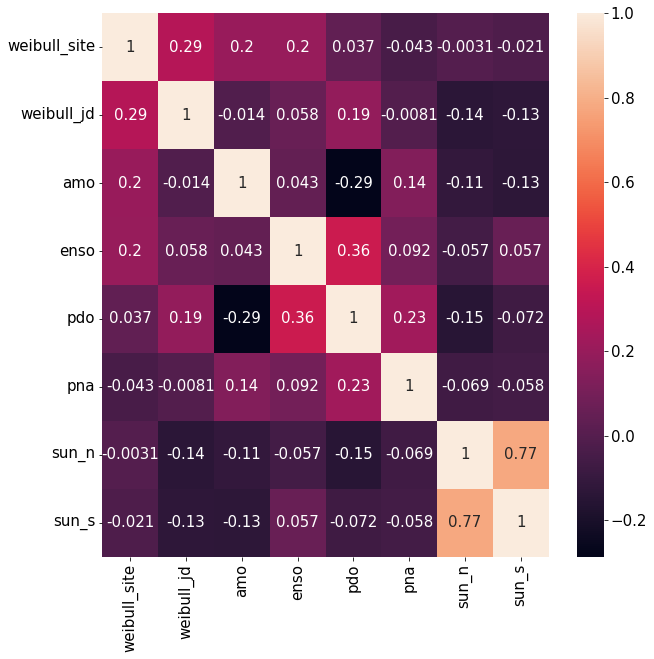

In [26]:
corr_matrix = df_10U.corr(method='spearman')

f, ax = plt.subplots(figsize=(10,10))
ax = sns.heatmap(corr_matrix, annot=True)
ax = plt.rcParams.update({'font.size': 15})
plt.show()

In [27]:
weibull_jd_spearman = {}
for var in df_10U.columns.values[2:]:
    weibull_jd_spearman[var] = spearmanr(df_10U["weibull_jd"], df_10U[var])
weibull_jd_spearman

{'amo': SpearmanrResult(correlation=-0.01395661264223675, pvalue=0.7703341717016289),
 'enso': SpearmanrResult(correlation=0.05760530514841671, pvalue=0.22785475255096135),
 'pdo': SpearmanrResult(correlation=0.1865350434170897, pvalue=8.276019450656389e-05),
 'pna': SpearmanrResult(correlation=-0.008091457168670331, pvalue=0.8656017367892654),
 'sun_n': SpearmanrResult(correlation=-0.13829442430598984, pvalue=0.0036536274189043574),
 'sun_s': SpearmanrResult(correlation=-0.12772404609192126, pvalue=0.007306630557265142)}

### Region: 11

In [28]:
df_11['amo'] = df_amo['value'].values
df_11['enso'] = df_enso['value'].values
df_11['pdo'] = df_pdo['value'].values
df_11['pna'] = df_pna['value'].values
df_11['sun_n'] = df_sun['sun_spots_north'].values
df_11['sun_s'] = df_sun['sun_spots_south'].values
df_11.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-31 to 2016-12-31
Freq: M
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   weibull_site  440 non-null    float64
 1   weibull_jd    440 non-null    float64
 2   amo           440 non-null    float64
 3   enso          440 non-null    float64
 4   pdo           440 non-null    float64
 5   pna           440 non-null    float64
 6   sun_n         440 non-null    float64
 7   sun_s         440 non-null    float64
dtypes: float64(8)
memory usage: 30.9 KB


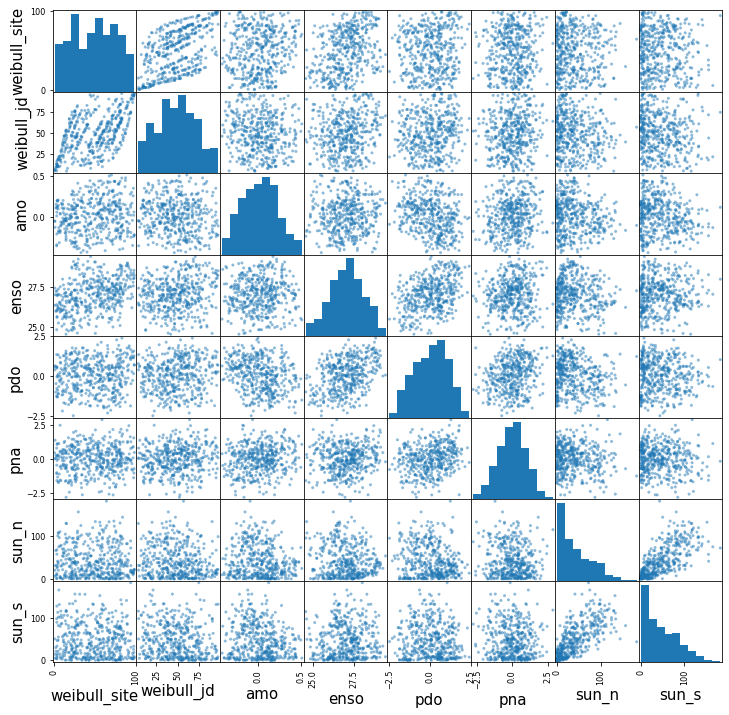

In [29]:
scatter_matrix(df_11, figsize=(12,12))
plt.rcParams.update({'font.size': 15})
plt.show()

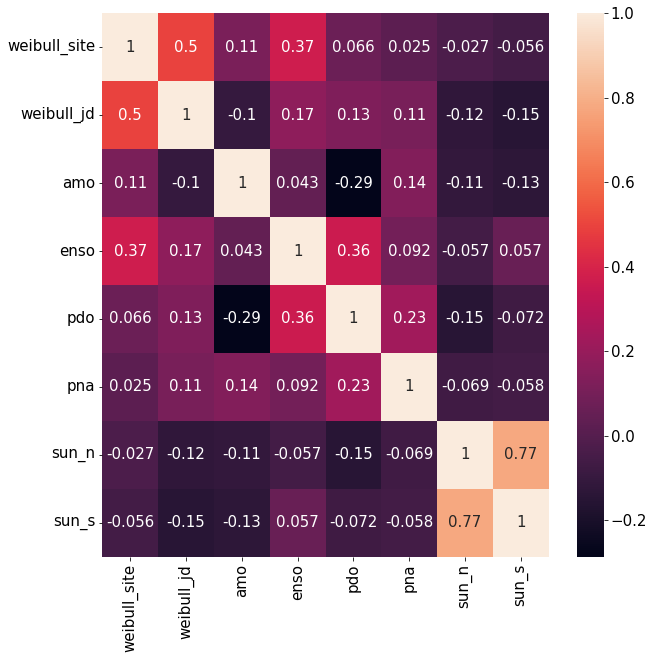

In [30]:
corr_matrix = df_11.corr(method='spearman')

f, ax = plt.subplots(figsize=(10,10))
ax = sns.heatmap(corr_matrix, annot=True)
ax = plt.rcParams.update({'font.size': 15})
plt.show()

In [31]:
weibull_jd_spearman = {}
for var in df_11.columns.values[2:]:
    weibull_jd_spearman[var] = spearmanr(df_11["weibull_jd"], df_11[var])
weibull_jd_spearman

{'amo': SpearmanrResult(correlation=-0.10234539535444151, pvalue=0.031845297134018756),
 'enso': SpearmanrResult(correlation=0.1737487461891116, pvalue=0.0002501482228538038),
 'pdo': SpearmanrResult(correlation=0.12590216909393281, pvalue=0.008194182577038125),
 'pna': SpearmanrResult(correlation=0.10901558948719565, pvalue=0.022193171123402772),
 'sun_n': SpearmanrResult(correlation=-0.1213949555954031, pvalue=0.01081592355128833),
 'sun_s': SpearmanrResult(correlation=-0.1465652117610218, pvalue=0.0020541225996490373)}

### Region: 13

In [32]:
df_13['amo'] = df_amo['value'].values
df_13['enso'] = df_enso['value'].values
df_13['pdo'] = df_pdo['value'].values
df_13['pna'] = df_pna['value'].values
df_13['sun_n'] = df_sun['sun_spots_north'].values
df_13['sun_s'] = df_sun['sun_spots_south'].values
df_13.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-31 to 2016-12-31
Freq: M
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   weibull_site  440 non-null    float64
 1   weibull_jd    440 non-null    float64
 2   amo           440 non-null    float64
 3   enso          440 non-null    float64
 4   pdo           440 non-null    float64
 5   pna           440 non-null    float64
 6   sun_n         440 non-null    float64
 7   sun_s         440 non-null    float64
dtypes: float64(8)
memory usage: 30.9 KB


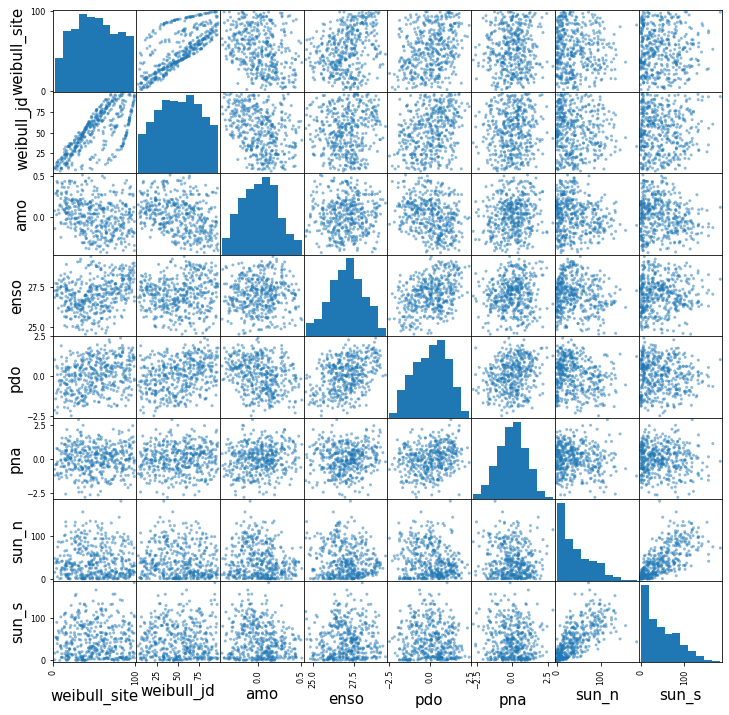

In [33]:
scatter_matrix(df_13, figsize=(12,12))
plt.rcParams.update({'font.size': 15})
plt.show()

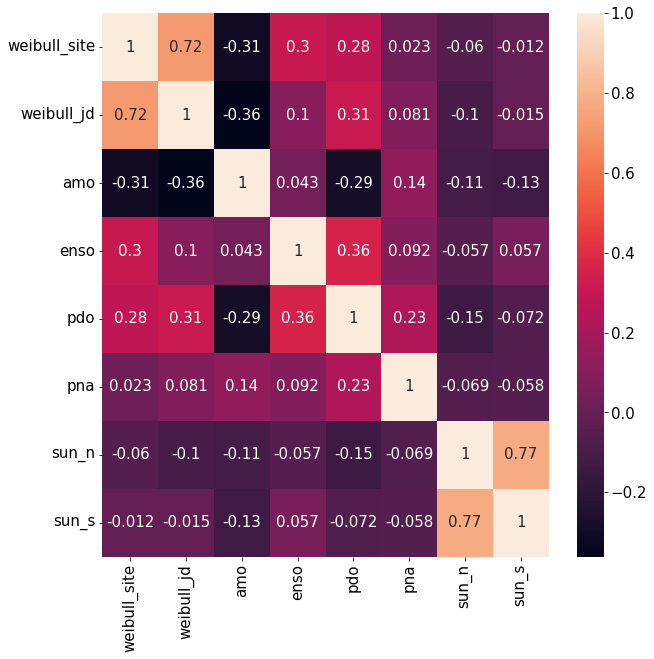

In [34]:
corr_matrix = df_13.corr(method='spearman')

f, ax = plt.subplots(figsize=(10,10))
ax = sns.heatmap(corr_matrix, annot=True)
ax = plt.rcParams.update({'font.size': 15})
plt.show()

In [35]:
weibull_jd_spearman = {}
for var in df_13.columns.values[2:]:
    weibull_jd_spearman[var] = spearmanr(df_13["weibull_jd"], df_13[var])
weibull_jd_spearman

{'amo': SpearmanrResult(correlation=-0.3613813184218427, pvalue=5.083198048463334e-15),
 'enso': SpearmanrResult(correlation=0.10466321079931959, pvalue=0.028147739369035533),
 'pdo': SpearmanrResult(correlation=0.3099748915933624, pvalue=2.97025863255352e-11),
 'pna': SpearmanrResult(correlation=0.08130145582387695, pvalue=0.08850010701519412),
 'sun_n': SpearmanrResult(correlation=-0.10422612732578385, pvalue=0.028815362989210985),
 'sun_s': SpearmanrResult(correlation=-0.01525676929155062, pvalue=0.7496226993075517)}

### Region: 14

In [36]:
df_14['amo'] = df_amo['value'].values
df_14['enso'] = df_enso['value'].values
df_14['pdo'] = df_pdo['value'].values
df_14['pna'] = df_pna['value'].values
df_14['sun_n'] = df_sun['sun_spots_north'].values
df_14['sun_s'] = df_sun['sun_spots_south'].values
df_14.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-31 to 2016-12-31
Freq: M
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   weibull_site  440 non-null    float64
 1   weibull_jd    440 non-null    float64
 2   amo           440 non-null    float64
 3   enso          440 non-null    float64
 4   pdo           440 non-null    float64
 5   pna           440 non-null    float64
 6   sun_n         440 non-null    float64
 7   sun_s         440 non-null    float64
dtypes: float64(8)
memory usage: 30.9 KB


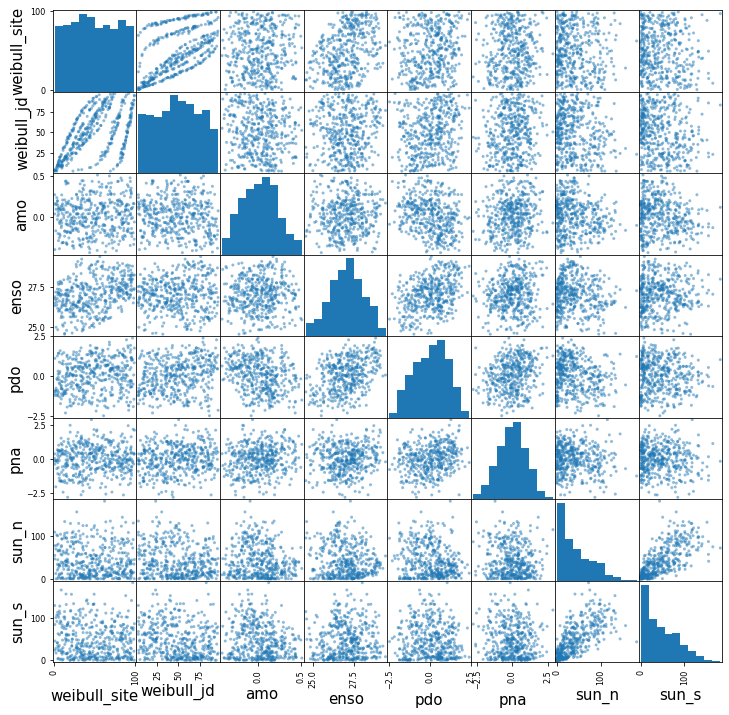

In [37]:
scatter_matrix(df_14, figsize=(12,12))
plt.rcParams.update({'font.size': 15})
plt.show()

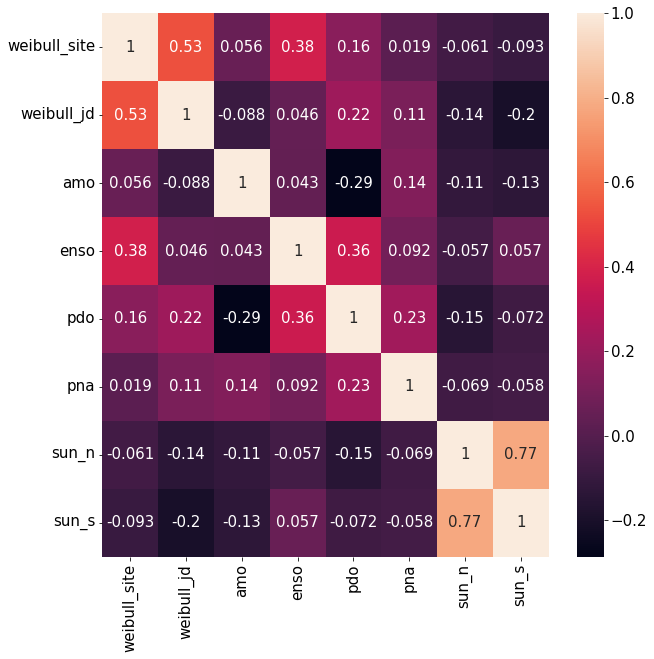

In [38]:
corr_matrix = df_14.corr(method='spearman')

f, ax = plt.subplots(figsize=(10,10))
ax = sns.heatmap(corr_matrix, annot=True)
ax = plt.rcParams.update({'font.size': 15})
plt.show()

In [39]:
weibull_jd_spearman = {}
for var in df_14.columns.values[2:]:
    weibull_jd_spearman[var] = spearmanr(df_14["weibull_jd"], df_14[var])
weibull_jd_spearman

{'amo': SpearmanrResult(correlation=-0.08830824048921446, pvalue=0.06421027184249521),
 'enso': SpearmanrResult(correlation=0.04570265978838829, pvalue=0.338850053391592),
 'pdo': SpearmanrResult(correlation=0.2199038601598314, pvalue=3.212491076361153e-06),
 'pna': SpearmanrResult(correlation=0.11283208834862145, pvalue=0.017902989668677517),
 'sun_n': SpearmanrResult(correlation=-0.1385853538969933, pvalue=0.003582164267379984),
 'sun_s': SpearmanrResult(correlation=-0.2016230551322749, pvalue=2.034334483997625e-05)}

### Region: 15

In [40]:
df_15['amo'] = df_amo['value'].values
df_15['enso'] = df_enso['value'].values
df_15['pdo'] = df_pdo['value'].values
df_15['pna'] = df_pna['value'].values
df_15['sun_n'] = df_sun['sun_spots_north'].values
df_15['sun_s'] = df_sun['sun_spots_south'].values
df_15.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-31 to 2016-12-31
Freq: M
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   weibull_site  440 non-null    float64
 1   weibull_jd    440 non-null    float64
 2   amo           440 non-null    float64
 3   enso          440 non-null    float64
 4   pdo           440 non-null    float64
 5   pna           440 non-null    float64
 6   sun_n         440 non-null    float64
 7   sun_s         440 non-null    float64
dtypes: float64(8)
memory usage: 30.9 KB


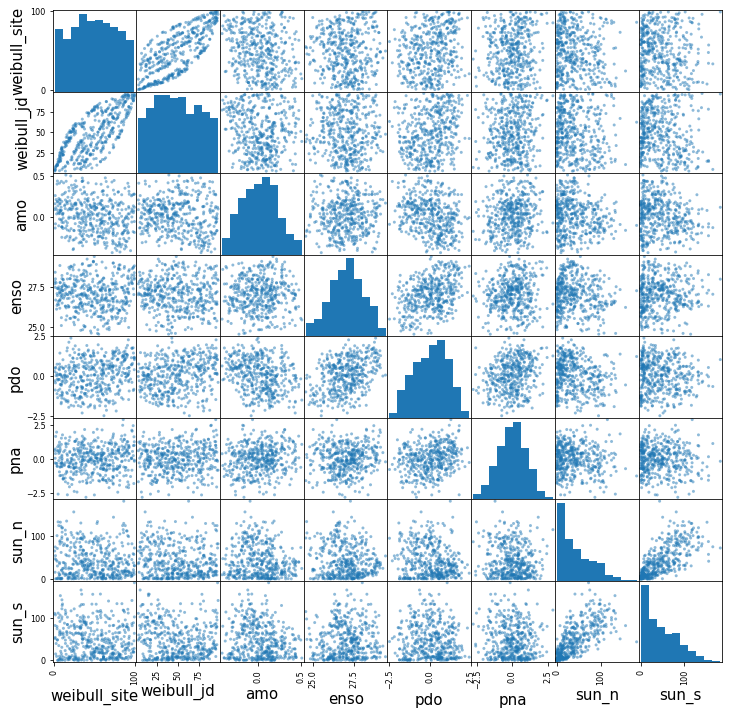

In [41]:
scatter_matrix(df_15, figsize=(12,12))
plt.rcParams.update({'font.size': 15})
plt.show()

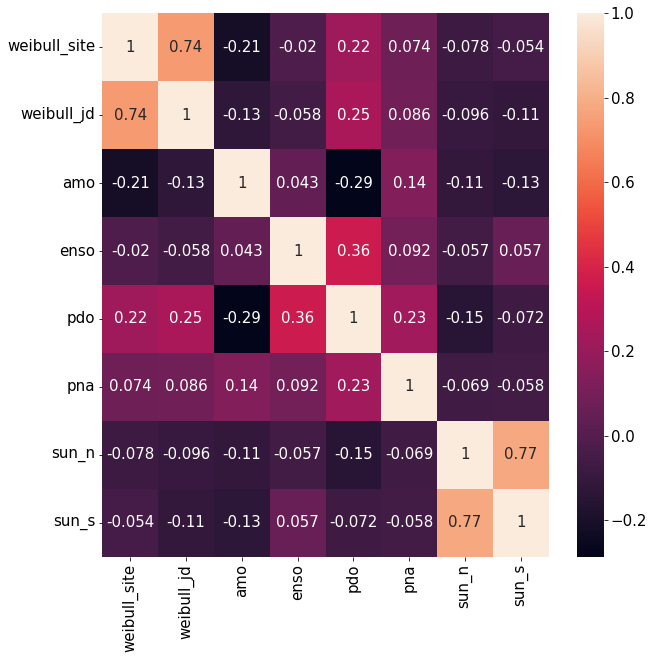

In [42]:
corr_matrix = df_15.corr(method='spearman')

f, ax = plt.subplots(figsize=(10,10))
ax = sns.heatmap(corr_matrix, annot=True)
ax = plt.rcParams.update({'font.size': 15})
plt.show()

In [43]:
weibull_jd_spearman = {}
for var in df_15.columns.values[2:]:
    weibull_jd_spearman[var] = spearmanr(df_15["weibull_jd"], df_15[var])
weibull_jd_spearman

{'amo': SpearmanrResult(correlation=-0.12918888852158356, pvalue=0.00665644511275502),
 'enso': SpearmanrResult(correlation=-0.057983392013728534, pvalue=0.22481207565500413),
 'pdo': SpearmanrResult(correlation=0.25229262079175035, pvalue=8.135545541366974e-08),
 'pna': SpearmanrResult(correlation=0.0856126419966514, pvalue=0.07281117929393342),
 'sun_n': SpearmanrResult(correlation=-0.09623480887959736, pvalue=0.04363492274408174),
 'sun_s': SpearmanrResult(correlation=-0.11127102094833745, pvalue=0.019561436378167544)}

### Region: 17

In [44]:
df_17['amo'] = df_amo['value'].values
df_17['enso'] = df_enso['value'].values
df_17['pdo'] = df_pdo['value'].values
df_17['pna'] = df_pna['value'].values
df_17['sun_n'] = df_sun['sun_spots_north'].values
df_17['sun_s'] = df_sun['sun_spots_south'].values
df_17.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 440 entries, 1980-05-31 to 2016-12-31
Freq: M
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   weibull_site  440 non-null    float64
 1   weibull_jd    440 non-null    float64
 2   amo           440 non-null    float64
 3   enso          440 non-null    float64
 4   pdo           440 non-null    float64
 5   pna           440 non-null    float64
 6   sun_n         440 non-null    float64
 7   sun_s         440 non-null    float64
dtypes: float64(8)
memory usage: 30.9 KB


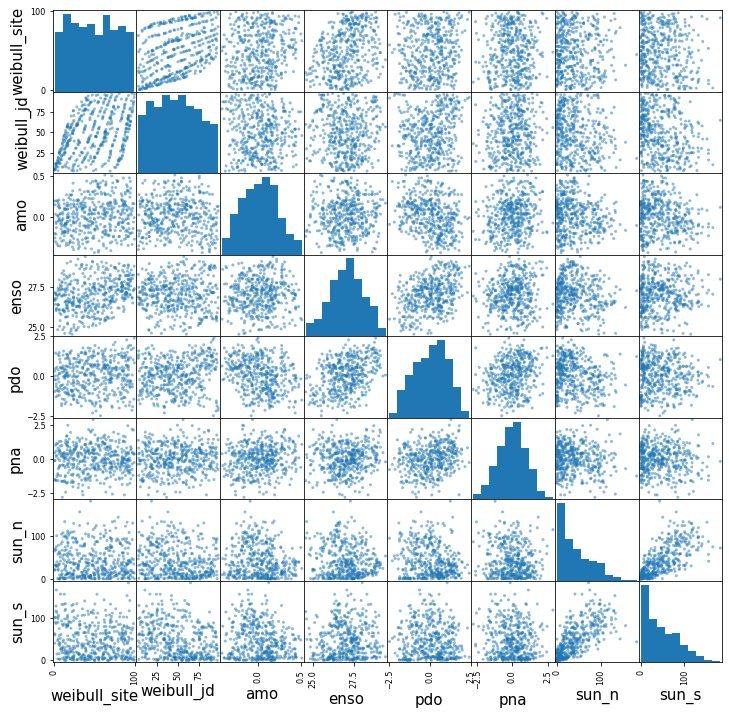

In [45]:
scatter_matrix(df_17, figsize=(12,12))
plt.rcParams.update({'font.size': 15})
plt.show()

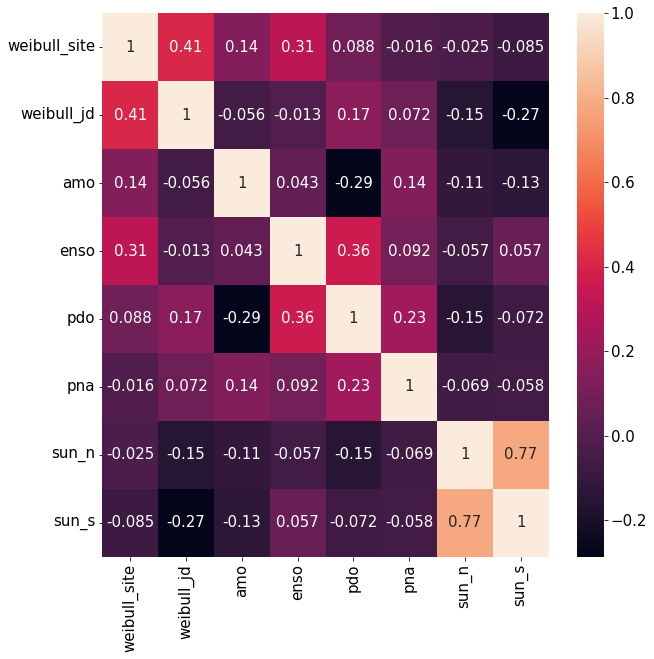

In [46]:
corr_matrix = df_17.corr(method='spearman')

f, ax = plt.subplots(figsize=(10,10))
ax = sns.heatmap(corr_matrix, annot=True)
ax = plt.rcParams.update({'font.size': 15})
plt.show()

In [47]:
weibull_jd_spearman = {}
for var in df_17.columns.values[2:]:
    weibull_jd_spearman[var] = spearmanr(df_17["weibull_jd"], df_17[var])
weibull_jd_spearman

{'amo': SpearmanrResult(correlation=-0.055919280018174915, pvalue=0.2417788529395245),
 'enso': SpearmanrResult(correlation=-0.01337798990976611, pvalue=0.7796053640652667),
 'pdo': SpearmanrResult(correlation=0.1689870355083369, pvalue=0.00037049387102332704),
 'pna': SpearmanrResult(correlation=0.07248405807561205, pvalue=0.12898646806640998),
 'sun_n': SpearmanrResult(correlation=-0.150809565114682, pvalue=0.0015109463696485422),
 'sun_s': SpearmanrResult(correlation=-0.27392640767836085, pvalue=5.167435984473599e-09)}

## Cross-Correlation

Correlations for 'weibull_jd' change slightly as the lag increases due to dropping more and more rows from the end of the dataframe in order to create the lagged variable.

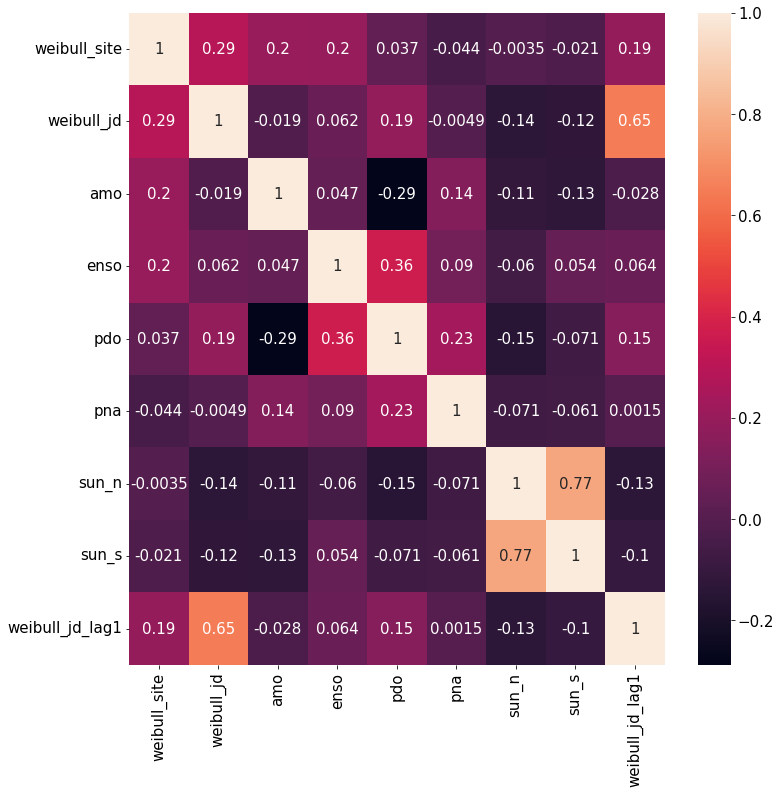

{'amo': SpearmanrResult(correlation=-0.028248446333992823, pvalue=0.5549888704411894), 'enso': SpearmanrResult(correlation=0.06431059764110528, pvalue=0.17862280042641512), 'pdo': SpearmanrResult(correlation=0.14681289529848693, pvalue=0.002042178828822009), 'pna': SpearmanrResult(correlation=0.001472679109463905, pvalue=0.9754544837167227), 'sun_n': SpearmanrResult(correlation=-0.13426711443045017, pvalue=0.004833015597611801), 'sun_s': SpearmanrResult(correlation=-0.10427706560271234, pvalue=0.028919905597442994)}


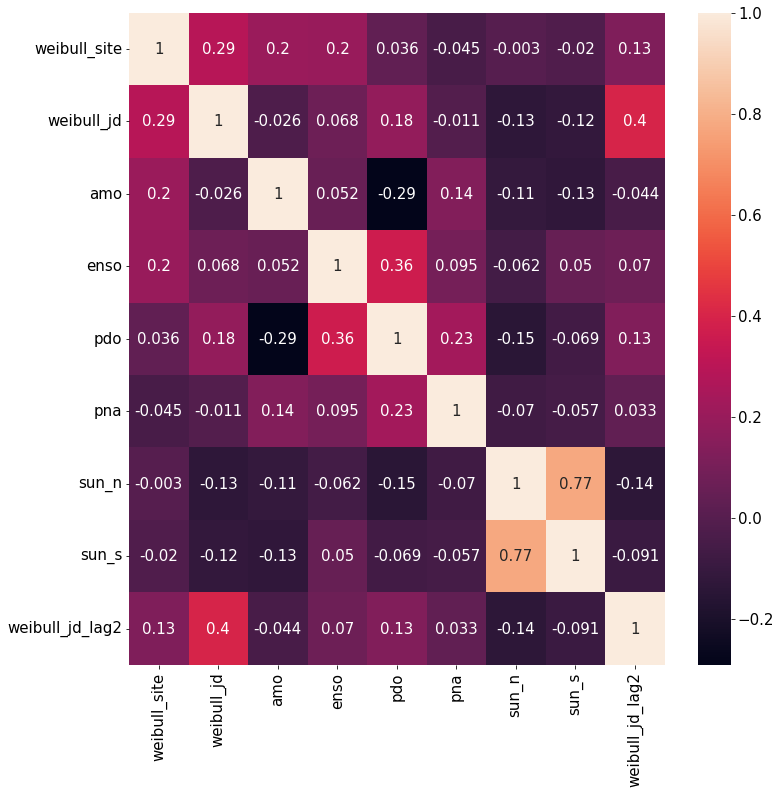

{'amo': SpearmanrResult(correlation=-0.044186538465126296, pvalue=0.35623457703680084), 'enso': SpearmanrResult(correlation=0.06969883784185124, pvalue=0.14531199904623754), 'pdo': SpearmanrResult(correlation=0.1281068769416864, pvalue=0.007264140565227968), 'pna': SpearmanrResult(correlation=0.03293069065739247, pvalue=0.4918273565971063), 'sun_n': SpearmanrResult(correlation=-0.13606866784493402, pvalue=0.00433293420058809), 'sun_s': SpearmanrResult(correlation=-0.091230905851505, pvalue=0.05641118923874081)}


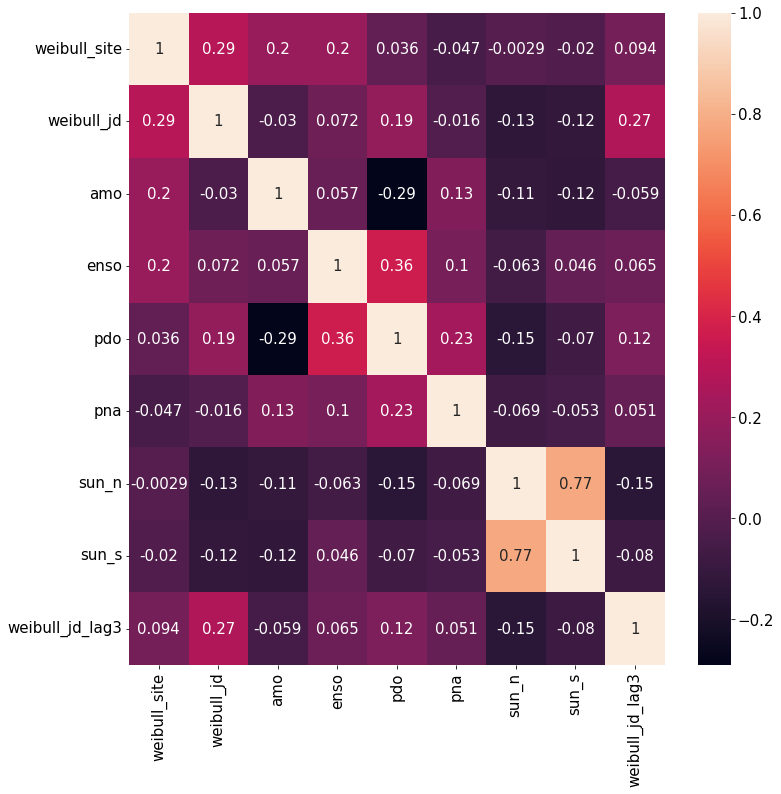

{'amo': SpearmanrResult(correlation=-0.058509694074663186, pvalue=0.2222143101165235), 'enso': SpearmanrResult(correlation=0.06457669583760053, pvalue=0.17782352333959897), 'pdo': SpearmanrResult(correlation=0.11993566669771732, pvalue=0.012104526054061938), 'pna': SpearmanrResult(correlation=0.05106153365382726, pvalue=0.2868507110138456), 'sun_n': SpearmanrResult(correlation=-0.1456571029845799, pvalue=0.002269671223057507), 'sun_s': SpearmanrResult(correlation=-0.0798229971742787, pvalue=0.09560506867988801)}


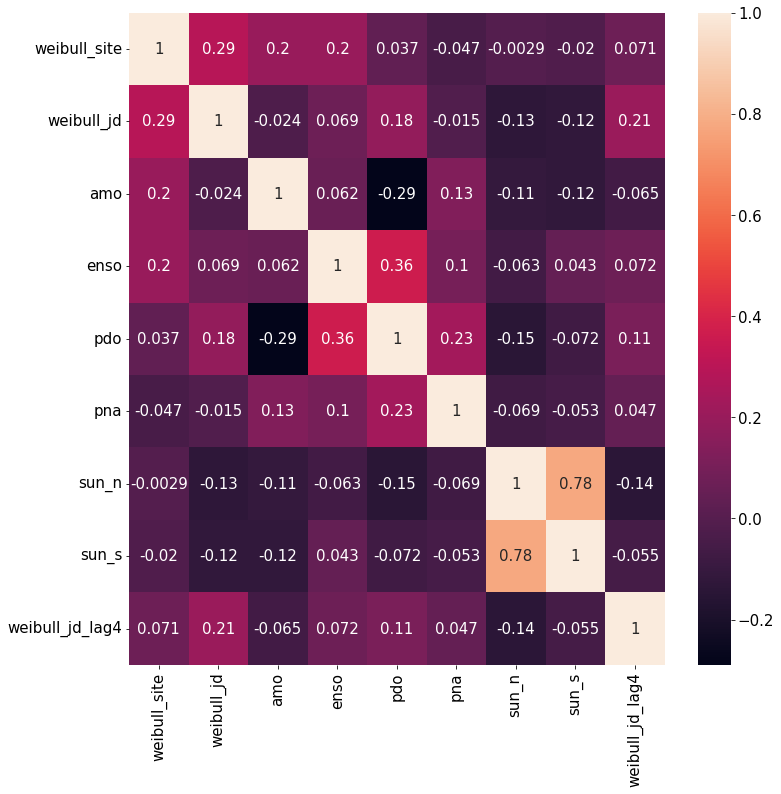

{'amo': SpearmanrResult(correlation=-0.06466610282243011, pvalue=0.17772188408441827), 'enso': SpearmanrResult(correlation=0.07153449602313518, pvalue=0.1358808693401695), 'pdo': SpearmanrResult(correlation=0.10959359538958413, pvalue=0.022096213726020553), 'pna': SpearmanrResult(correlation=0.046645661199355, pvalue=0.331188412640256), 'sun_n': SpearmanrResult(correlation=-0.1386172359430864, pvalue=0.0037302397253892996), 'sun_s': SpearmanrResult(correlation=-0.05485403228851322, pvalue=0.2530558668840756)}


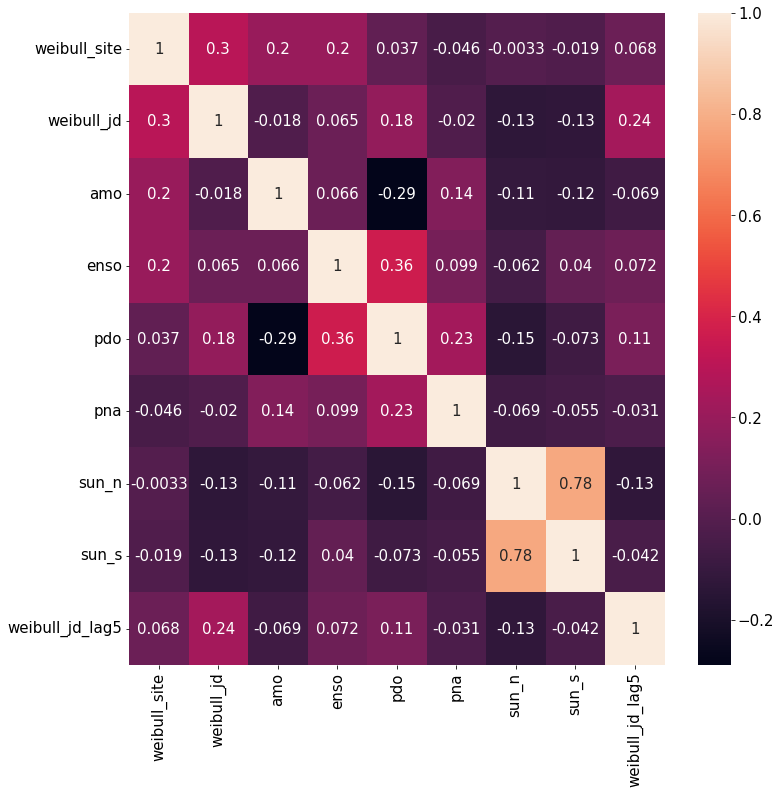

{'amo': SpearmanrResult(correlation=-0.06894493113439733, pvalue=0.15113566535031037), 'enso': SpearmanrResult(correlation=0.07216561990890273, pvalue=0.13290032020347206), 'pdo': SpearmanrResult(correlation=0.1102619712525781, pvalue=0.021442785335135692), 'pna': SpearmanrResult(correlation=-0.03104721809151799, pvalue=0.5183871473397192), 'sun_n': SpearmanrResult(correlation=-0.12813409672944287, pvalue=0.00745517691366007), 'sun_s': SpearmanrResult(correlation=-0.04152059650748291, pvalue=0.38766396395768365)}


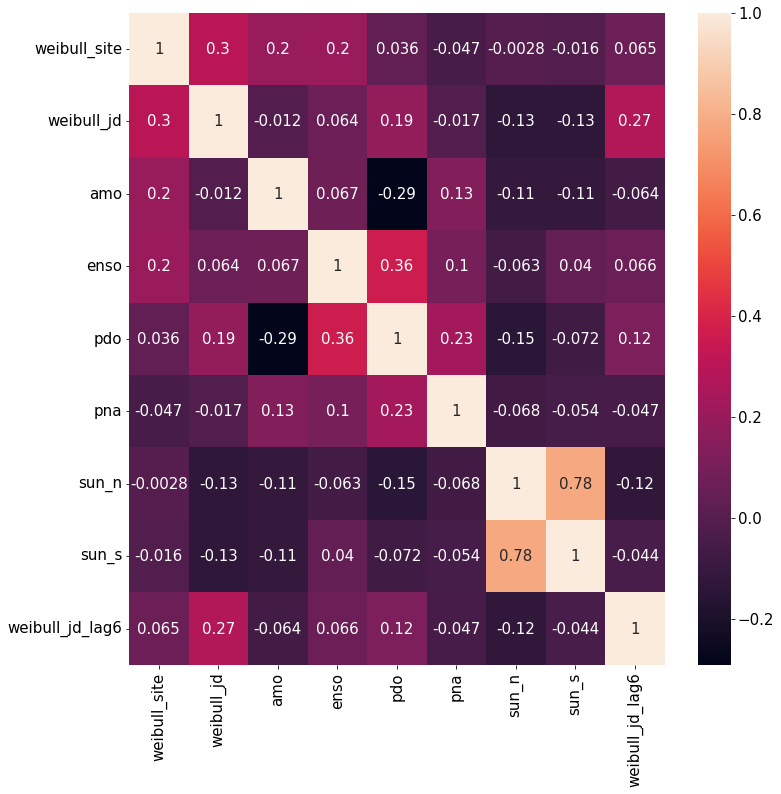

{'amo': SpearmanrResult(correlation=-0.06362270051424247, pvalue=0.18585248025018264), 'enso': SpearmanrResult(correlation=0.06600168935450365, pvalue=0.16990079218917117), 'pdo': SpearmanrResult(correlation=0.11872511986651325, pvalue=0.0133240984296636), 'pna': SpearmanrResult(correlation=-0.04704660346056527, pvalue=0.32816281377282175), 'sun_n': SpearmanrResult(correlation=-0.12435116141533235, pvalue=0.0095096502742255), 'sun_s': SpearmanrResult(correlation=-0.043843855327456556, pvalue=0.3621960966437474)}


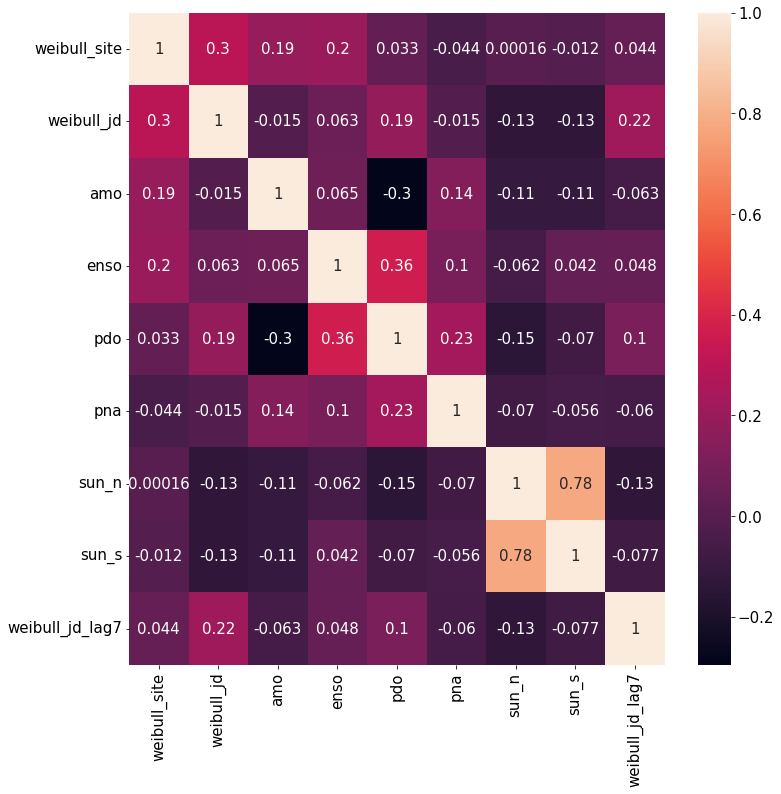

{'amo': SpearmanrResult(correlation=-0.06279696534599259, pvalue=0.1921550312173289), 'enso': SpearmanrResult(correlation=0.04776487821446659, pvalue=0.3213850302818747), 'pdo': SpearmanrResult(correlation=0.1042489030043162, pvalue=0.030088662292256485), 'pna': SpearmanrResult(correlation=-0.06011832789346834, pvalue=0.21184995798011821), 'sun_n': SpearmanrResult(correlation=-0.1307219263111986, pvalue=0.0064500059120069465), 'sun_s': SpearmanrResult(correlation=-0.07673318211544672, pvalue=0.11083527646207554)}


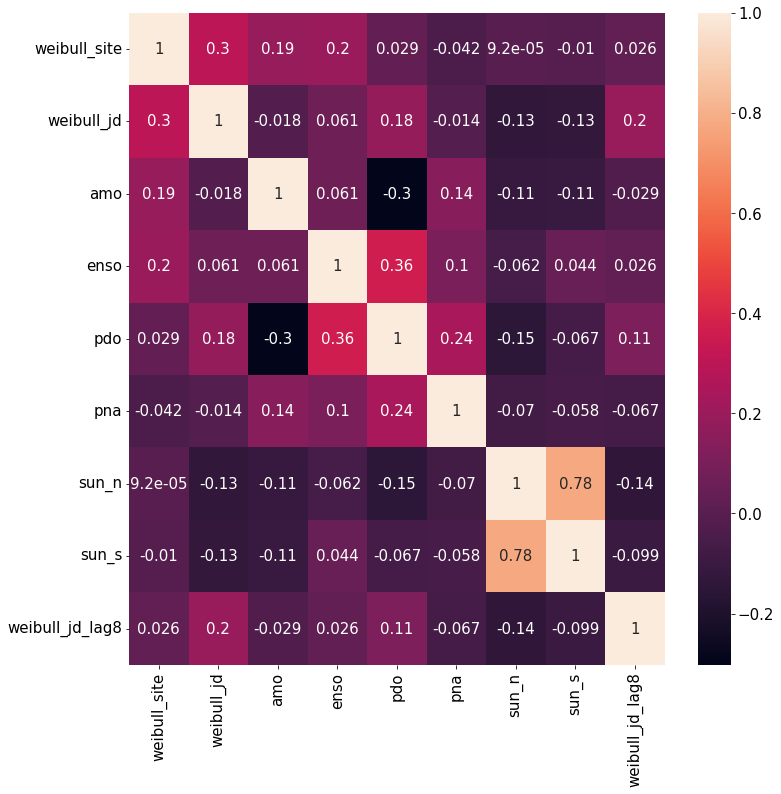

{'amo': SpearmanrResult(correlation=-0.028887064460126878, pvalue=0.549311779804236), 'enso': SpearmanrResult(correlation=0.02638225029707249, pvalue=0.584480960621804), 'pdo': SpearmanrResult(correlation=0.10954473281842039, pvalue=0.022779993893075095), 'pna': SpearmanrResult(correlation=-0.06695943758037773, pvalue=0.16475584137056432), 'sun_n': SpearmanrResult(correlation=-0.13708702356026223, pvalue=0.0043100173737039135), 'sun_s': SpearmanrResult(correlation=-0.09916976002836822, pvalue=0.039368544957893034)}


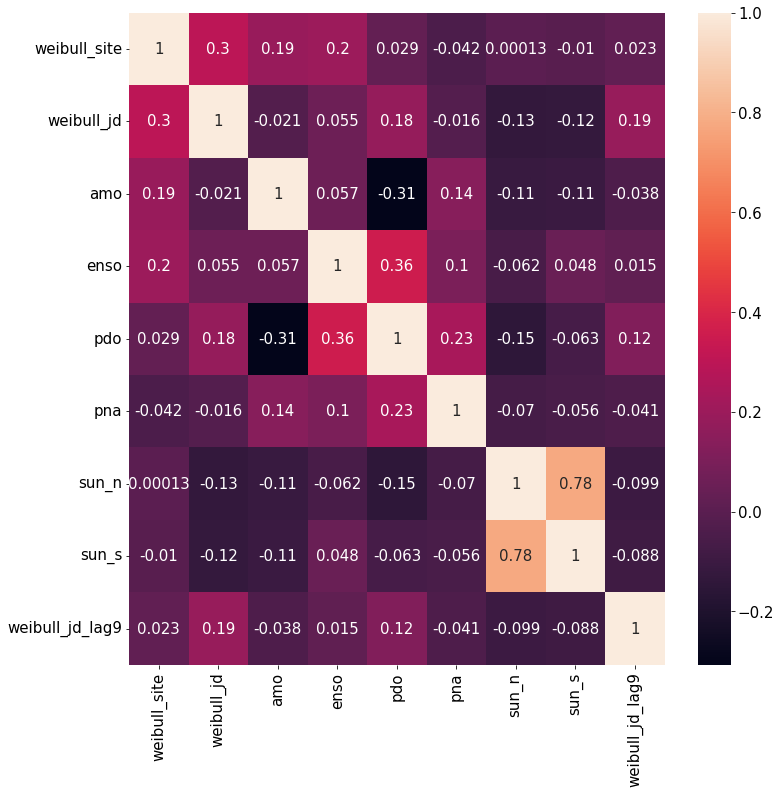

{'amo': SpearmanrResult(correlation=-0.03770965122522979, pvalue=0.4348748824481806), 'enso': SpearmanrResult(correlation=0.014628410145068181, pvalue=0.7620209962281363), 'pdo': SpearmanrResult(correlation=0.116970176050372, pvalue=0.0151131006807506), 'pna': SpearmanrResult(correlation=-0.0405888480176433, pvalue=0.40060250733648317), 'sun_n': SpearmanrResult(correlation=-0.09907179236197279, pvalue=0.03979495801964288), 'sun_s': SpearmanrResult(correlation=-0.08804067105014866, pvalue=0.06784861625648972)}


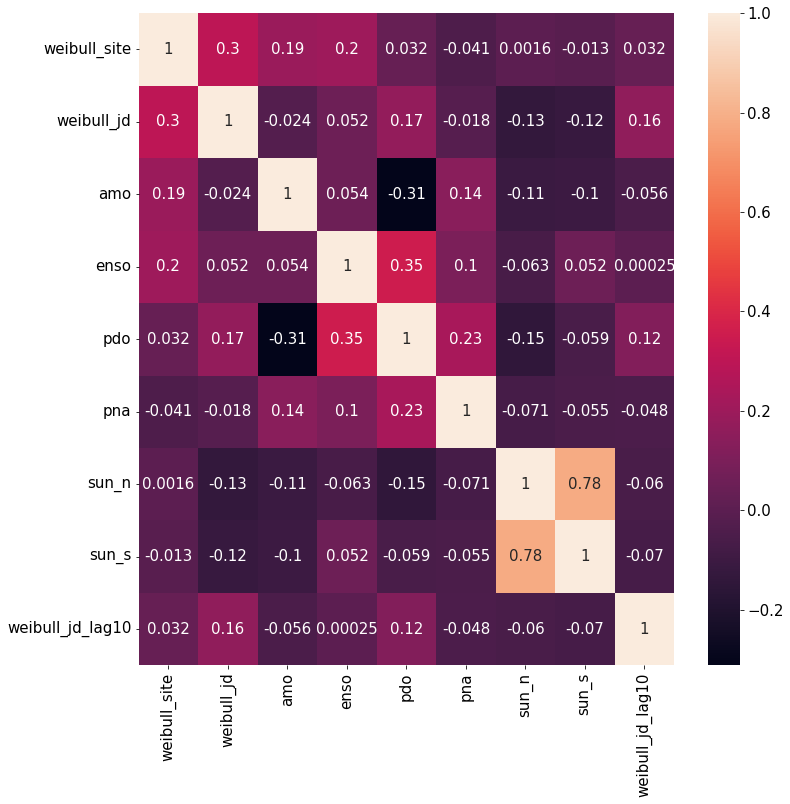

{'amo': SpearmanrResult(correlation=-0.05590085196943432, pvalue=0.24738875541575087), 'enso': SpearmanrResult(correlation=0.00024794495480335763, pvalue=0.9959096388994576), 'pdo': SpearmanrResult(correlation=0.121638291356627, pvalue=0.011590153667942558), 'pna': SpearmanrResult(correlation=-0.04814776215479003, pvalue=0.31920895531907884), 'sun_n': SpearmanrResult(correlation=-0.060214094126400546, pvalue=0.2127194680373991), 'sun_s': SpearmanrResult(correlation=-0.06986401935480734, pvalue=0.14809819262715507)}


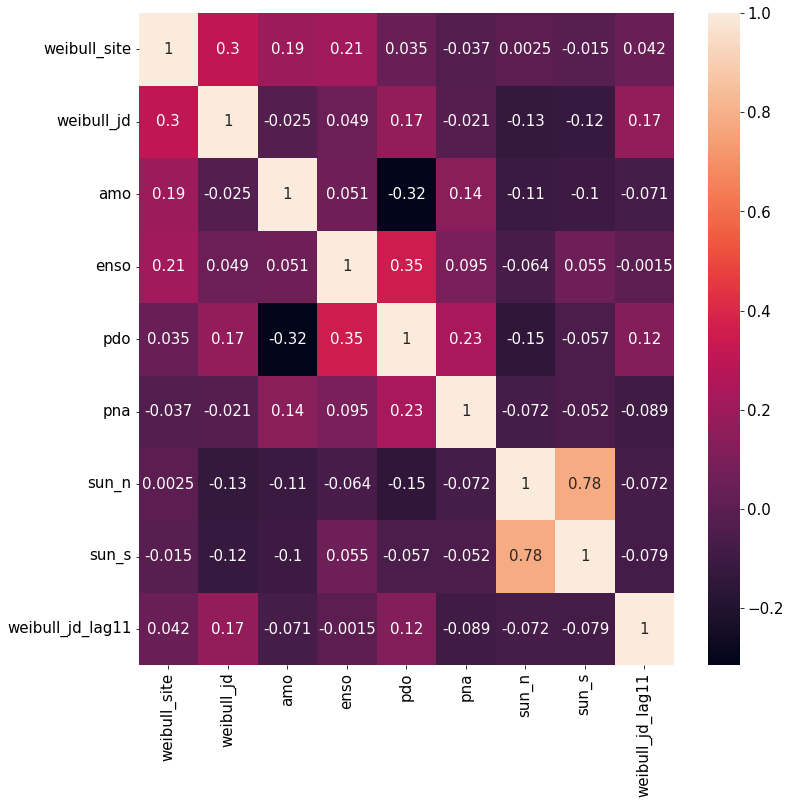

{'amo': SpearmanrResult(correlation=-0.07077134319424473, pvalue=0.14335878859831827), 'enso': SpearmanrResult(correlation=-0.0014563379790348955, pvalue=0.9760063310263782), 'pdo': SpearmanrResult(correlation=0.11851087318571346, pvalue=0.014044076679163724), 'pna': SpearmanrResult(correlation=-0.08949634586068225, pvalue=0.0640278401791851), 'sun_n': SpearmanrResult(correlation=-0.07154258646644561, pvalue=0.1390373488383832), 'sun_s': SpearmanrResult(correlation=-0.07861117262446404, pvalue=0.1039526659664599)}


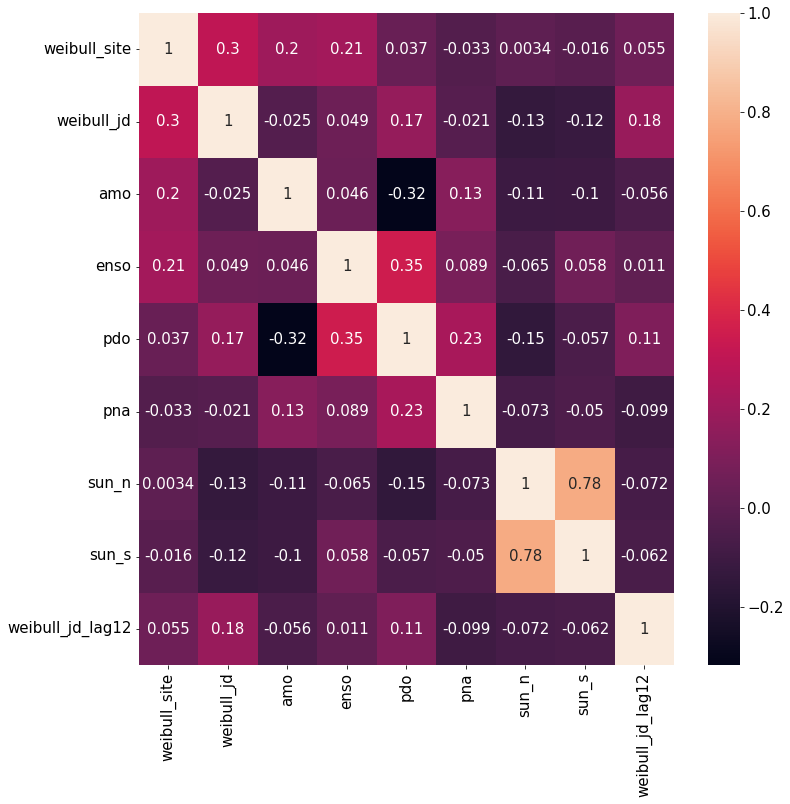

{'amo': SpearmanrResult(correlation=-0.055527203756049255, pvalue=0.25167901067512793), 'enso': SpearmanrResult(correlation=0.01142835583530413, pvalue=0.8136282826062792), 'pdo': SpearmanrResult(correlation=0.10526349018941004, pvalue=0.029451353501269654), 'pna': SpearmanrResult(correlation=-0.09909564080607673, pvalue=0.040446749660555364), 'sun_n': SpearmanrResult(correlation=-0.07223812760598639, pvalue=0.13568517568694474), 'sun_s': SpearmanrResult(correlation=-0.062483833365121075, pvalue=0.19699645643247987)}


In [48]:
periods = np.arange(-1, -13, -1)
for period in periods:
    df_10U["weibull_jd_lag" + str(period)[1:]] = df_10U["weibull_jd"].shift(periods=period)
    df_10U_cross_corr = df_10U[df_10U["weibull_jd_lag" + str(period)[1:]].notnull()]

    corr_matrix = df_10U_cross_corr.corr(method='spearman')

    f, ax = plt.subplots(figsize=(12,12))
    ax = sns.heatmap(corr_matrix, annot=True)
    ax = plt.rcParams.update({'font.size': 15})
    plt.show()

    weibull_jd_spearman = {}
    for var in df_10U_cross_corr.columns.values[2:-1]:
        weibull_jd_spearman[var] = spearmanr(
            df_10U_cross_corr["weibull_jd_lag" + str(period)[1:]], 
            df_10U_cross_corr[var]
        )
    print(weibull_jd_spearman)

    df_10U = df_10U.drop(["weibull_jd_lag" + str(period)[1:]], axis=1)

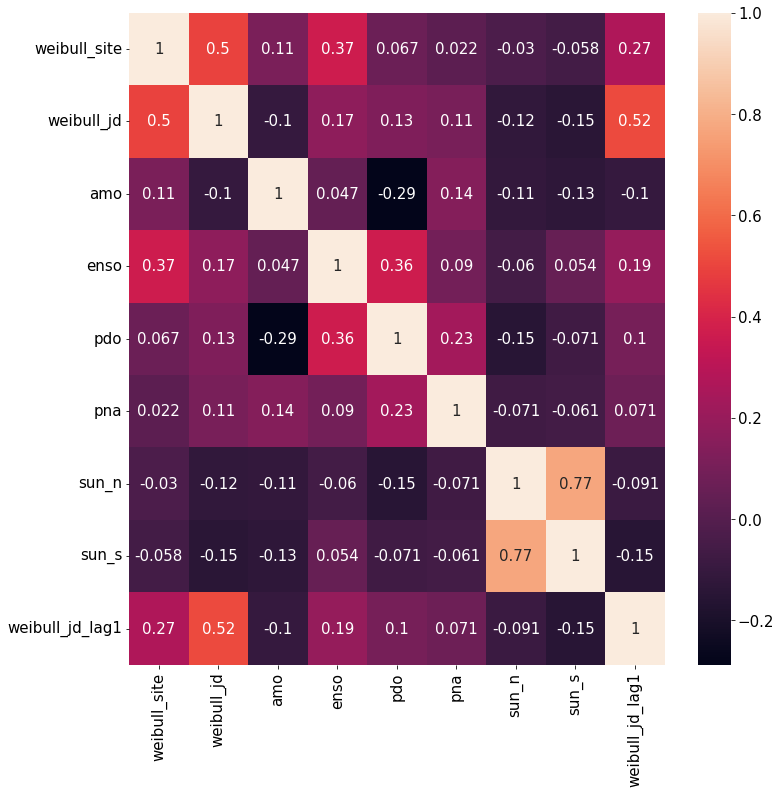

{'amo': SpearmanrResult(correlation=-0.10240545412318332, pvalue=0.03194025889071252), 'enso': SpearmanrResult(correlation=0.1918024309814757, pvalue=5.235337390070423e-05), 'pdo': SpearmanrResult(correlation=0.10463406273530748, pvalue=0.028372514614543536), 'pna': SpearmanrResult(correlation=0.07135965794664526, pvalue=0.13549174259274258), 'sun_n': SpearmanrResult(correlation=-0.0905978895771589, pvalue=0.05786402167387077), 'sun_s': SpearmanrResult(correlation=-0.14888771014217148, pvalue=0.0017593903582876636)}


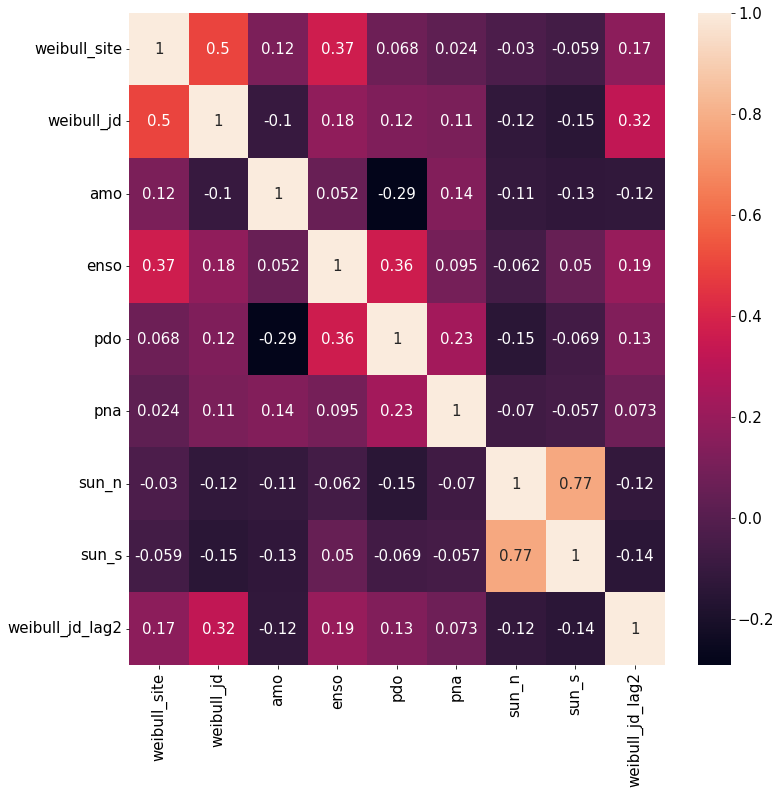

{'amo': SpearmanrResult(correlation=-0.12314376551822445, pvalue=0.009889516417018435), 'enso': SpearmanrResult(correlation=0.19354739202843993, pvalue=4.548477836277208e-05), 'pdo': SpearmanrResult(correlation=0.13193761257305633, pvalue=0.005684293103205042), 'pna': SpearmanrResult(correlation=0.07262936877594692, pvalue=0.12909475097814094), 'sun_n': SpearmanrResult(correlation=-0.11765710613364247, pvalue=0.013743152351172839), 'sun_s': SpearmanrResult(correlation=-0.14051996417587834, pvalue=0.0032077279464216095)}


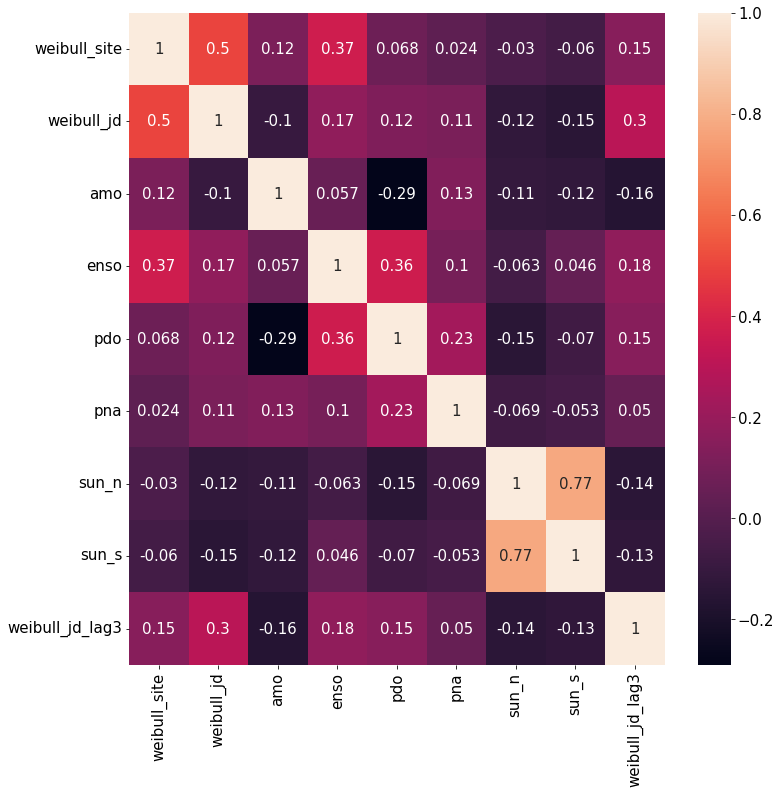

{'amo': SpearmanrResult(correlation=-0.16276644409310198, pvalue=0.0006363768336199976), 'enso': SpearmanrResult(correlation=0.17805051104054123, pvalue=0.00018304105385932376), 'pdo': SpearmanrResult(correlation=0.1519907066147423, pvalue=0.0014389122470089399), 'pna': SpearmanrResult(correlation=0.04988085654268824, pvalue=0.2981551391606629), 'sun_n': SpearmanrResult(correlation=-0.14247495506629626, pvalue=0.0028349885092185246), 'sun_s': SpearmanrResult(correlation=-0.12527532889204265, pvalue=0.00875030807819676)}


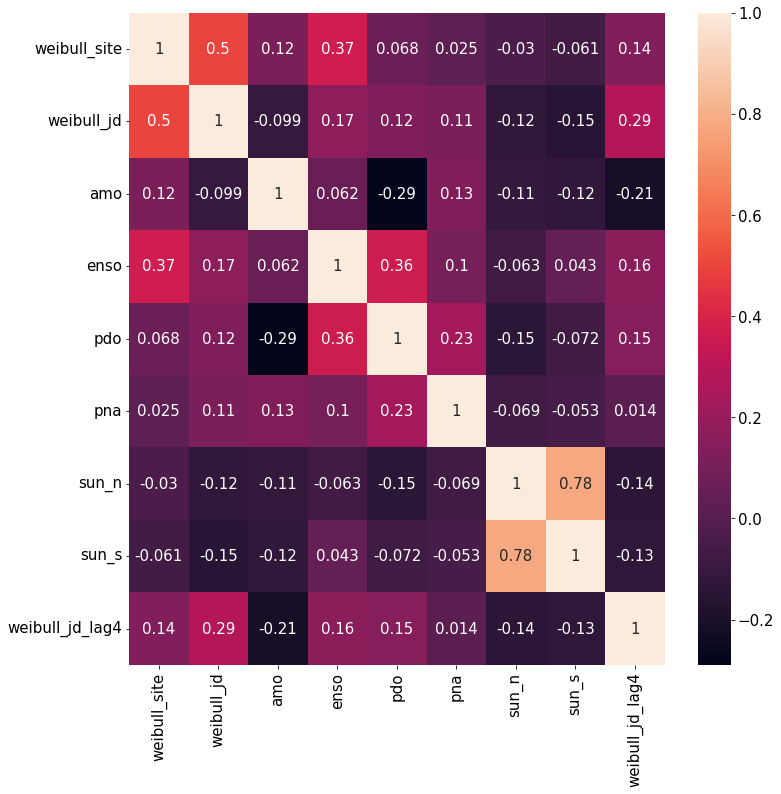

{'amo': SpearmanrResult(correlation=-0.21055650557549577, pvalue=9.261691126267103e-06), 'enso': SpearmanrResult(correlation=0.1641901585389539, pvalue=0.0005775670672287757), 'pdo': SpearmanrResult(correlation=0.14778259595300186, pvalue=0.001975191357589854), 'pna': SpearmanrResult(correlation=0.013696241647222072, pvalue=0.7755075435330846), 'sun_n': SpearmanrResult(correlation=-0.1398940527234994, pvalue=0.0034214511010040517), 'sun_s': SpearmanrResult(correlation=-0.1318186833019391, pvalue=0.005840725259638671)}


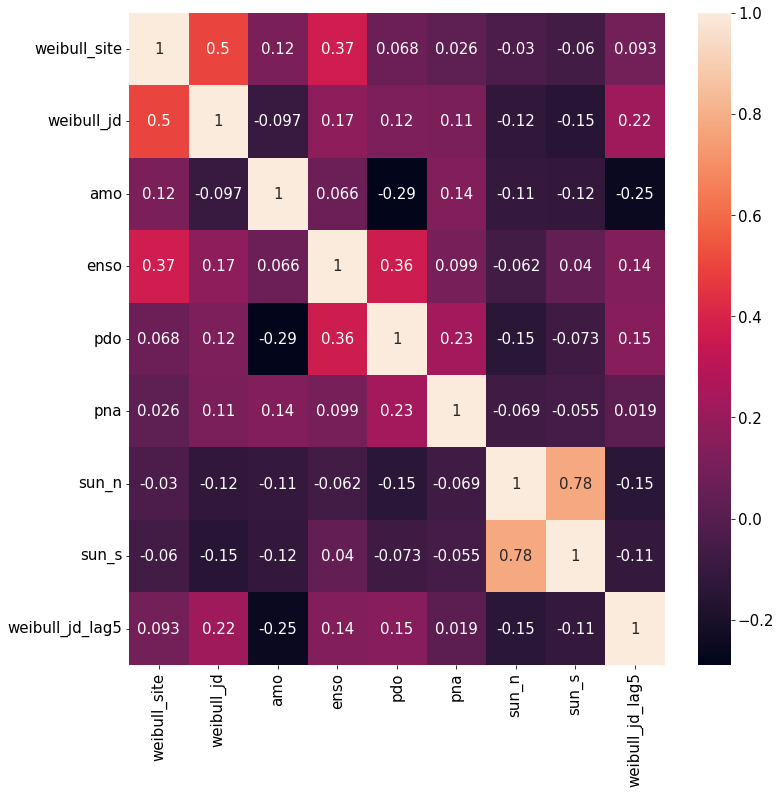

{'amo': SpearmanrResult(correlation=-0.24942094387589558, pvalue=1.3594458701501284e-07), 'enso': SpearmanrResult(correlation=0.13606234936036352, pvalue=0.004470906792026852), 'pdo': SpearmanrResult(correlation=0.15228696784904489, pvalue=0.0014442549979842064), 'pna': SpearmanrResult(correlation=0.018517798354694703, pvalue=0.7001329258177273), 'sun_n': SpearmanrResult(correlation=-0.14645339484551018, pvalue=0.0021966804243774524), 'sun_s': SpearmanrResult(correlation=-0.11223379812876186, pvalue=0.019207026097911743)}


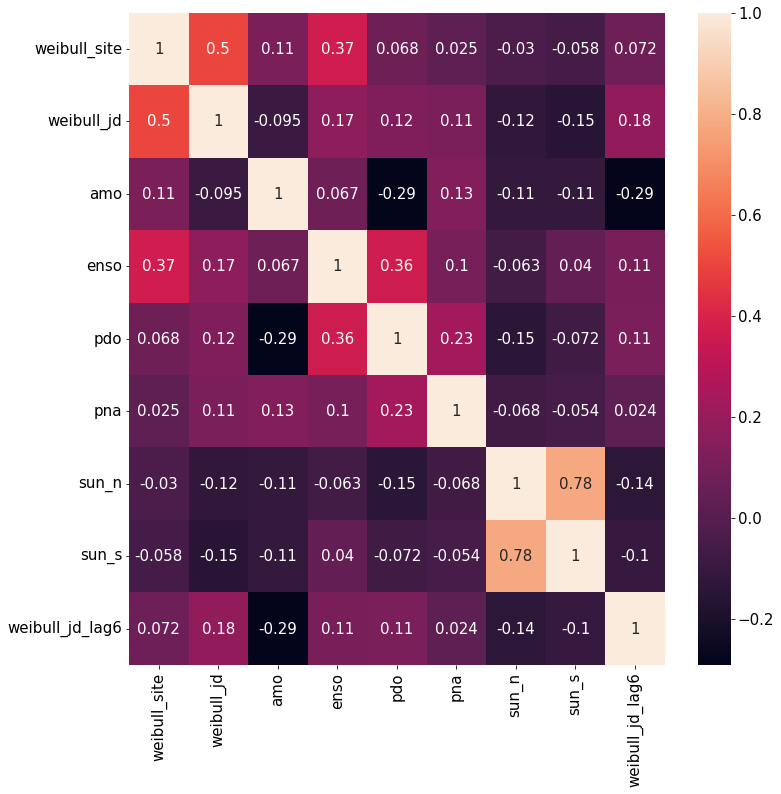

{'amo': SpearmanrResult(correlation=-0.2861758728047536, pvalue=1.262758740314977e-09), 'enso': SpearmanrResult(correlation=0.10542978506616044, pvalue=0.02807955450573023), 'pdo': SpearmanrResult(correlation=0.1085503565993049, pvalue=0.023724729567251527), 'pna': SpearmanrResult(correlation=0.02384711545967883, pvalue=0.6202918967921391), 'sun_n': SpearmanrResult(correlation=-0.13920762124194774, pvalue=0.003662414131825201), 'sun_s': SpearmanrResult(correlation=-0.1008552421187261, pvalue=0.03569523195932341)}


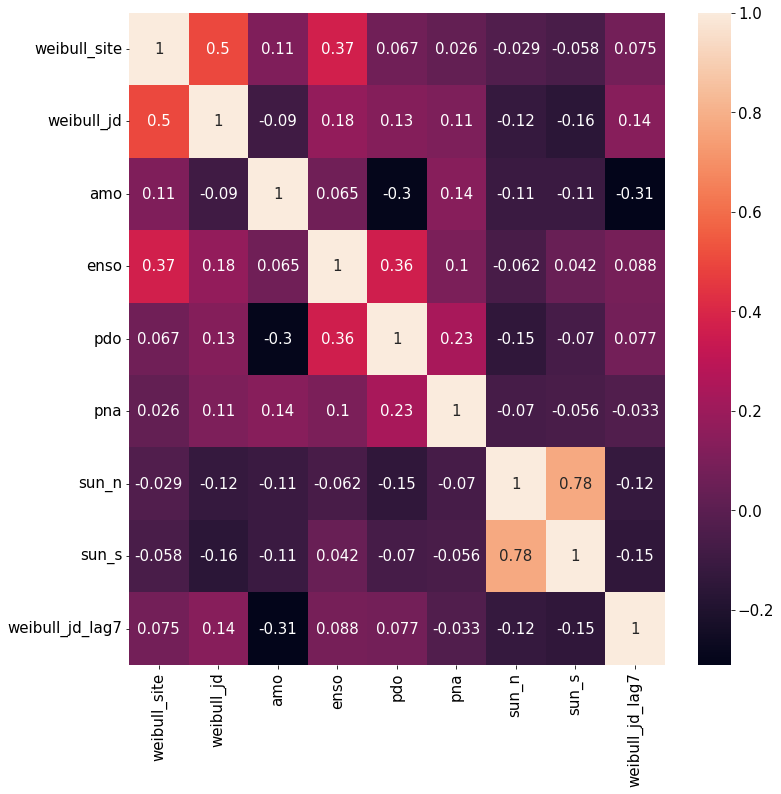

{'amo': SpearmanrResult(correlation=-0.31094566523881334, pvalue=3.681074694702775e-11), 'enso': SpearmanrResult(correlation=0.08818935337635334, pvalue=0.06674750832162513), 'pdo': SpearmanrResult(correlation=0.07682881885195607, pvalue=0.11038988607501637), 'pna': SpearmanrResult(correlation=-0.032794409398976945, pvalue=0.49611328304405855), 'sun_n': SpearmanrResult(correlation=-0.12232697355566532, pvalue=0.010844316929985439), 'sun_s': SpearmanrResult(correlation=-0.14521763192252146, pvalue=0.002452670201237045)}


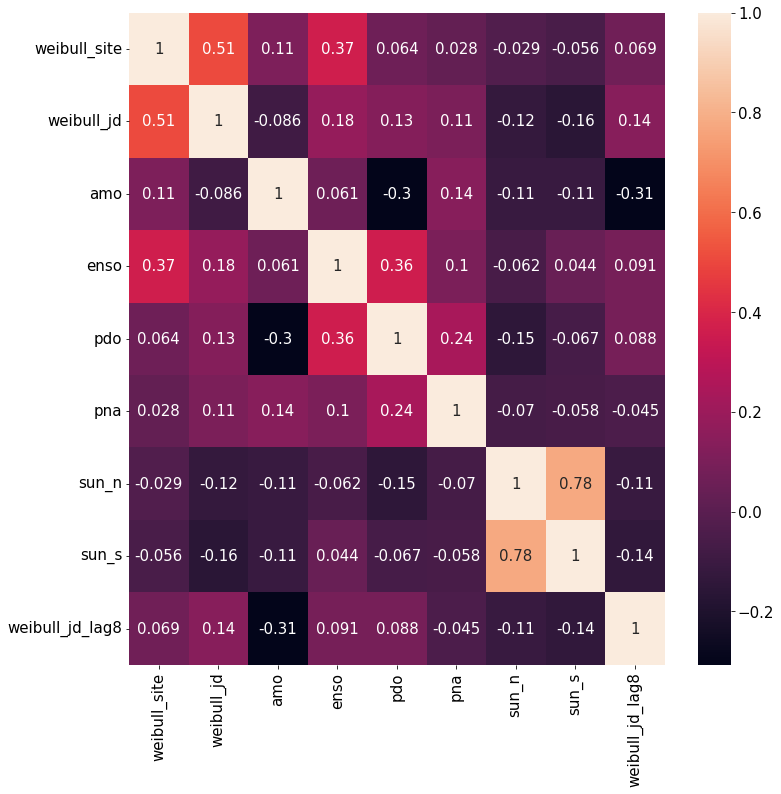

{'amo': SpearmanrResult(correlation=-0.30709958890847244, pvalue=6.903906454755575e-11), 'enso': SpearmanrResult(correlation=0.09100669004784616, pvalue=0.05876042182841014), 'pdo': SpearmanrResult(correlation=0.08774962858636154, pvalue=0.06844383377160172), 'pna': SpearmanrResult(correlation=-0.0445091901310316, pvalue=0.35606808272033863), 'sun_n': SpearmanrResult(correlation=-0.10830865056831891, pvalue=0.024369274560545367), 'sun_s': SpearmanrResult(correlation=-0.1382805727284042, pvalue=0.00398146775389111)}


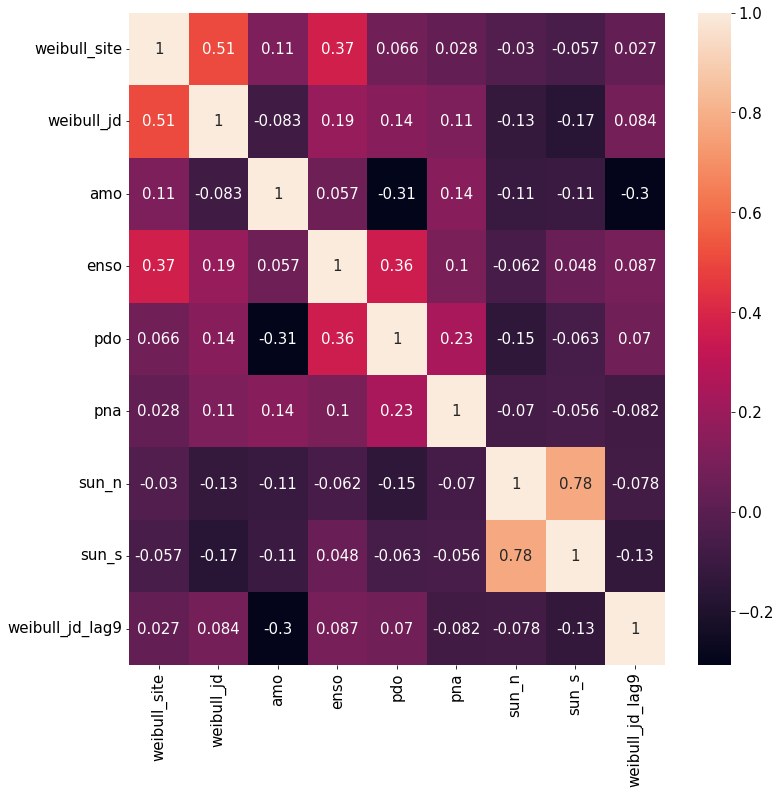

{'amo': SpearmanrResult(correlation=-0.2998643477904746, pvalue=2.0969103193115518e-10), 'enso': SpearmanrResult(correlation=0.0874025150111602, pvalue=0.06987437801471895), 'pdo': SpearmanrResult(correlation=0.07016840066935029, pvalue=0.14586415973706823), 'pna': SpearmanrResult(correlation=-0.08188667338586389, pvalue=0.08952154661835214), 'sun_n': SpearmanrResult(correlation=-0.07759970656251712, pvalue=0.10766886793887041), 'sun_s': SpearmanrResult(correlation=-0.1331356426976109, pvalue=0.005635400199281749)}


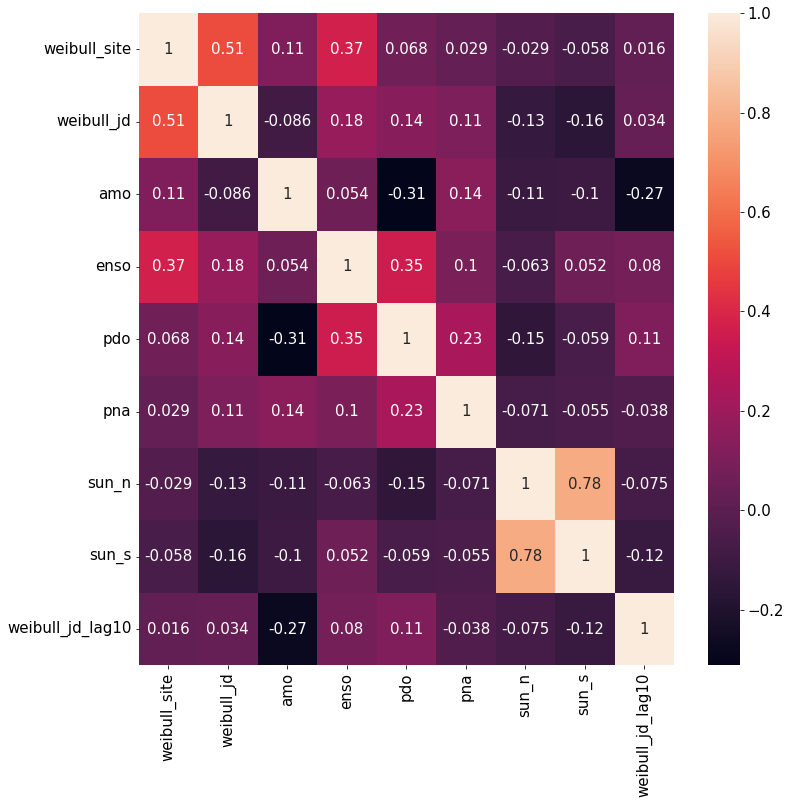

{'amo': SpearmanrResult(correlation=-0.27495980120238284, pvalue=6.742999355706845e-09), 'enso': SpearmanrResult(correlation=0.08017944404842646, pvalue=0.09681976878694966), 'pdo': SpearmanrResult(correlation=0.10956275892002985, pvalue=0.02307609109642075), 'pna': SpearmanrResult(correlation=-0.0383320568840598, pvalue=0.42786632485364406), 'sun_n': SpearmanrResult(correlation=-0.07459985653761297, pvalue=0.12244655746634218), 'sun_s': SpearmanrResult(correlation=-0.11580833848292772, pvalue=0.01628115051088118)}


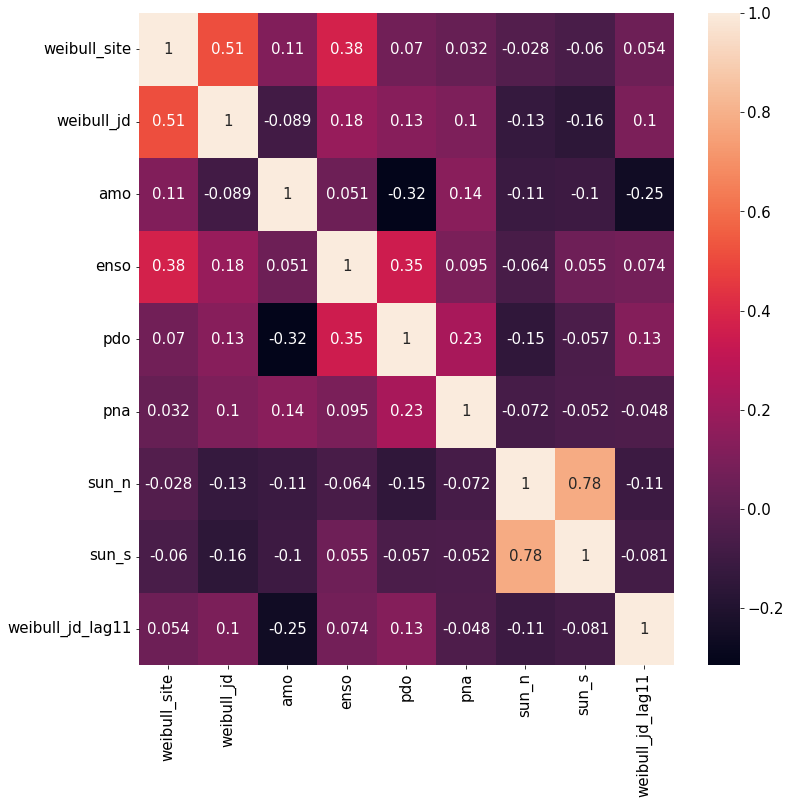

{'amo': SpearmanrResult(correlation=-0.254769780367673, pvalue=8.794916290881521e-08), 'enso': SpearmanrResult(correlation=0.07427922645588883, pvalue=0.1245068362970734), 'pdo': SpearmanrResult(correlation=0.12594007610779656, pvalue=0.009019753266087735), 'pna': SpearmanrResult(correlation=-0.048301027044159374, pvalue=0.31823580205443197), 'sun_n': SpearmanrResult(correlation=-0.10730941357294675, pvalue=0.02624529752685775), 'sun_s': SpearmanrResult(correlation=-0.08096846953394198, pvalue=0.09395339702366723)}


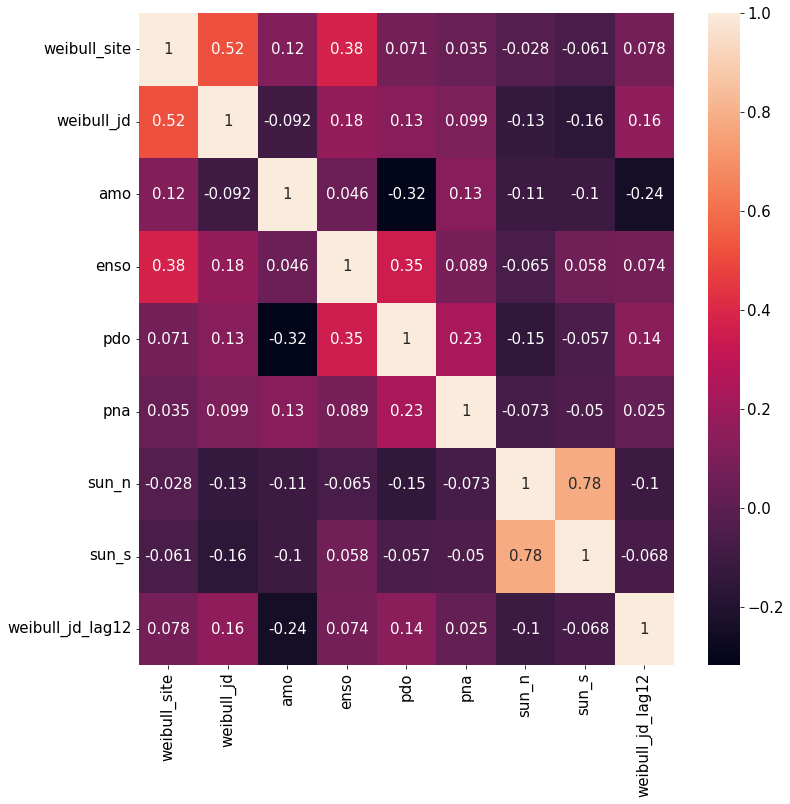

{'amo': SpearmanrResult(correlation=-0.240779427469972, pvalue=4.629377011936138e-07), 'enso': SpearmanrResult(correlation=0.07442916872902725, pvalue=0.12418741571298413), 'pdo': SpearmanrResult(correlation=0.13899112771220987, pvalue=0.003963427895623828), 'pna': SpearmanrResult(correlation=0.02518642745728013, pvalue=0.6033288313877114), 'sun_n': SpearmanrResult(correlation=-0.10487330069736758, pvalue=0.03006175947403355), 'sun_s': SpearmanrResult(correlation=-0.06815568806965022, pvalue=0.15927047760787136)}


In [49]:
periods = np.arange(-1, -13, -1)
for period in periods:
    df_11["weibull_jd_lag" + str(period)[1:]] = df_11["weibull_jd"].shift(periods=period)
    df_11_cross_corr = df_11[df_11["weibull_jd_lag" + str(period)[1:]].notnull()]

    corr_matrix = df_11_cross_corr.corr(method='spearman')

    f, ax = plt.subplots(figsize=(12,12))
    ax = sns.heatmap(corr_matrix, annot=True)
    ax = plt.rcParams.update({'font.size': 15})
    plt.show()

    weibull_jd_spearman = {}
    for var in df_11_cross_corr.columns.values[2:-1]:
        weibull_jd_spearman[var] = spearmanr(
            df_11_cross_corr["weibull_jd_lag" + str(period)[1:]], 
            df_11_cross_corr[var]
        )
    print(weibull_jd_spearman)

    df_11 = df_11.drop(["weibull_jd_lag" + str(period)[1:]], axis=1)

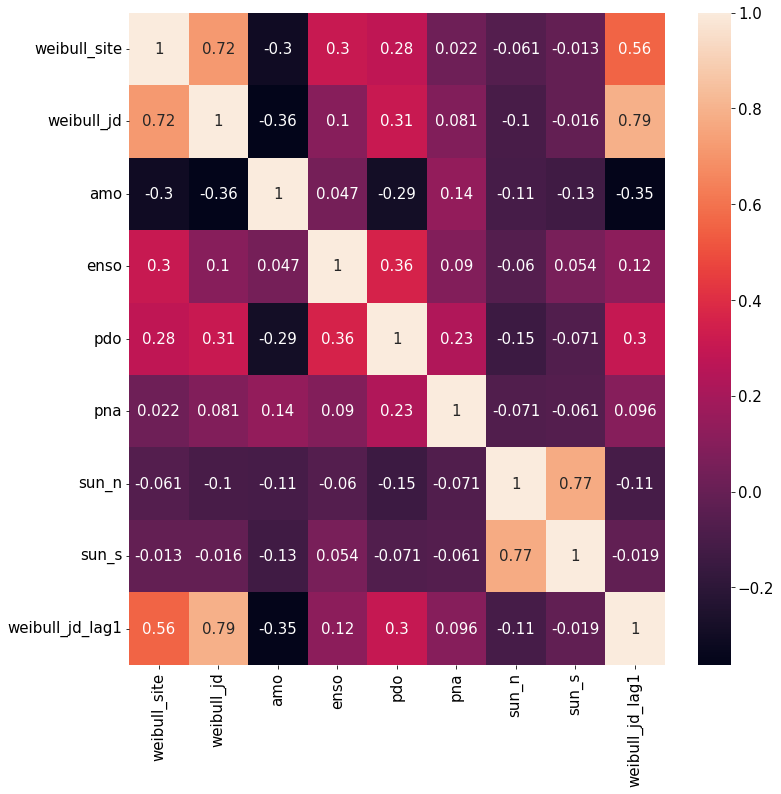

{'amo': SpearmanrResult(correlation=-0.35187620070644643, pvalue=3.0570667543629624e-14), 'enso': SpearmanrResult(correlation=0.1186216025669776, pvalue=0.012878943695658538), 'pdo': SpearmanrResult(correlation=0.30226244067920155, pvalue=1.0001812852129939e-10), 'pna': SpearmanrResult(correlation=0.09574443528045047, pvalue=0.044967617944826226), 'sun_n': SpearmanrResult(correlation=-0.1103077383814578, pvalue=0.0207957253276669), 'sun_s': SpearmanrResult(correlation=-0.019470224760417664, pvalue=0.6841387449302341)}


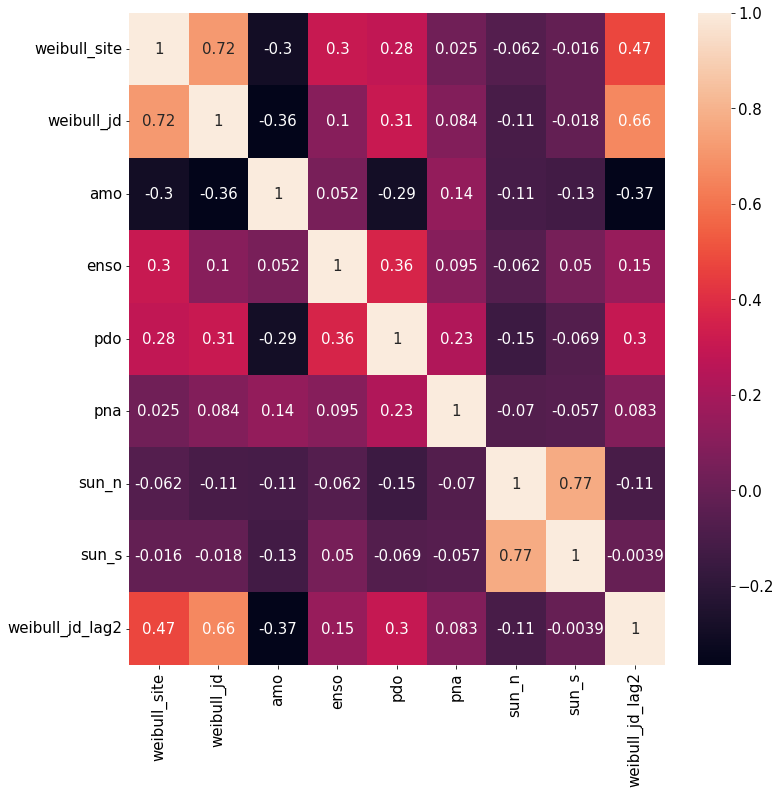

{'amo': SpearmanrResult(correlation=-0.36586219415128934, pvalue=2.5537007168013855e-15), 'enso': SpearmanrResult(correlation=0.14653725082616817, pvalue=0.0021075181681376965), 'pdo': SpearmanrResult(correlation=0.2982322273758169, pvalue=1.9000049385666015e-10), 'pna': SpearmanrResult(correlation=0.08295064870093517, pvalue=0.08290796359395643), 'sun_n': SpearmanrResult(correlation=-0.10676259501218816, pvalue=0.025458075640555182), 'sun_s': SpearmanrResult(correlation=-0.003885281878319643, pvalue=0.9353776399351585)}


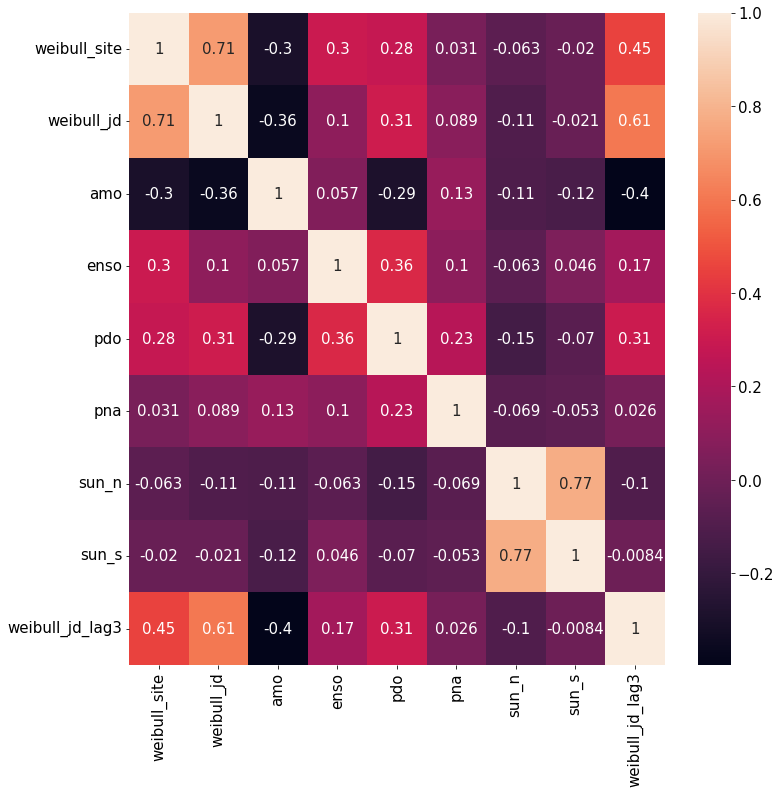

{'amo': SpearmanrResult(correlation=-0.39590087623672165, pvalue=7.526153431217298e-18), 'enso': SpearmanrResult(correlation=0.16991132360983988, pvalue=0.0003601000876645397), 'pdo': SpearmanrResult(correlation=0.305492028687155, pvalue=6.822862382907547e-11), 'pna': SpearmanrResult(correlation=0.025642894983512486, pvalue=0.5929226011003574), 'sun_n': SpearmanrResult(correlation=-0.10148857114107462, pvalue=0.0339239193558077), 'sun_s': SpearmanrResult(correlation=-0.008401434327747167, pvalue=0.8609788836634734)}


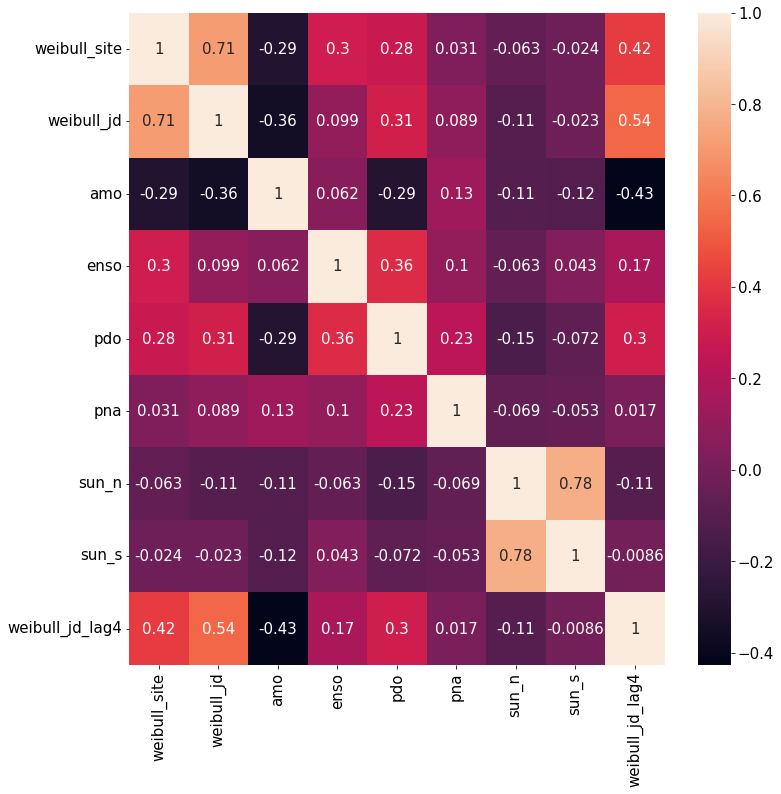

{'amo': SpearmanrResult(correlation=-0.426890364472438, pvalue=9.741196090567344e-21), 'enso': SpearmanrResult(correlation=0.17277275000042308, pvalue=0.00028947908899815253), 'pdo': SpearmanrResult(correlation=0.3036853242690147, pvalue=9.386657067844731e-11), 'pna': SpearmanrResult(correlation=0.016730187793395714, pvalue=0.7275712672196843), 'sun_n': SpearmanrResult(correlation=-0.10717294703834938, pvalue=0.02523008985595748), 'sun_s': SpearmanrResult(correlation=-0.00859265028152264, pvalue=0.8580099121886856)}


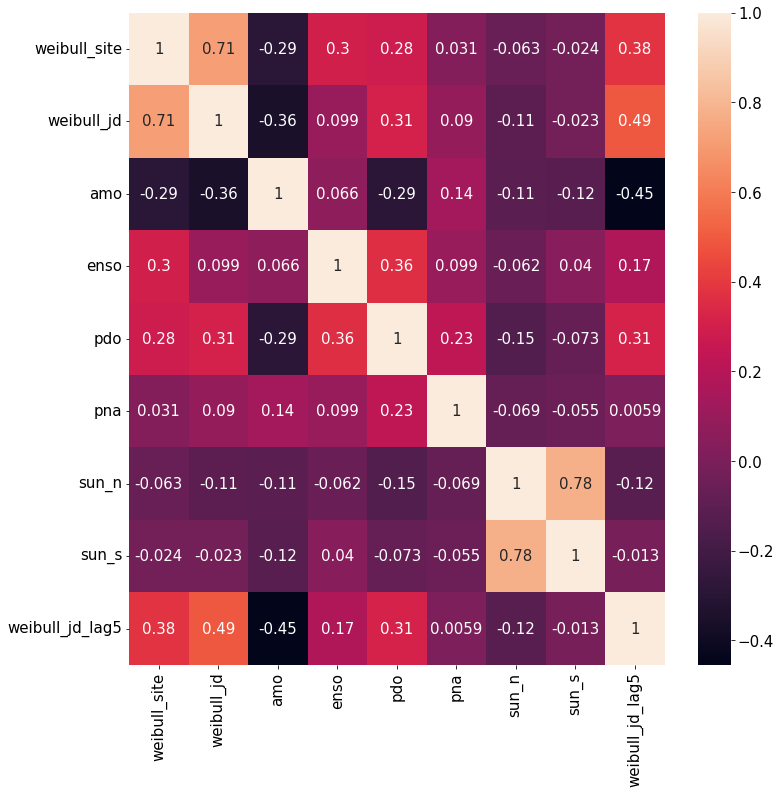

{'amo': SpearmanrResult(correlation=-0.45477738819988206, pvalue=1.3664382022928176e-23), 'enso': SpearmanrResult(correlation=0.17292856364784187, pvalue=0.00029045267283321375), 'pdo': SpearmanrResult(correlation=0.3142925828997191, pvalue=1.9875847694445606e-11), 'pna': SpearmanrResult(correlation=0.005901642403862019, pvalue=0.9023166234909779), 'sun_n': SpearmanrResult(correlation=-0.11505036541289357, pvalue=0.01636653320703217), 'sun_s': SpearmanrResult(correlation=-0.01325604769453906, pvalue=0.7827835781892927)}


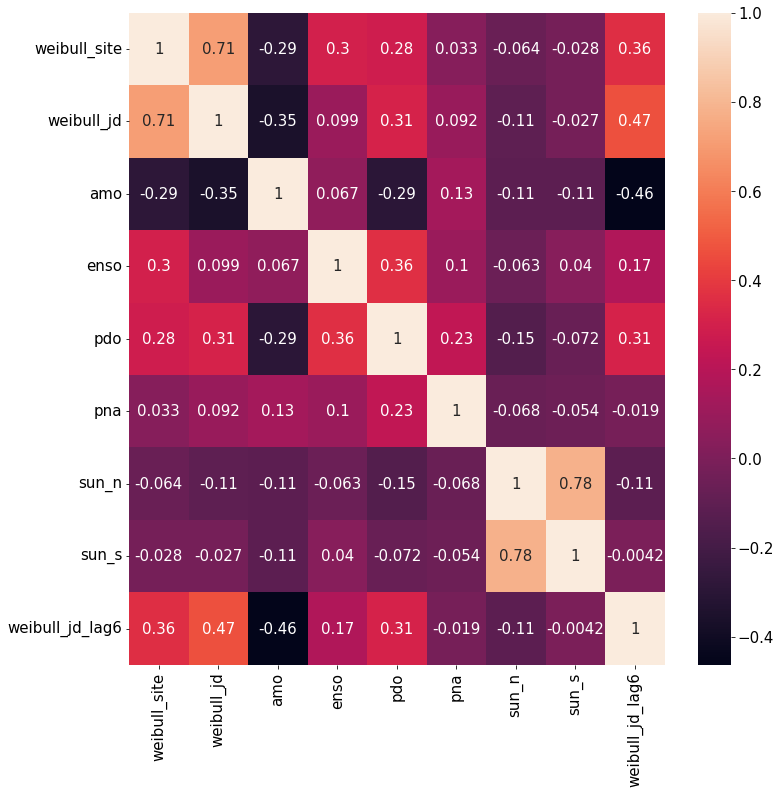

{'amo': SpearmanrResult(correlation=-0.46298256511651087, pvalue=1.9228100512976222e-24), 'enso': SpearmanrResult(correlation=0.17230294803617574, pvalue=0.0003107331488789119), 'pdo': SpearmanrResult(correlation=0.3119220171103036, pvalue=3.012536886480543e-11), 'pna': SpearmanrResult(correlation=-0.019420097785126808, pvalue=0.6866218565344142), 'sun_n': SpearmanrResult(correlation=-0.10890804997263587, pvalue=0.023264996443985518), 'sun_s': SpearmanrResult(correlation=-0.0042348888563246544, pvalue=0.9299005333660619)}


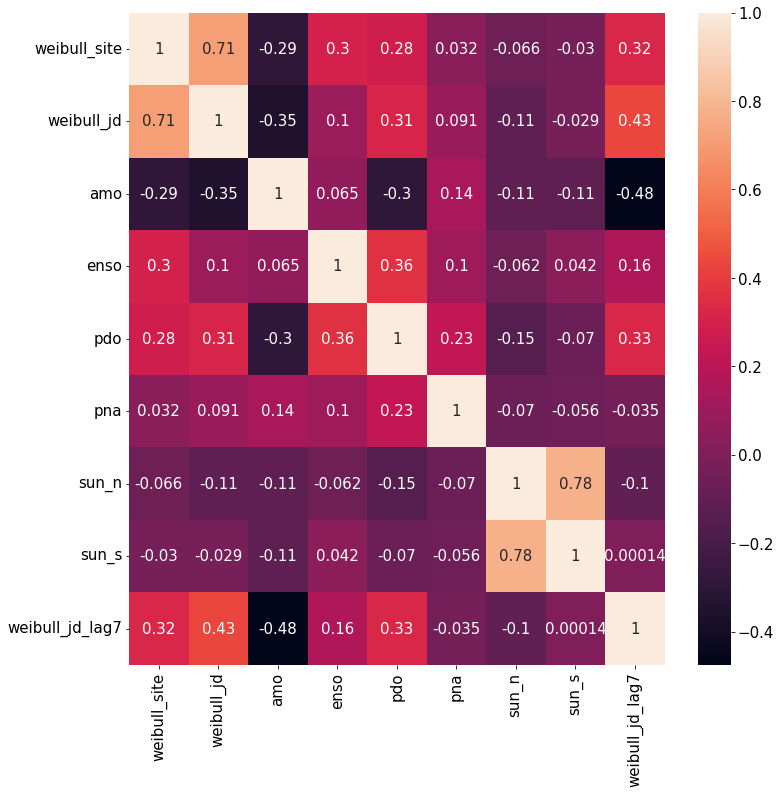

{'amo': SpearmanrResult(correlation=-0.4751391534085953, pvalue=9.063242996776135e-26), 'enso': SpearmanrResult(correlation=0.1625766530067479, pvalue=0.0006841816785510888), 'pdo': SpearmanrResult(correlation=0.3283270121174375, pvalue=2.4263627842143968e-12), 'pna': SpearmanrResult(correlation=-0.034507994638067516, pvalue=0.47386632727480815), 'sun_n': SpearmanrResult(correlation=-0.10157778296346907, pvalue=0.0345960670676761), 'sun_s': SpearmanrResult(correlation=0.00013990754941654247, pvalue=0.9976838465565674)}


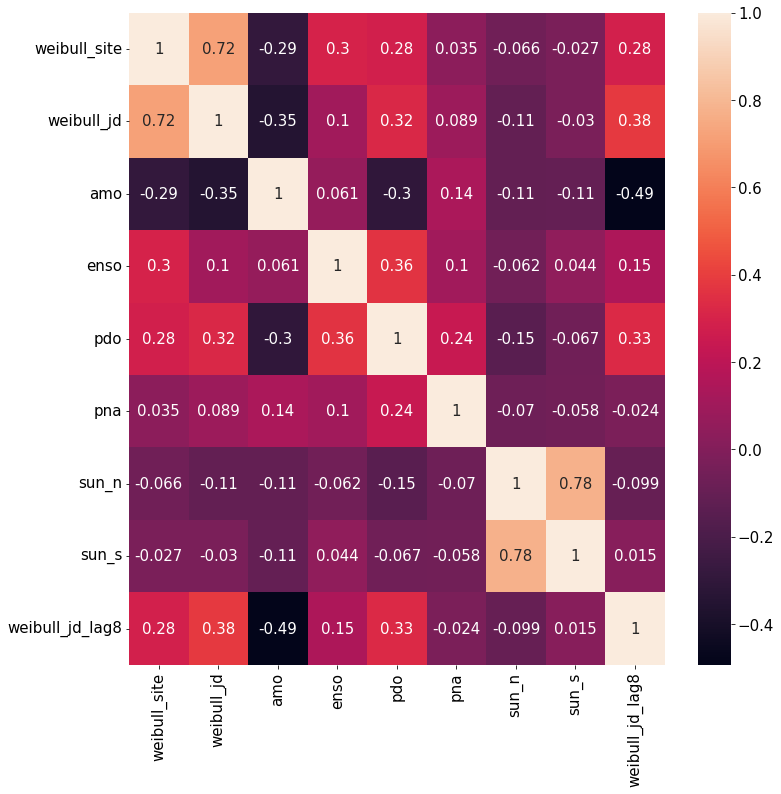

{'amo': SpearmanrResult(correlation=-0.49382736860723664, pvalue=6.125128012001281e-28), 'enso': SpearmanrResult(correlation=0.1478370760263361, pvalue=0.0020646043388519073), 'pdo': SpearmanrResult(correlation=0.32772573715847364, pvalue=2.833016615964592e-12), 'pna': SpearmanrResult(correlation=-0.024390046047541237, pvalue=0.6131767966217276), 'sun_n': SpearmanrResult(correlation=-0.09916623626086529, pvalue=0.03937557431645197), 'sun_s': SpearmanrResult(correlation=0.015497361134719684, pvalue=0.748064418691961)}


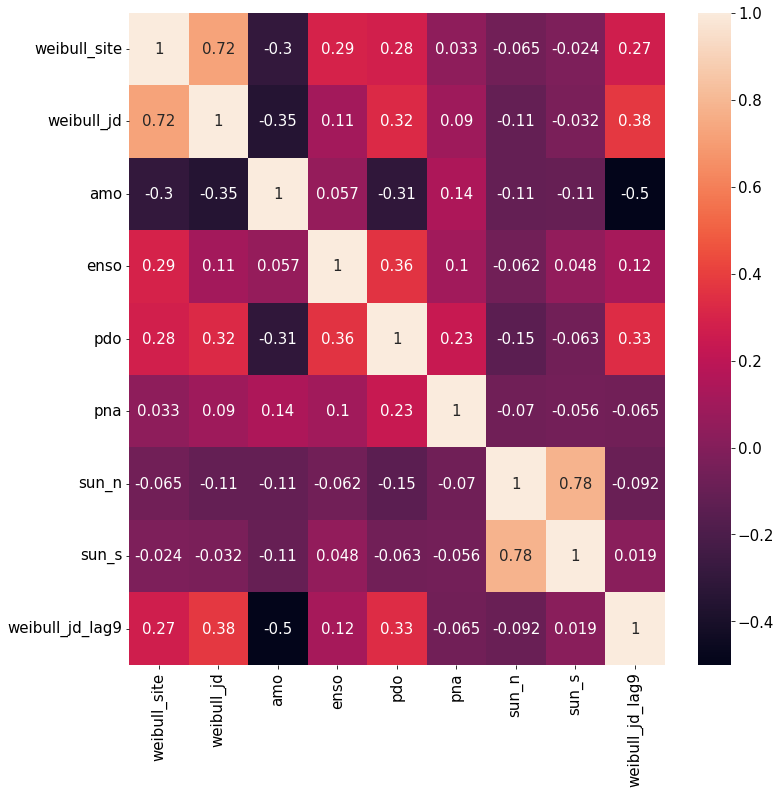

{'amo': SpearmanrResult(correlation=-0.4999178075217968, pvalue=1.2428957600395231e-28), 'enso': SpearmanrResult(correlation=0.11890273137612745, pvalue=0.013508113837850458), 'pdo': SpearmanrResult(correlation=0.33306557975478024, pvalue=1.2637984467177074e-12), 'pna': SpearmanrResult(correlation=-0.06541652962071076, pvalue=0.17522940887544133), 'sun_n': SpearmanrResult(correlation=-0.09157519685960375, pvalue=0.05748268162956288), 'sun_s': SpearmanrResult(correlation=0.01913466539366046, pvalue=0.6920101603130082)}


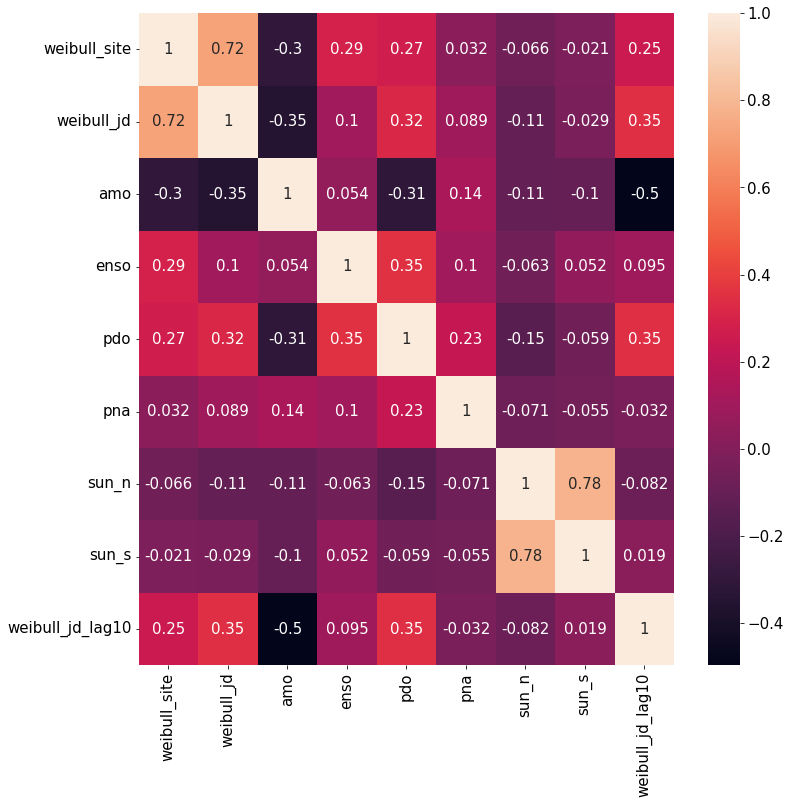

{'amo': SpearmanrResult(correlation=-0.4968780687572364, pvalue=3.4249687166474944e-28), 'enso': SpearmanrResult(correlation=0.09459427845778372, pvalue=0.04996817390761578), 'pdo': SpearmanrResult(correlation=0.3485260664194058, pvalue=1.0013243932777362e-13), 'pna': SpearmanrResult(correlation=-0.03215649636510714, pvalue=0.5060234360404026), 'sun_n': SpearmanrResult(correlation=-0.08219600799147807, pvalue=0.08868548921796918), 'sun_s': SpearmanrResult(correlation=0.019257305539362123, pvalue=0.6904809065740437)}


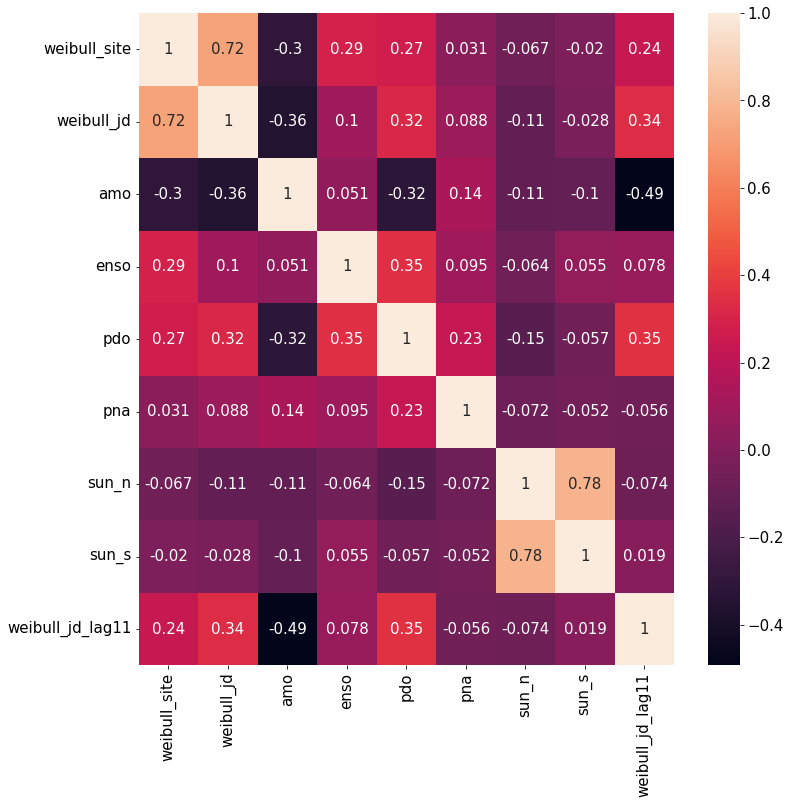

{'amo': SpearmanrResult(correlation=-0.49340662535543267, pvalue=1.0519590917502791e-27), 'enso': SpearmanrResult(correlation=0.07768768437020535, pvalue=0.10809249583742876), 'pdo': SpearmanrResult(correlation=0.35357440782953203, pvalue=4.449557474514449e-14), 'pna': SpearmanrResult(correlation=-0.056476749325737645, pvalue=0.24309606261230937), 'sun_n': SpearmanrResult(correlation=-0.07362852338874545, pvalue=0.127850053983076), 'sun_s': SpearmanrResult(correlation=0.018588492602691634, pvalue=0.7010373286579825)}


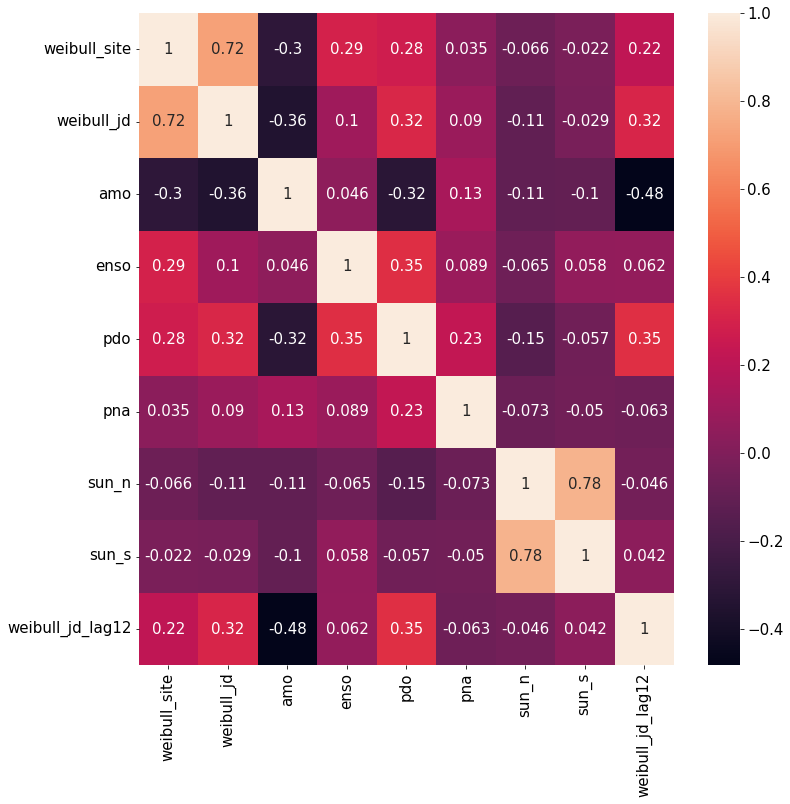

{'amo': SpearmanrResult(correlation=-0.4830109256821208, pvalue=2.1136233980317393e-26), 'enso': SpearmanrResult(correlation=0.06167573106238885, pvalue=0.2028624805786993), 'pdo': SpearmanrResult(correlation=0.35393445534799284, pvalue=4.471444870754083e-14), 'pna': SpearmanrResult(correlation=-0.06276439710679403, pvalue=0.19498906488664586), 'sun_n': SpearmanrResult(correlation=-0.04644073579557563, pvalue=0.337820337087654), 'sun_s': SpearmanrResult(correlation=0.04169201671932638, pvalue=0.3895780478244443)}


In [50]:
periods = np.arange(-1, -13, -1)
for period in periods:
    df_13["weibull_jd_lag" + str(period)[1:]] = df_13["weibull_jd"].shift(periods=period)
    df_13_cross_corr = df_13[df_13["weibull_jd_lag" + str(period)[1:]].notnull()]

    corr_matrix = df_13_cross_corr.corr(method='spearman')

    f, ax = plt.subplots(figsize=(12,12))
    ax = sns.heatmap(corr_matrix, annot=True)
    ax = plt.rcParams.update({'font.size': 15})
    plt.show()

    weibull_jd_spearman = {}
    for var in df_13_cross_corr.columns.values[2:-1]:
        weibull_jd_spearman[var] = spearmanr(
            df_13_cross_corr["weibull_jd_lag" + str(period)[1:]], 
            df_13_cross_corr[var]
        )
    print(weibull_jd_spearman)

    df_13 = df_13.drop(["weibull_jd_lag" + str(period)[1:]], axis=1)

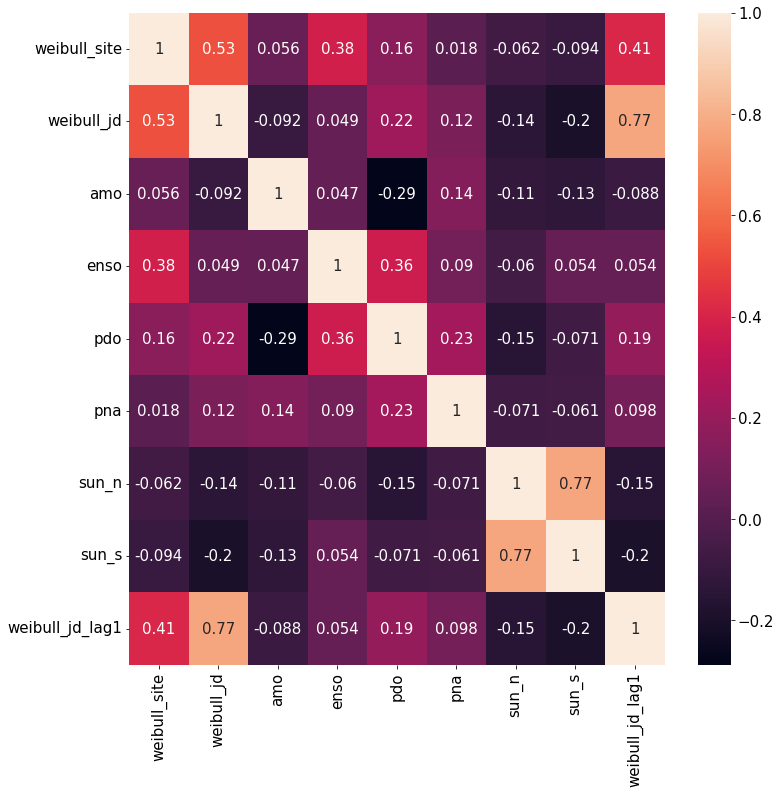

{'amo': SpearmanrResult(correlation=-0.08816857812342156, pvalue=0.0649407671587867), 'enso': SpearmanrResult(correlation=0.05368439312852411, pvalue=0.2616858105737819), 'pdo': SpearmanrResult(correlation=0.19199691844124903, pvalue=5.142726404332336e-05), 'pna': SpearmanrResult(correlation=0.09845509264777579, pvalue=0.03920831621324032), 'sun_n': SpearmanrResult(correlation=-0.1497997621901615, pvalue=0.0016468289337701822), 'sun_s': SpearmanrResult(correlation=-0.19526102966258932, pvalue=3.8014861393536895e-05)}


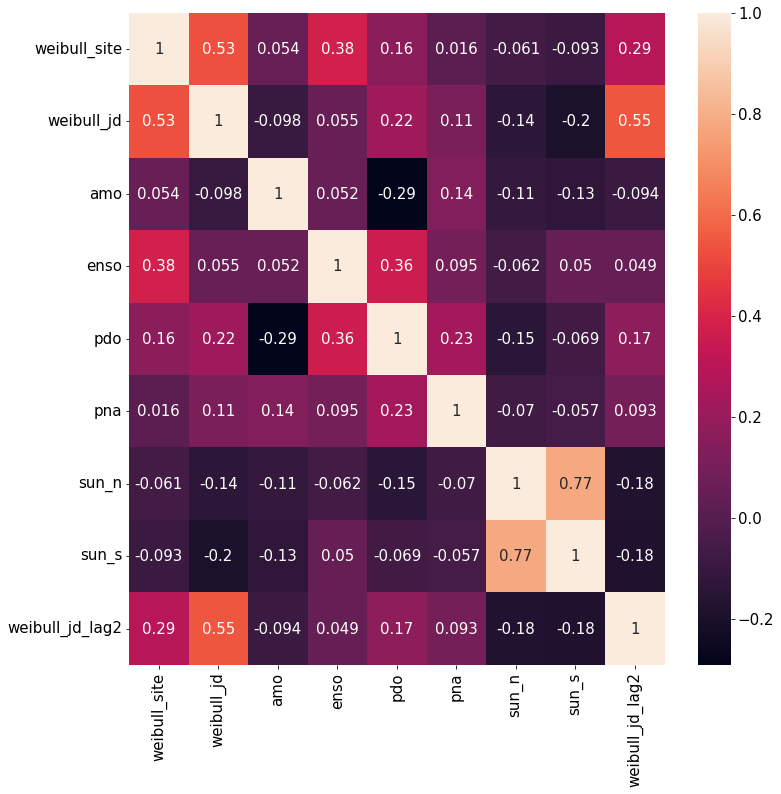

{'amo': SpearmanrResult(correlation=-0.09358586249973211, pvalue=0.05031132472032158), 'enso': SpearmanrResult(correlation=0.04905888972191209, pvalue=0.3056419351907054), 'pdo': SpearmanrResult(correlation=0.17174032802993167, pvalue=0.00030519414106889496), 'pna': SpearmanrResult(correlation=0.09308132830834111, pvalue=0.05156960557358088), 'sun_n': SpearmanrResult(correlation=-0.17566534009212925, pvalue=0.00022017555100148174), 'sun_s': SpearmanrResult(correlation=-0.1839929931178652, pvalue=0.00010759342888039132)}


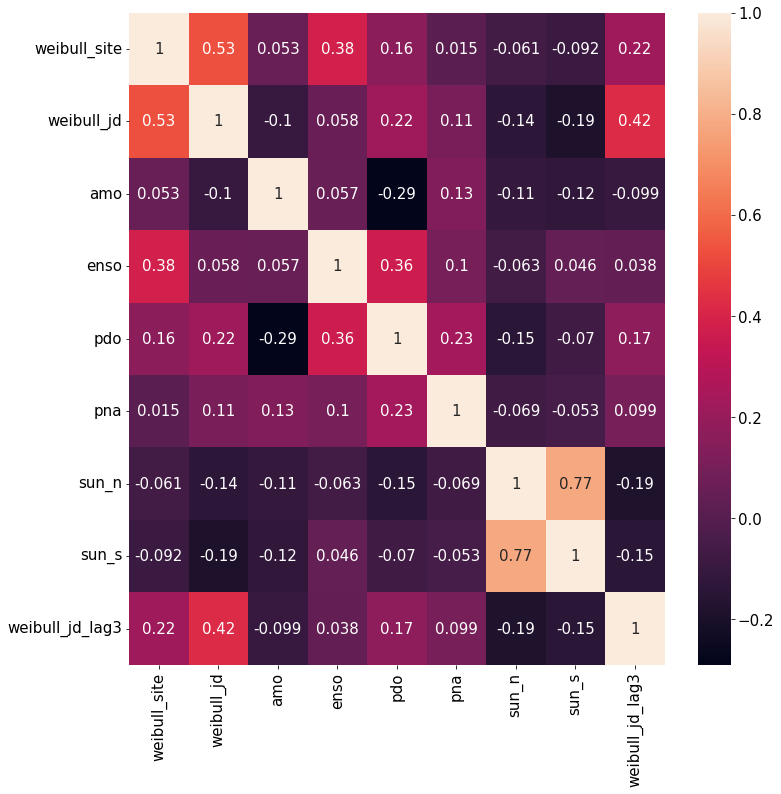

{'amo': SpearmanrResult(correlation=-0.0994205303261313, pvalue=0.037751942248186204), 'enso': SpearmanrResult(correlation=0.03783427016212197, pvalue=0.4301556150277597), 'pdo': SpearmanrResult(correlation=0.17126441136741935, pvalue=0.0003224561313218407), 'pna': SpearmanrResult(correlation=0.09877096601138931, pvalue=0.0390274549185756), 'sun_n': SpearmanrResult(correlation=-0.18501454385352667, pvalue=0.00010016038452838479), 'sun_s': SpearmanrResult(correlation=-0.1485725113380448, pvalue=0.001844155786750463)}


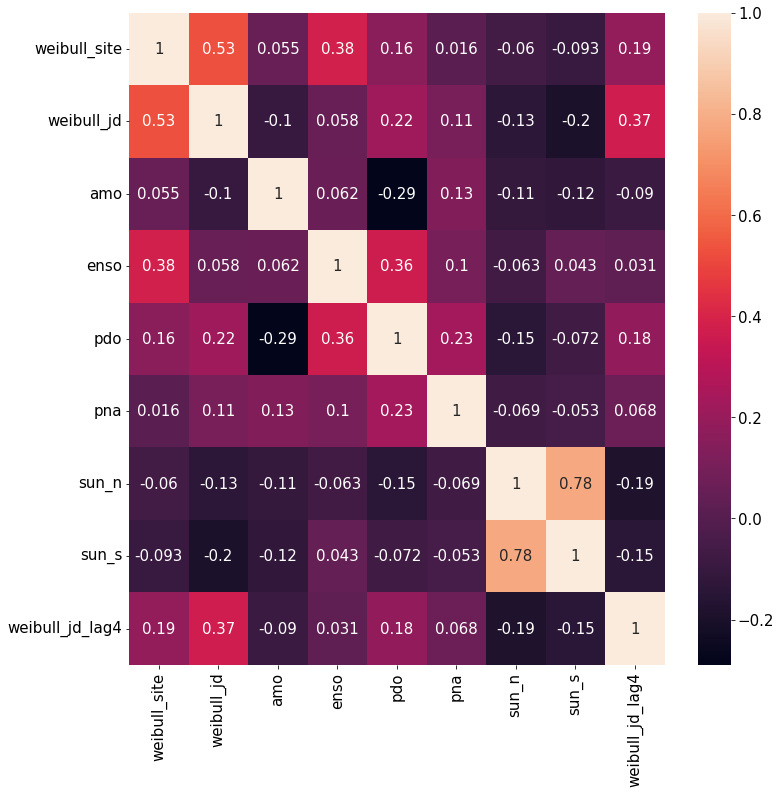

{'amo': SpearmanrResult(correlation=-0.08972297072681742, pvalue=0.06122470350415465), 'enso': SpearmanrResult(correlation=0.03146369768585758, pvalue=0.512301974749843), 'pdo': SpearmanrResult(correlation=0.18179792502230094, pvalue=0.0001350794130868136), 'pna': SpearmanrResult(correlation=0.06780370413031404, pvalue=0.15755418085271888), 'sun_n': SpearmanrResult(correlation=-0.186237423706085, pvalue=9.15863774503379e-05), 'sun_s': SpearmanrResult(correlation=-0.14807201784537927, pvalue=0.0019347863359438285)}


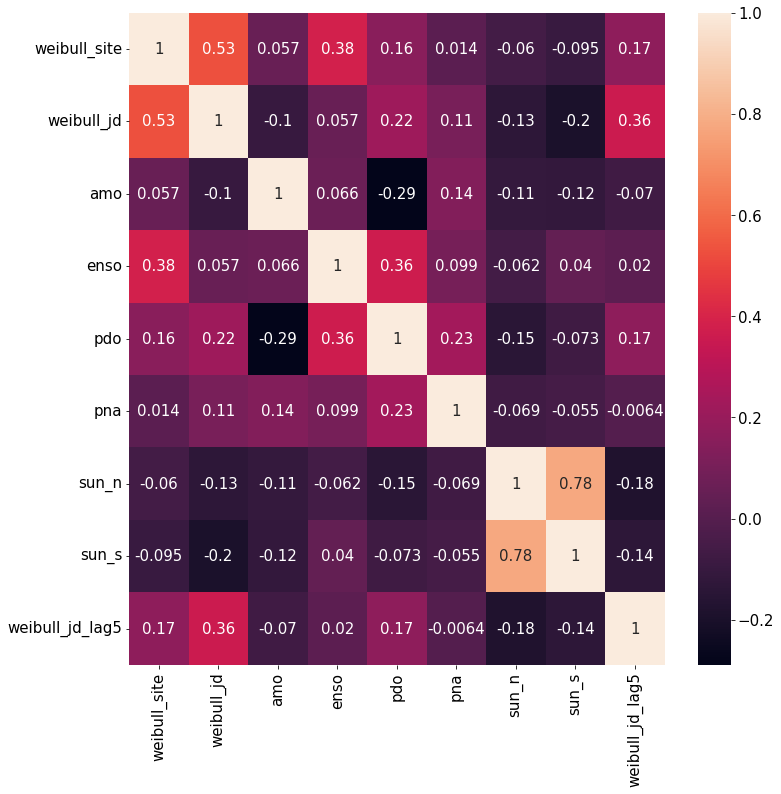

{'amo': SpearmanrResult(correlation=-0.06979685182064625, pvalue=0.1461368851274839), 'enso': SpearmanrResult(correlation=0.01968802787850731, pvalue=0.6821841051921727), 'pdo': SpearmanrResult(correlation=0.17139224253932364, pvalue=0.0003294251907414265), 'pna': SpearmanrResult(correlation=-0.006404647779289123, pvalue=0.8940379561150731), 'sun_n': SpearmanrResult(correlation=-0.18261480101848415, pvalue=0.00012812864193806879), 'sun_s': SpearmanrResult(correlation=-0.13537634728783238, pvalue=0.0046780631405613305)}


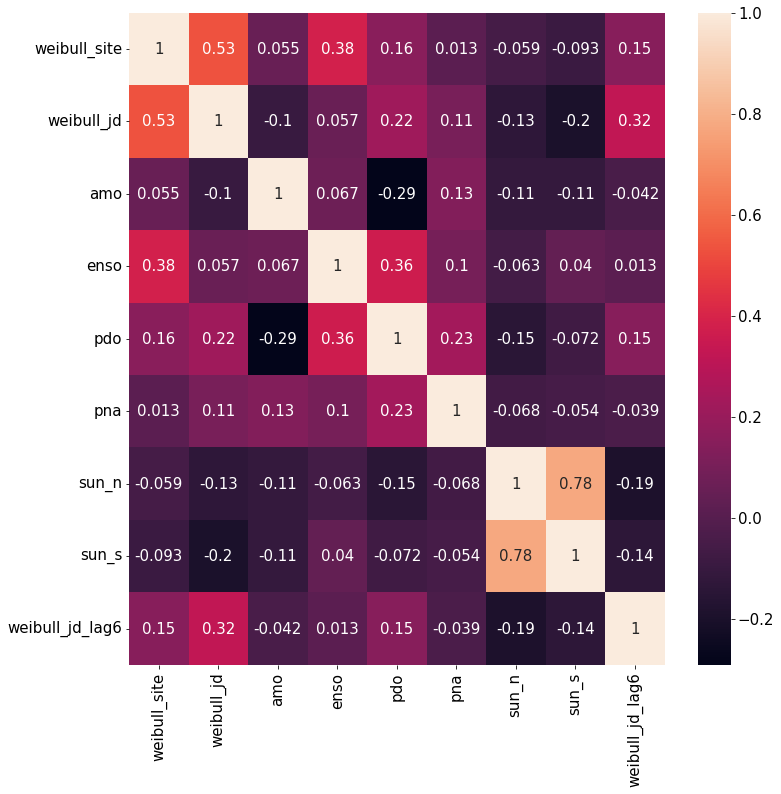

{'amo': SpearmanrResult(correlation=-0.041507973056172834, pvalue=0.3883575925873123), 'enso': SpearmanrResult(correlation=0.012624877777783384, pvalue=0.7931196105242968), 'pdo': SpearmanrResult(correlation=0.14945041483351015, pvalue=0.001796130816912994), 'pna': SpearmanrResult(correlation=-0.03929031653884938, pvalue=0.4142275161189891), 'sun_n': SpearmanrResult(correlation=-0.19483246973014703, pvalue=4.381190737500983e-05), 'sun_s': SpearmanrResult(correlation=-0.13762521355188118, pvalue=0.0040722280305694695)}


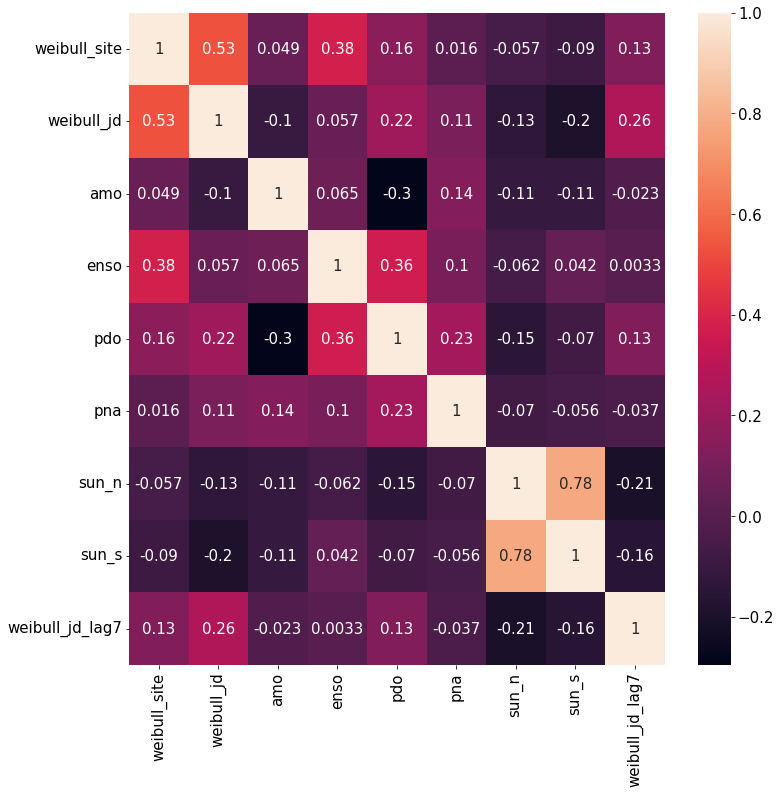

{'amo': SpearmanrResult(correlation=-0.022932010160267025, pvalue=0.6341688360751945), 'enso': SpearmanrResult(correlation=0.003324744898872149, pvalue=0.9450026233481702), 'pdo': SpearmanrResult(correlation=0.1294474009025921, pvalue=0.0069926011643016844), 'pna': SpearmanrResult(correlation=-0.037177986503045955, pvalue=0.4403192092231839), 'sun_n': SpearmanrResult(correlation=-0.20916912646210814, pvalue=1.1409076558115367e-05), 'sun_s': SpearmanrResult(correlation=-0.1588165816393857, pvalue=0.000912252331845238)}


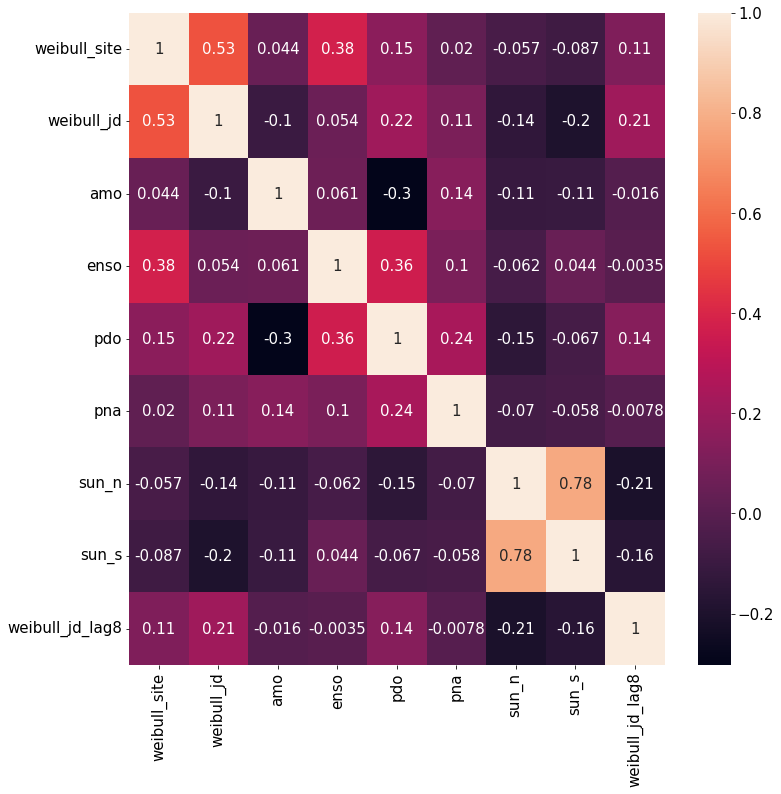

{'amo': SpearmanrResult(correlation=-0.016119867471338315, pvalue=0.7383070350400553), 'enso': SpearmanrResult(correlation=-0.0034522657119355022, pvalue=0.9429629688642467), 'pdo': SpearmanrResult(correlation=0.13610436090500516, pvalue=0.004598690764368903), 'pna': SpearmanrResult(correlation=-0.007836391302783872, pvalue=0.8709854265600347), 'sun_n': SpearmanrResult(correlation=-0.2089989703352258, pvalue=1.1876769090531847e-05), 'sun_s': SpearmanrResult(correlation=-0.16417805367938113, pvalue=0.0006130742666492382)}


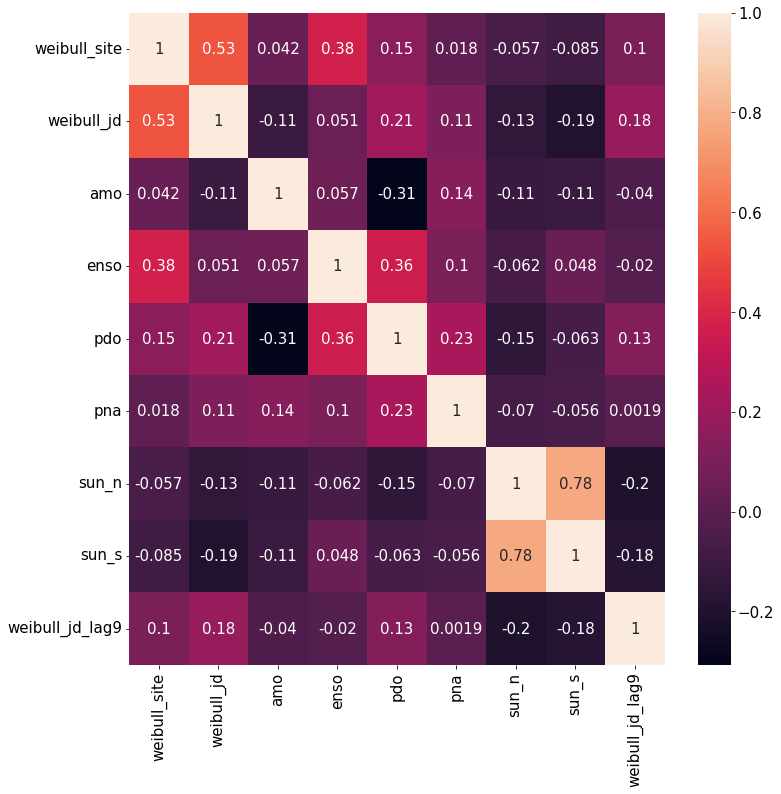

{'amo': SpearmanrResult(correlation=-0.0395896873107822, pvalue=0.41230856755784506), 'enso': SpearmanrResult(correlation=-0.01969627807106915, pvalue=0.683451783554333), 'pdo': SpearmanrResult(correlation=0.13127717262702987, pvalue=0.006347066657679689), 'pna': SpearmanrResult(correlation=0.001881017432013622, pvalue=0.9689401684056234), 'sun_n': SpearmanrResult(correlation=-0.20109159747599692, pvalue=2.6029346234506883e-05), 'sun_s': SpearmanrResult(correlation=-0.17613825569661445, pvalue=0.00023796446259096517)}


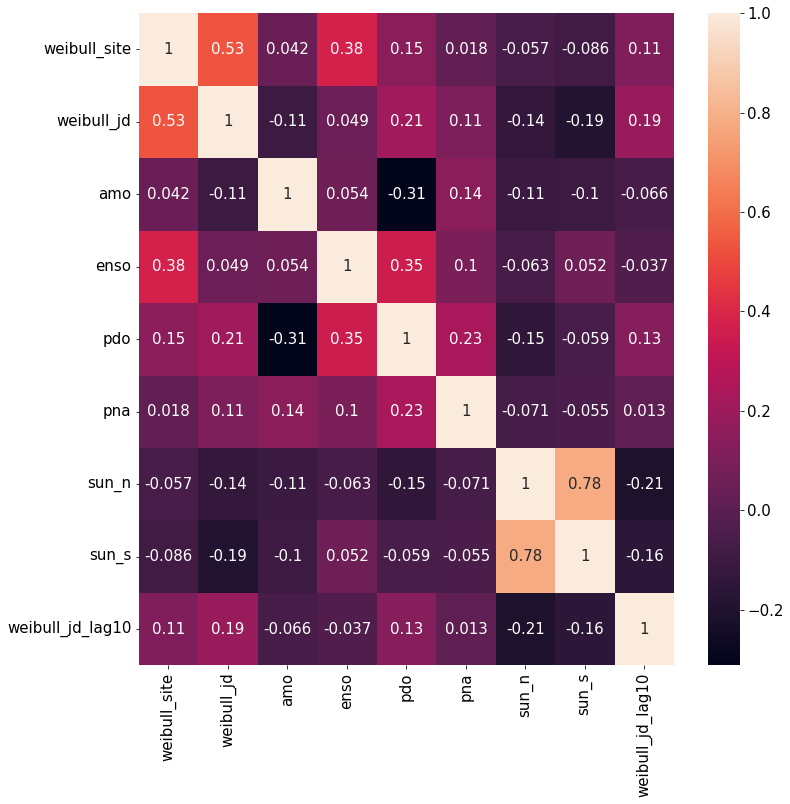

{'amo': SpearmanrResult(correlation=-0.06610487561329026, pvalue=0.17122234766875627), 'enso': SpearmanrResult(correlation=-0.036627751768419516, pvalue=0.44870690609412), 'pdo': SpearmanrResult(correlation=0.13267927050277417, pvalue=0.005860623278824259), 'pna': SpearmanrResult(correlation=0.013033930602512572, pvalue=0.7875433701011523), 'sun_n': SpearmanrResult(correlation=-0.21387527043953, pvalue=7.677871488865149e-06), 'sun_s': SpearmanrResult(correlation=-0.1584822800596294, pvalue=0.0009749526764766892)}


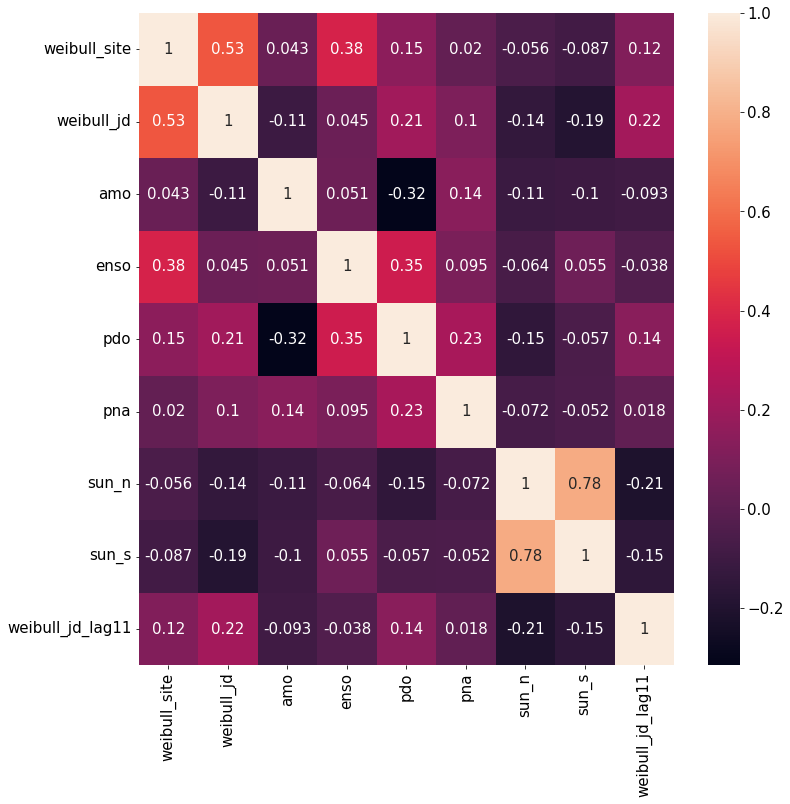

{'amo': SpearmanrResult(correlation=-0.09344268848195718, pvalue=0.053113023726817185), 'enso': SpearmanrResult(correlation=-0.037876117966469745, pvalue=0.43392431572762635), 'pdo': SpearmanrResult(correlation=0.1409860590638168, pvalue=0.0034306729940486447), 'pna': SpearmanrResult(correlation=0.01775303450022993, pvalue=0.71387078240434), 'sun_n': SpearmanrResult(correlation=-0.2104506282307428, pvalue=1.1050565261512855e-05), 'sun_s': SpearmanrResult(correlation=-0.1542904676358438, pvalue=0.0013477910302686273)}


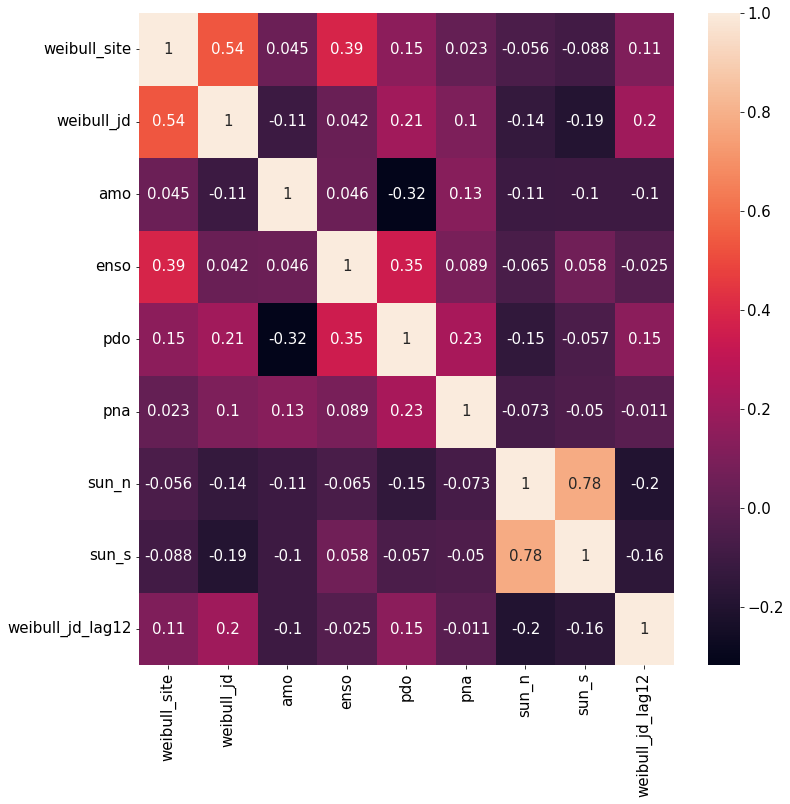

{'amo': SpearmanrResult(correlation=-0.10189251204552072, pvalue=0.03509234688108691), 'enso': SpearmanrResult(correlation=-0.025440500093533193, pvalue=0.5996784981447866), 'pdo': SpearmanrResult(correlation=0.145320583739367, pvalue=0.0025813716671143376), 'pna': SpearmanrResult(correlation=-0.0112251790298991, pvalue=0.8168825319586308), 'sun_n': SpearmanrResult(correlation=-0.19921492219840684, pvalue=3.3100032964309516e-05), 'sun_s': SpearmanrResult(correlation=-0.15855515331769934, pvalue=0.0009966665106876326)}


In [51]:
periods = np.arange(-1, -13, -1)
for period in periods:
    df_14["weibull_jd_lag" + str(period)[1:]] = df_14["weibull_jd"].shift(periods=period)
    df_14_cross_corr = df_14[df_14["weibull_jd_lag" + str(period)[1:]].notnull()]

    corr_matrix = df_14_cross_corr.corr(method='spearman')

    f, ax = plt.subplots(figsize=(12,12))
    ax = sns.heatmap(corr_matrix, annot=True)
    ax = plt.rcParams.update({'font.size': 15})
    plt.show()

    weibull_jd_spearman = {}
    for var in df_14_cross_corr.columns.values[2:-1]:
        weibull_jd_spearman[var] = spearmanr(
            df_14_cross_corr["weibull_jd_lag" + str(period)[1:]], 
            df_14_cross_corr[var]
        )
    print(weibull_jd_spearman)

    df_14 = df_14.drop(["weibull_jd_lag" + str(period)[1:]], axis=1)

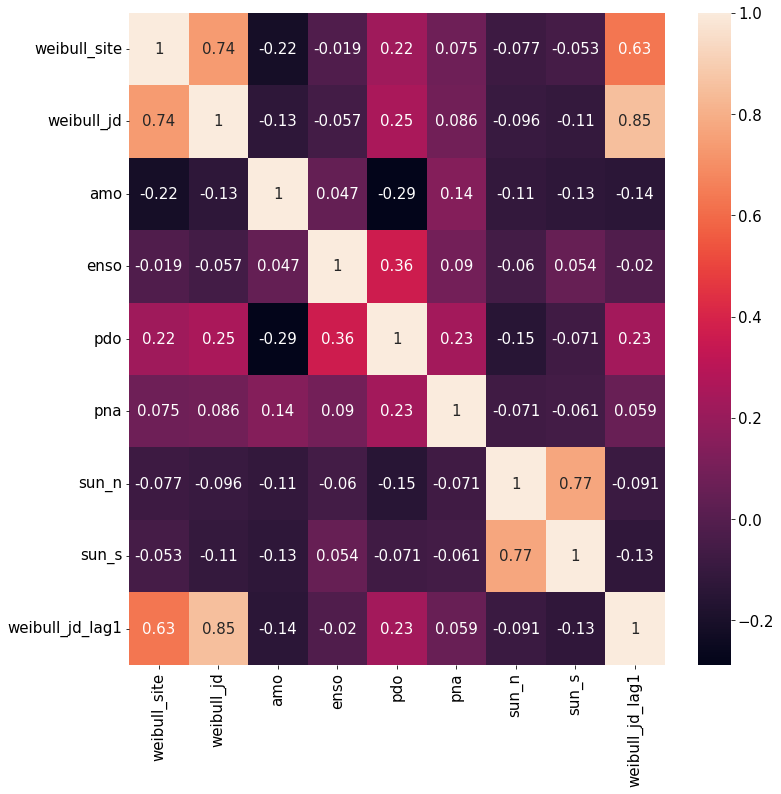

{'amo': SpearmanrResult(correlation=-0.14157438539343925, pvalue=0.0029505554943972476), 'enso': SpearmanrResult(correlation=-0.020412109427821984, pvalue=0.6697389884543308), 'pdo': SpearmanrResult(correlation=0.23484785759413168, pvalue=6.479561755794941e-07), 'pna': SpearmanrResult(correlation=0.05854407308876767, pvalue=0.22088151419514), 'sun_n': SpearmanrResult(correlation=-0.09060655127975295, pvalue=0.057839981163804344), 'sun_s': SpearmanrResult(correlation=-0.126440885926127, pvalue=0.007993830324940642)}


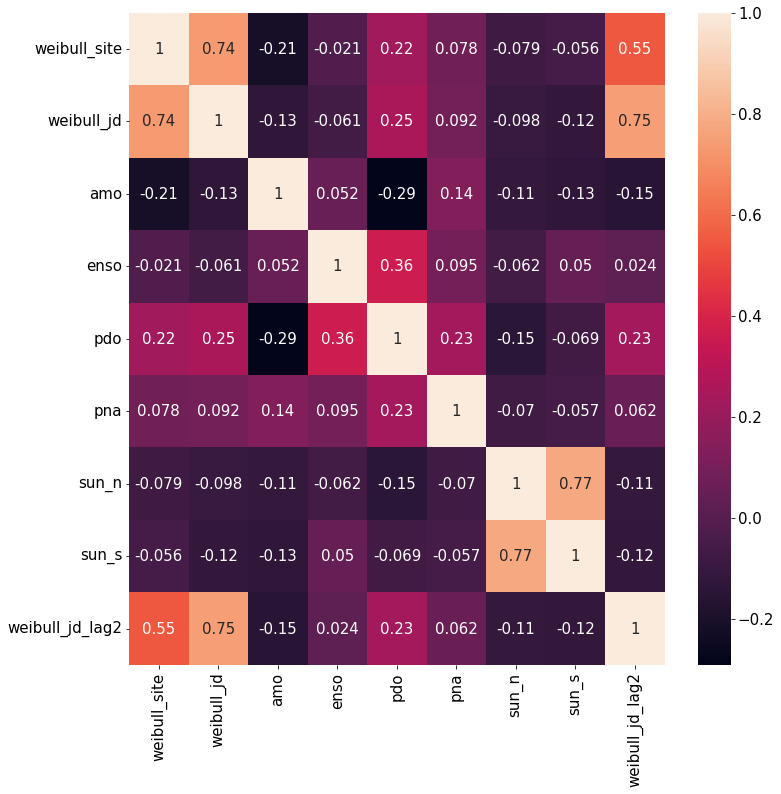

{'amo': SpearmanrResult(correlation=-0.15335539512637086, pvalue=0.0012846700139723646), 'enso': SpearmanrResult(correlation=0.023868028543846242, pvalue=0.6183682031635425), 'pdo': SpearmanrResult(correlation=0.23319960382772684, pvalue=8.024964919700256e-07), 'pna': SpearmanrResult(correlation=0.06155238139508288, pvalue=0.19853587345789342), 'sun_n': SpearmanrResult(correlation=-0.11118024444794534, pvalue=0.019943950600613866), 'sun_s': SpearmanrResult(correlation=-0.11590840111534033, pvalue=0.015222723517010577)}


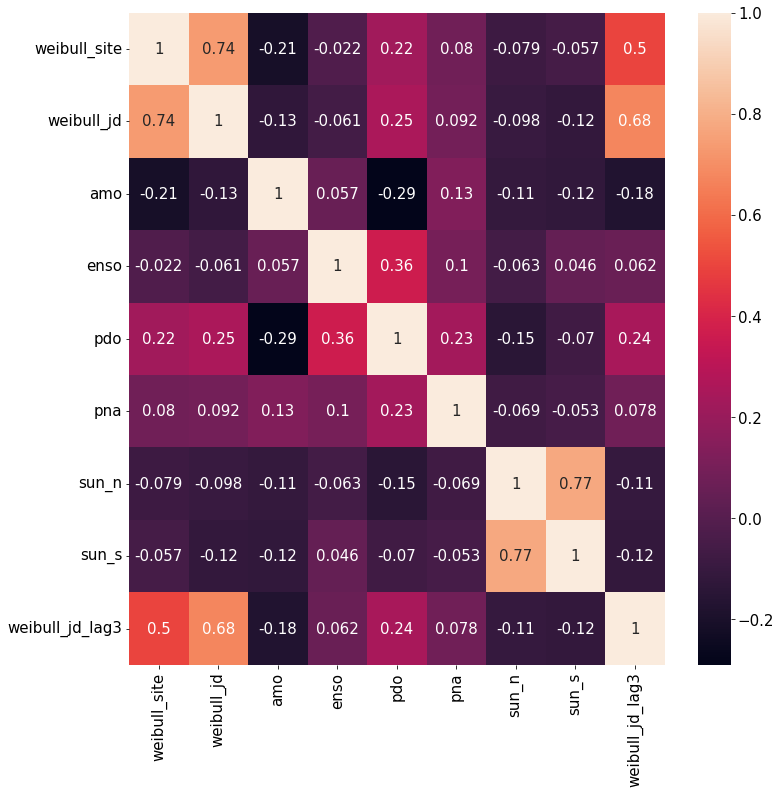

{'amo': SpearmanrResult(correlation=-0.17626026148249269, pvalue=0.00021296449141901556), 'enso': SpearmanrResult(correlation=0.061999940544460314, pvalue=0.19579908626156678), 'pdo': SpearmanrResult(correlation=0.2445380573701867, pvalue=2.2656445869411773e-07), 'pna': SpearmanrResult(correlation=0.07836413690168732, pvalue=0.10184142125308718), 'sun_n': SpearmanrResult(correlation=-0.10819427856393529, pvalue=0.023702494458067744), 'sun_s': SpearmanrResult(correlation=-0.1176805669901522, pvalue=0.013832987517617265)}


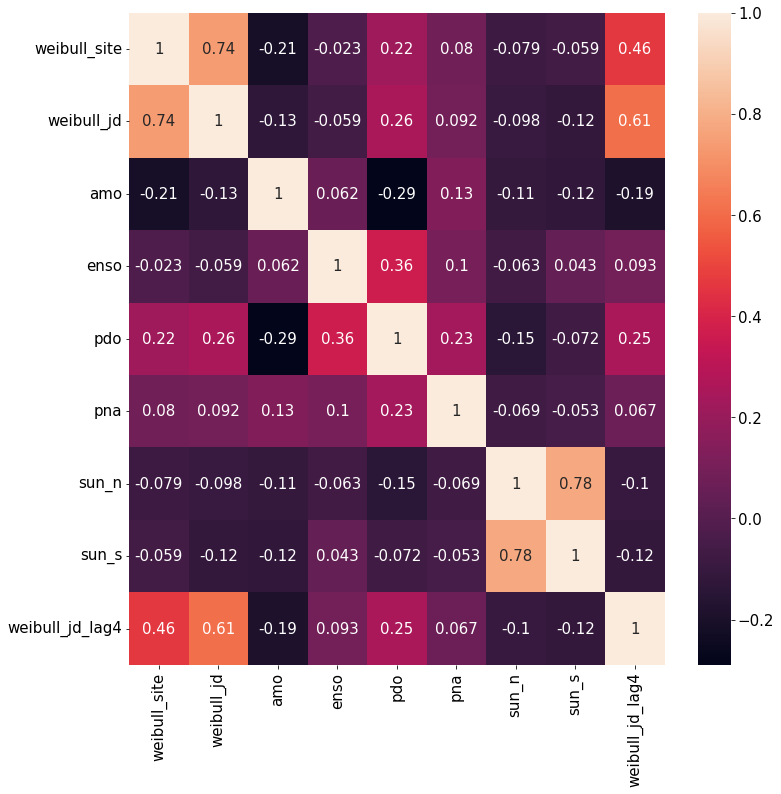

{'amo': SpearmanrResult(correlation=-0.19223567377421538, pvalue=5.340123905278586e-05), 'enso': SpearmanrResult(correlation=0.09298637974698978, pvalue=0.05235001903652215), 'pdo': SpearmanrResult(correlation=0.253878285909895, pvalue=7.691608328751731e-08), 'pna': SpearmanrResult(correlation=0.06745998681041862, pvalue=0.1596753266032398), 'sun_n': SpearmanrResult(correlation=-0.10213737465280434, pvalue=0.032994739634209375), 'sun_s': SpearmanrResult(correlation=-0.1182374809308572, pvalue=0.01349413019446992)}


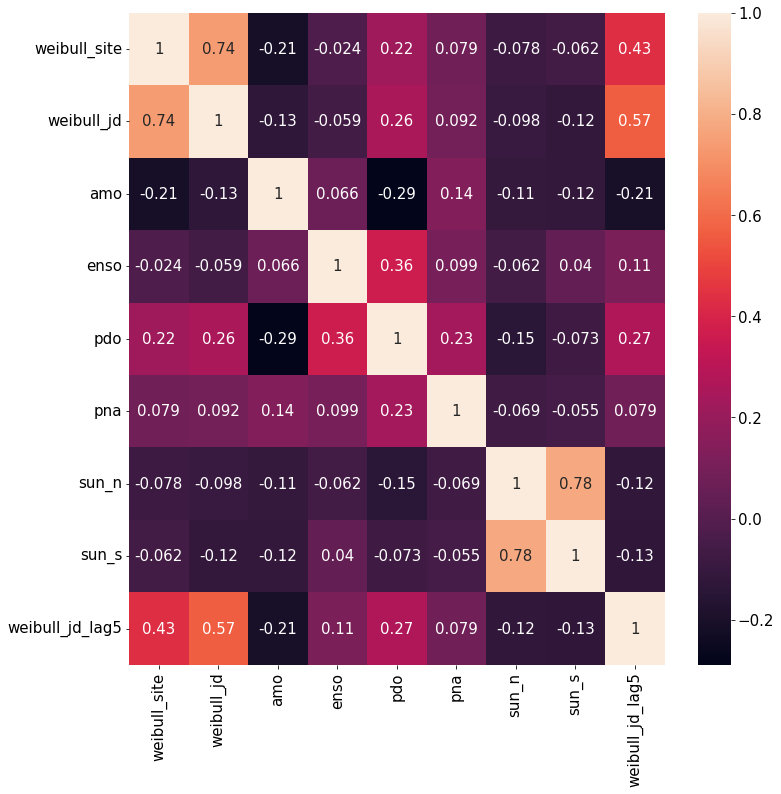

{'amo': SpearmanrResult(correlation=-0.2074470933012807, pvalue=1.2903155148283823e-05), 'enso': SpearmanrResult(correlation=0.11383429053486371, pvalue=0.01754438900158051), 'pdo': SpearmanrResult(correlation=0.26807981899470695, pvalue=1.351316335868424e-08), 'pna': SpearmanrResult(correlation=0.07863793054817075, pvalue=0.10143376588343159), 'sun_n': SpearmanrResult(correlation=-0.11826927812499358, pvalue=0.013576702937464335), 'sun_s': SpearmanrResult(correlation=-0.12796936477368842, pvalue=0.007532688314232145)}


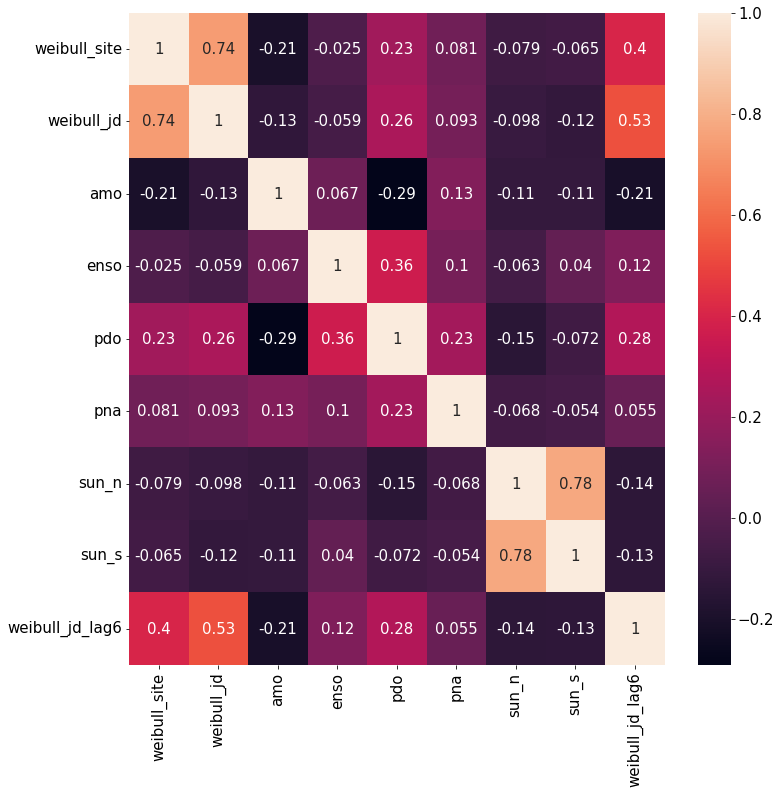

{'amo': SpearmanrResult(correlation=-0.20820727144295337, pvalue=1.2254008489014015e-05), 'enso': SpearmanrResult(correlation=0.12405380013114774, pvalue=0.009683868171256212), 'pdo': SpearmanrResult(correlation=0.27534707329786734, pvalue=5.450608612425768e-09), 'pna': SpearmanrResult(correlation=0.055105283035716185, pvalue=0.25198149511154), 'sun_n': SpearmanrResult(correlation=-0.13880686031649037, pvalue=0.0037625090496284813), 'sun_s': SpearmanrResult(correlation=-0.13255826601866866, pvalue=0.00567845688375173)}


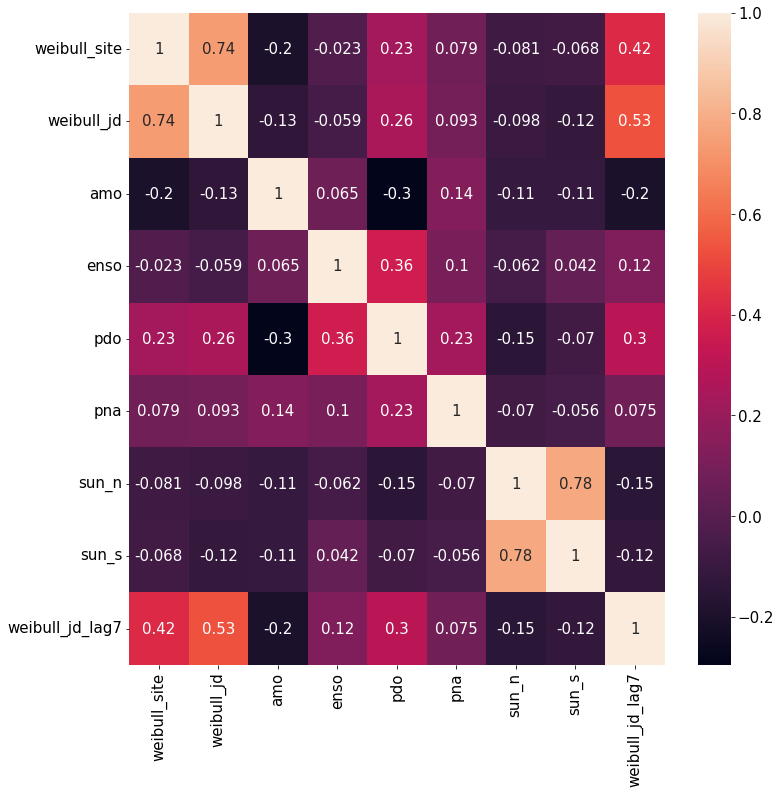

{'amo': SpearmanrResult(correlation=-0.20067801162624024, pvalue=2.591992707065613e-05), 'enso': SpearmanrResult(correlation=0.12357580729946657, pvalue=0.01005636265600735), 'pdo': SpearmanrResult(correlation=0.2996090975712188, pvalue=1.975972171908885e-10), 'pna': SpearmanrResult(correlation=0.07463661556668168, pvalue=0.12095884960878436), 'sun_n': SpearmanrResult(correlation=-0.1524869337655098, pvalue=0.001460064607210991), 'sun_s': SpearmanrResult(correlation=-0.12083750019677968, pvalue=0.011855239217790832)}


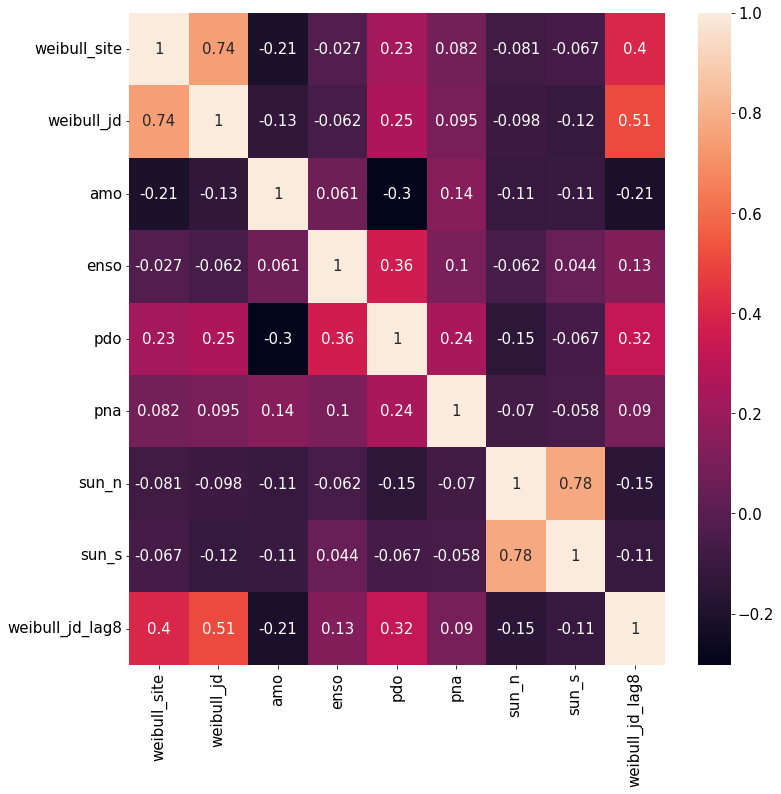

{'amo': SpearmanrResult(correlation=-0.21222725311240007, pvalue=8.62464010792675e-06), 'enso': SpearmanrResult(correlation=0.12812825578802953, pvalue=0.007667339095292937), 'pdo': SpearmanrResult(correlation=0.32489797352136546, pvalue=4.453643319097749e-12), 'pna': SpearmanrResult(correlation=0.08958460124813745, pvalue=0.06283912362867378), 'sun_n': SpearmanrResult(correlation=-0.15182909143691545, pvalue=0.001551189770592457), 'sun_s': SpearmanrResult(correlation=-0.11035695277462515, pvalue=0.021785245390378245)}


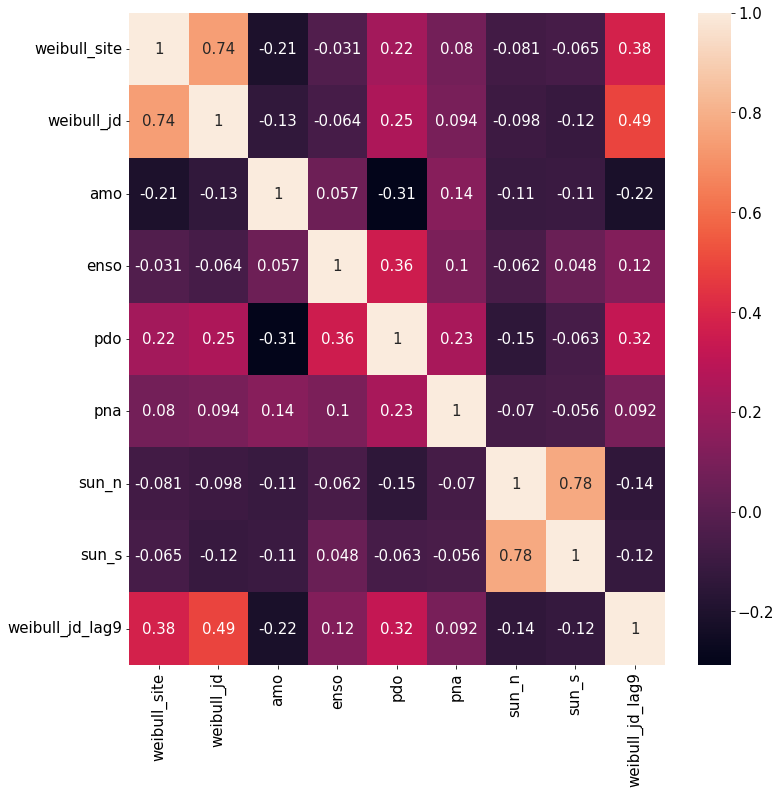

{'amo': SpearmanrResult(correlation=-0.2204391219084511, pvalue=3.835567202676358e-06), 'enso': SpearmanrResult(correlation=0.12168787474320801, pvalue=0.011459291888768116), 'pdo': SpearmanrResult(correlation=0.32093223227725903, pvalue=8.808682665142541e-12), 'pna': SpearmanrResult(correlation=0.09209241497404785, pvalue=0.056082082875599584), 'sun_n': SpearmanrResult(correlation=-0.14282813476483333, pvalue=0.0029603221804230862), 'sun_s': SpearmanrResult(correlation=-0.12017641234324349, pvalue=0.012534211405908054)}


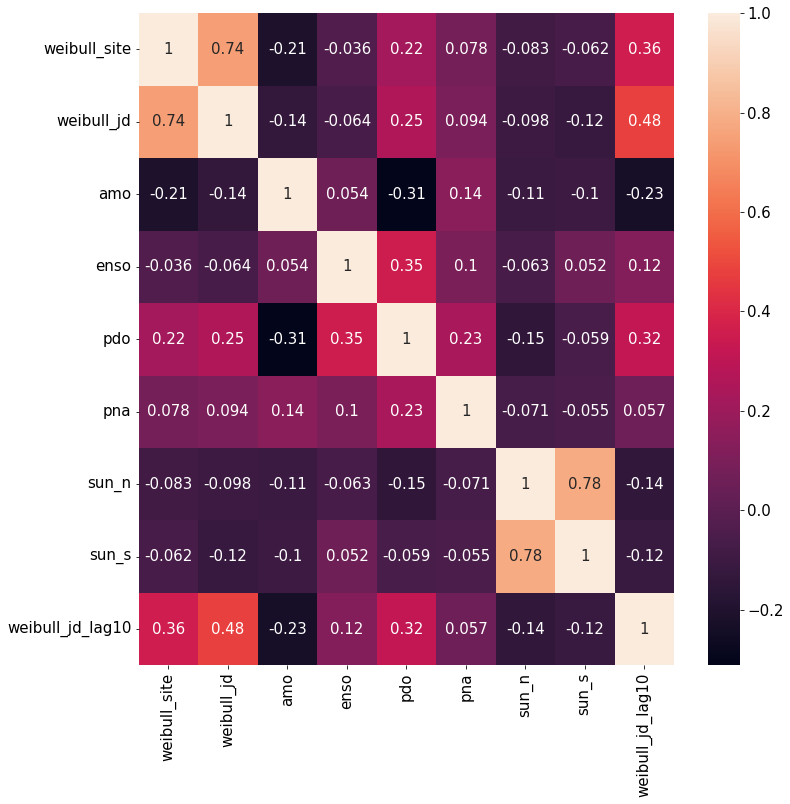

{'amo': SpearmanrResult(correlation=-0.23148650555946873, pvalue=1.220400564423157e-06), 'enso': SpearmanrResult(correlation=0.12434339939687127, pvalue=0.00985266696730504), 'pdo': SpearmanrResult(correlation=0.3150297038288173, pvalue=2.3165748086180404e-11), 'pna': SpearmanrResult(correlation=0.057044750695830176, pvalue=0.2378319210737628), 'sun_n': SpearmanrResult(correlation=-0.1426469899727753, pvalue=0.003031211875422355), 'sun_s': SpearmanrResult(correlation=-0.11539598021216782, pvalue=0.016668528094733313)}


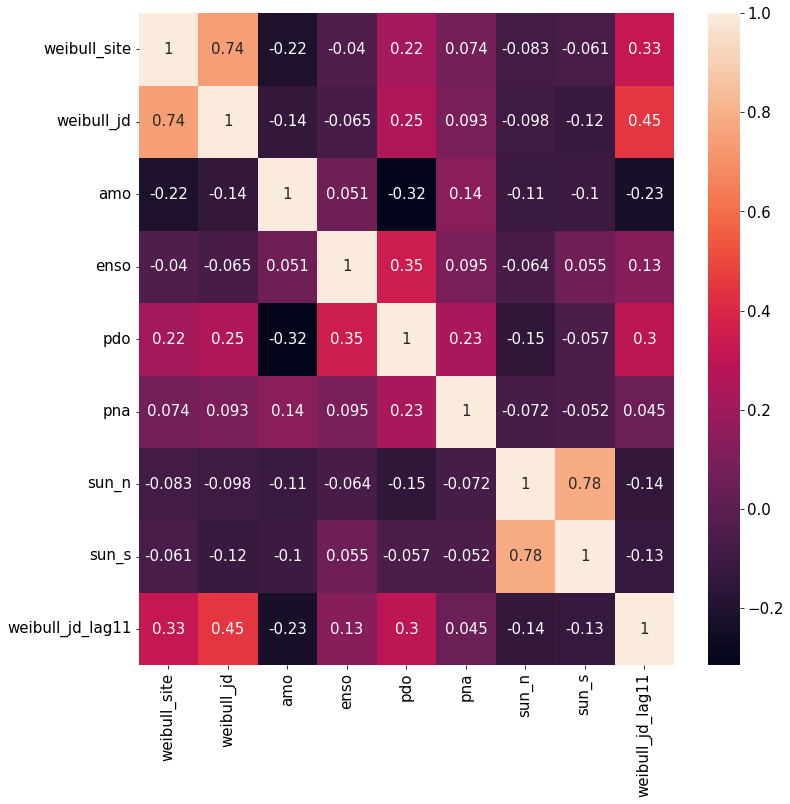

{'amo': SpearmanrResult(correlation=-0.23194446291800552, pvalue=1.1949328260140996e-06), 'enso': SpearmanrResult(correlation=0.1343036506281065, pvalue=0.005332060897322709), 'pdo': SpearmanrResult(correlation=0.2981489736040126, pvalue=2.953245707272588e-10), 'pna': SpearmanrResult(correlation=0.04508488619018639, pvalue=0.35156314847116055), 'sun_n': SpearmanrResult(correlation=-0.1405095039616639, pvalue=0.0035424787031911823), 'sun_s': SpearmanrResult(correlation=-0.12734939541581855, pvalue=0.0082719081818294)}


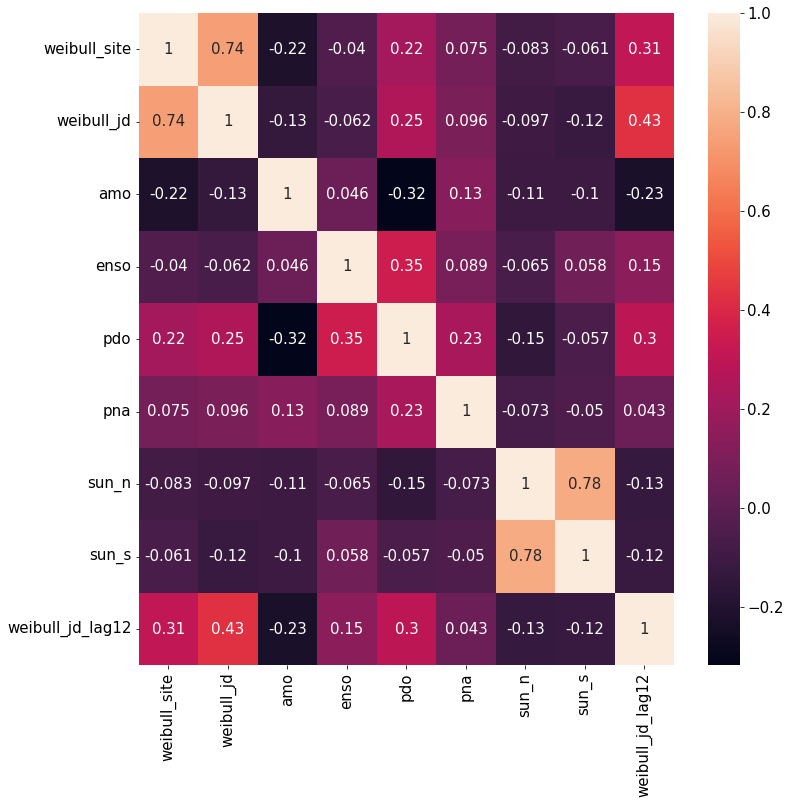

{'amo': SpearmanrResult(correlation=-0.22586067970569315, pvalue=2.3572102786601206e-06), 'enso': SpearmanrResult(correlation=0.1454816354683435, pvalue=0.002552797015554584), 'pdo': SpearmanrResult(correlation=0.2958528023414099, pvalue=4.291171612882351e-10), 'pna': SpearmanrResult(correlation=0.042976199662901254, pvalue=0.3751283321872474), 'sun_n': SpearmanrResult(correlation=-0.1300365646618849, pvalue=0.007064329122683256), 'sun_s': SpearmanrResult(correlation=-0.11911442931778353, pvalue=0.01366937391636139)}


In [52]:
periods = np.arange(-1, -13, -1)
for period in periods:
    df_15["weibull_jd_lag" + str(period)[1:]] = df_15["weibull_jd"].shift(periods=period)
    df_15_cross_corr = df_15[df_15["weibull_jd_lag" + str(period)[1:]].notnull()]

    corr_matrix = df_15_cross_corr.corr(method='spearman')

    f, ax = plt.subplots(figsize=(12,12))
    ax = sns.heatmap(corr_matrix, annot=True)
    ax = plt.rcParams.update({'font.size': 15})
    plt.show()

    weibull_jd_spearman = {}
    for var in df_15_cross_corr.columns.values[2:-1]:
        weibull_jd_spearman[var] = spearmanr(
            df_15_cross_corr["weibull_jd_lag" + str(period)[1:]], 
            df_15_cross_corr[var]
        )
    print(weibull_jd_spearman)

    df_15 = df_15.drop(["weibull_jd_lag" + str(period)[1:]], axis=1)

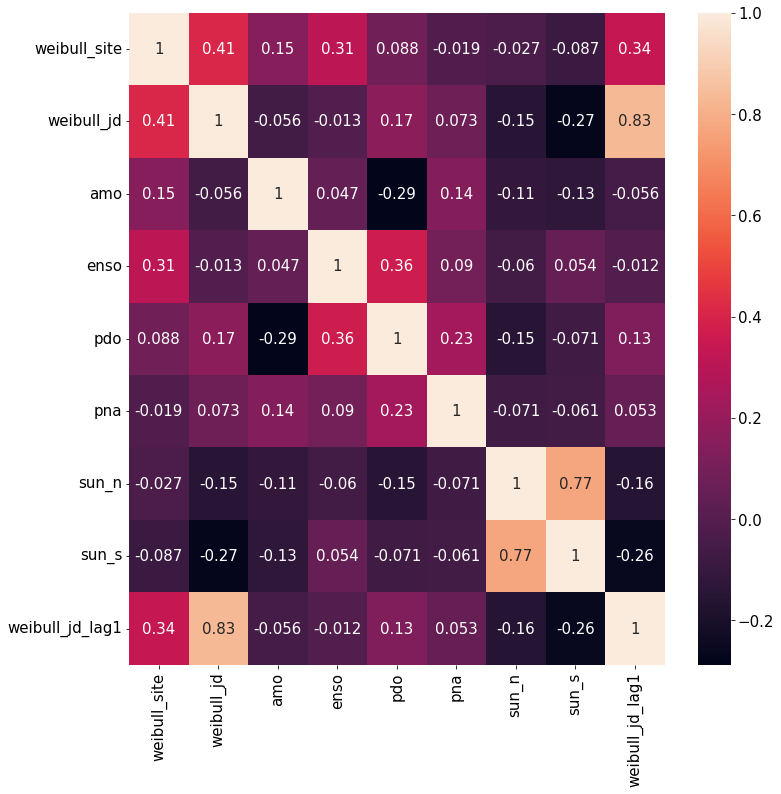

{'amo': SpearmanrResult(correlation=-0.05557752861644985, pvalue=0.24521238654972702), 'enso': SpearmanrResult(correlation=-0.01249114570988074, pvalue=0.7941059568670933), 'pdo': SpearmanrResult(correlation=0.12870833705658402, pvalue=0.006927901139303614), 'pna': SpearmanrResult(correlation=0.05312119040779374, pvalue=0.2667304369012836), 'sun_n': SpearmanrResult(correlation=-0.15821978348576213, pvalue=0.0008791305919955437), 'sun_s': SpearmanrResult(correlation=-0.25797125695235645, pvalue=4.1874070459854866e-08)}


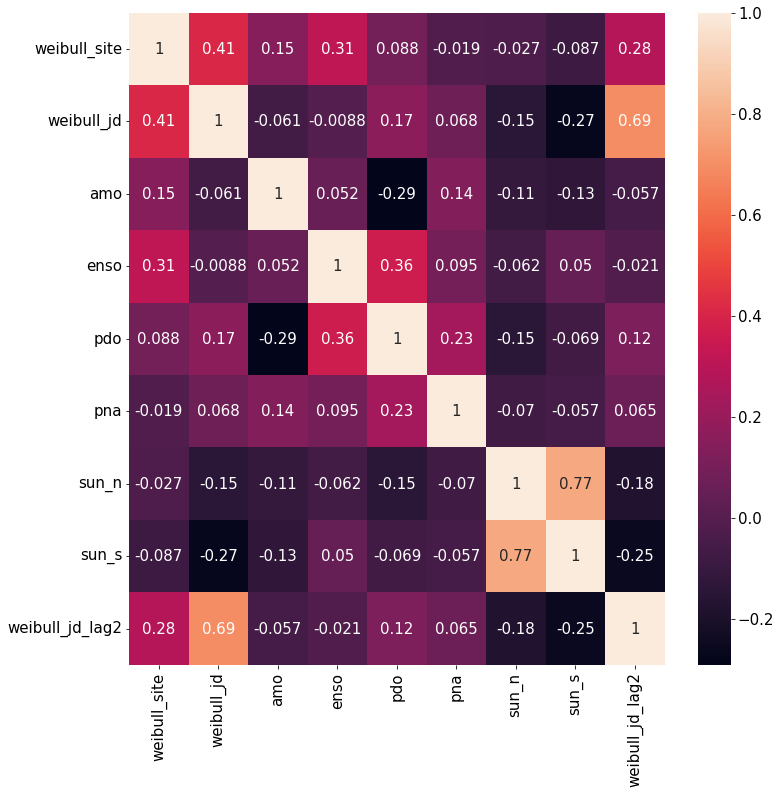

{'amo': SpearmanrResult(correlation=-0.057343807426582266, pvalue=0.2310442677614938), 'enso': SpearmanrResult(correlation=-0.021302855032253216, pvalue=0.6566000663246345), 'pdo': SpearmanrResult(correlation=0.11787073872371263, pvalue=0.01357137050472254), 'pna': SpearmanrResult(correlation=0.06485579413868733, pvalue=0.17545603857316458), 'sun_n': SpearmanrResult(correlation=-0.17844142812586308, pvalue=0.00017403360285486494), 'sun_s': SpearmanrResult(correlation=-0.2509961247514515, pvalue=1.0184425589916246e-07)}


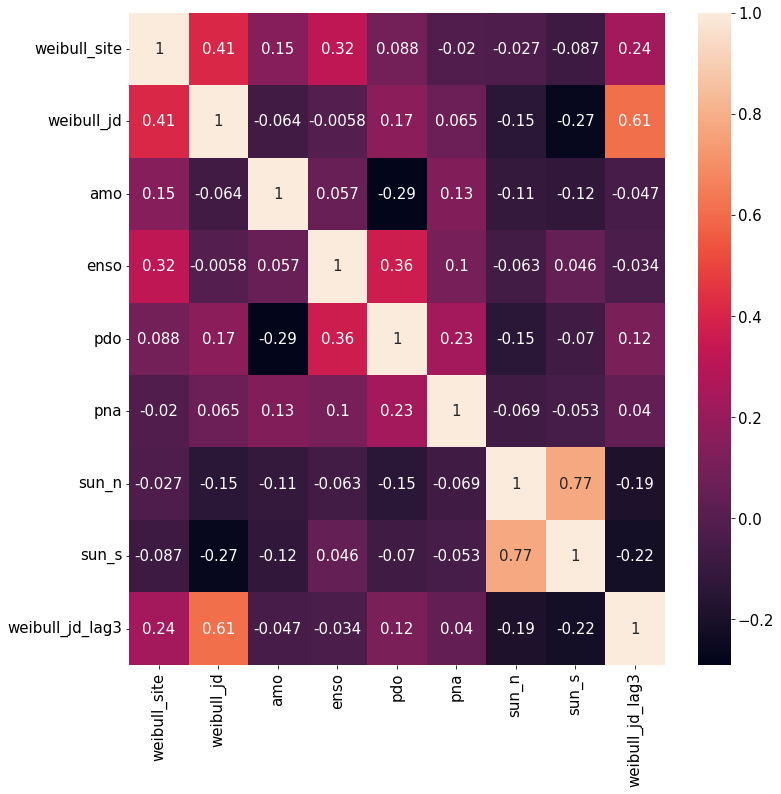

{'amo': SpearmanrResult(correlation=-0.04688532173601965, pvalue=0.3281500438902756), 'enso': SpearmanrResult(correlation=-0.03379113191828473, pvalue=0.48108021327861805), 'pdo': SpearmanrResult(correlation=0.11663322025399346, pvalue=0.014707107755796693), 'pna': SpearmanrResult(correlation=0.040208859942151204, pvalue=0.4017614201355595), 'sun_n': SpearmanrResult(correlation=-0.19272351013876585, pvalue=5.006190037357681e-05), 'sun_s': SpearmanrResult(correlation=-0.22221067878628523, pvalue=2.7229861948923493e-06)}


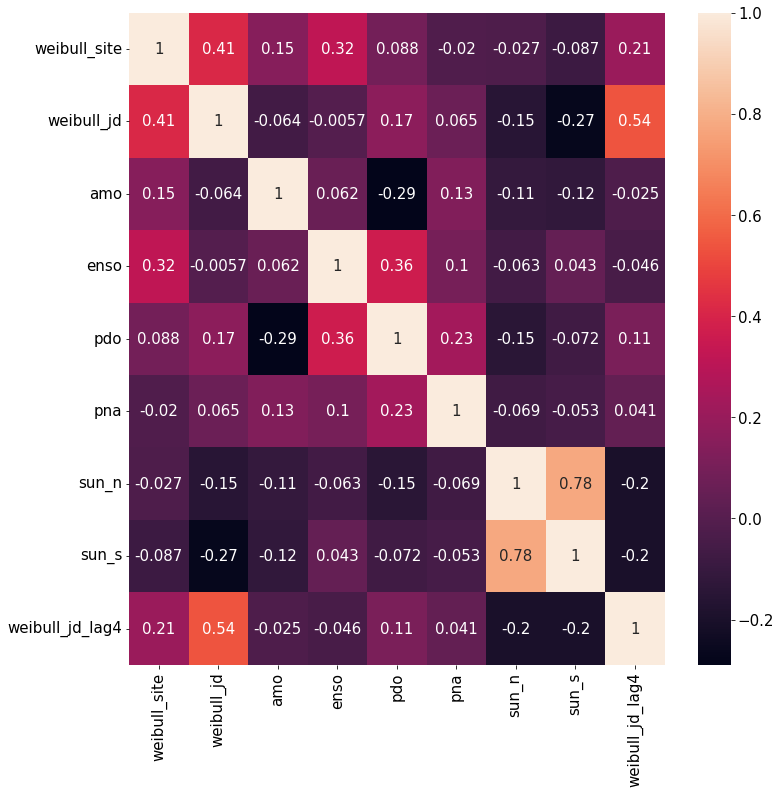

{'amo': SpearmanrResult(correlation=-0.02481480060463745, pvalue=0.6053374273453334), 'enso': SpearmanrResult(correlation=-0.04566518908263859, pvalue=0.3414642137767353), 'pdo': SpearmanrResult(correlation=0.10942531065513597, pvalue=0.022302613689565546), 'pna': SpearmanrResult(correlation=0.04135206091887928, pvalue=0.3890474625513036), 'sun_n': SpearmanrResult(correlation=-0.20116851225001348, pvalue=2.318264173748917e-05), 'sun_s': SpearmanrResult(correlation=-0.2033888096490908, pvalue=1.8731065492744163e-05)}


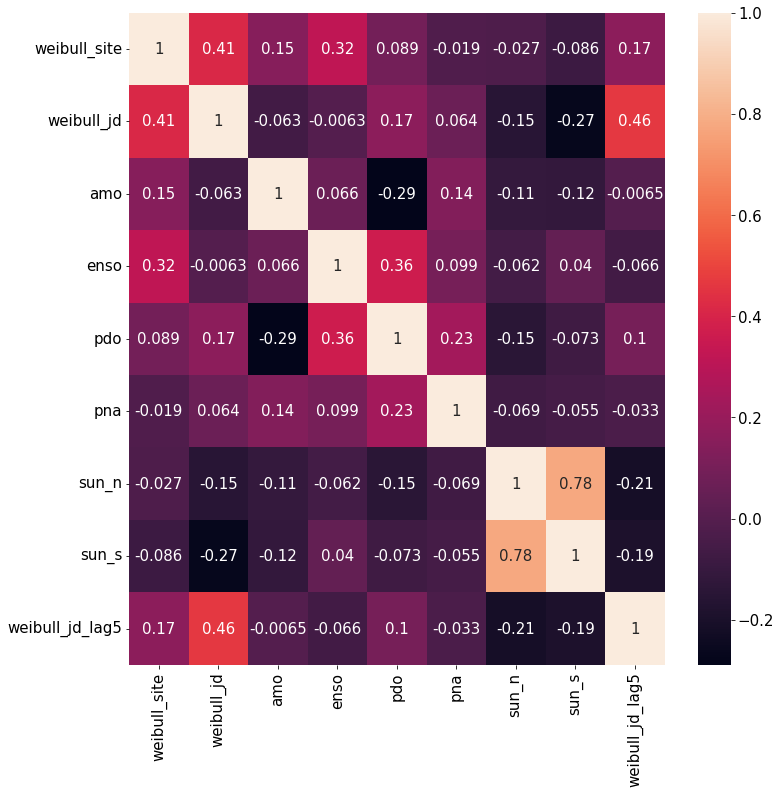

{'amo': SpearmanrResult(correlation=-0.006464370426928682, pvalue=0.8930557620840873), 'enso': SpearmanrResult(correlation=-0.06567707369635994, pvalue=0.17151901529185307), 'pdo': SpearmanrResult(correlation=0.10146974353294161, pvalue=0.034370908698505856), 'pna': SpearmanrResult(correlation=-0.03308084808302038, pvalue=0.49135272391958407), 'sun_n': SpearmanrResult(correlation=-0.2141194690848577, pvalue=6.627208504208651e-06), 'sun_s': SpearmanrResult(correlation=-0.19324736687400834, pvalue=4.9663874186332056e-05)}


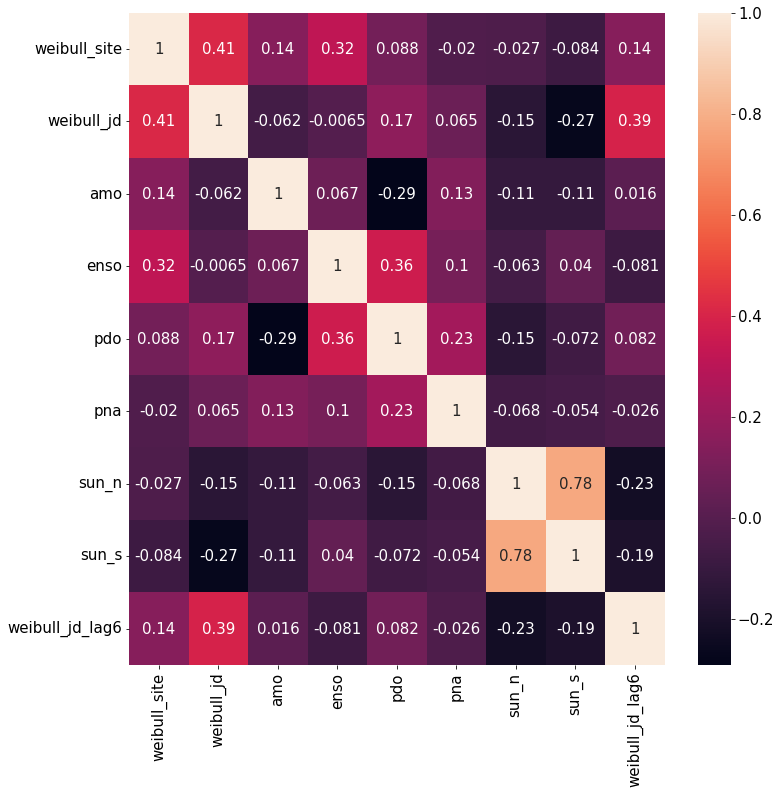

{'amo': SpearmanrResult(correlation=0.01586713059890481, pvalue=0.7416855426012237), 'enso': SpearmanrResult(correlation=-0.08050083767081324, pvalue=0.09394802239648381), 'pdo': SpearmanrResult(correlation=0.08226271760253762, pvalue=0.08694985772858493), 'pna': SpearmanrResult(correlation=-0.026017526804798727, pvalue=0.5888227535502444), 'sun_n': SpearmanrResult(correlation=-0.2291051949710673, pvalue=1.4112376227337675e-06), 'sun_s': SpearmanrResult(correlation=-0.19247210550393873, pvalue=5.438389921629255e-05)}


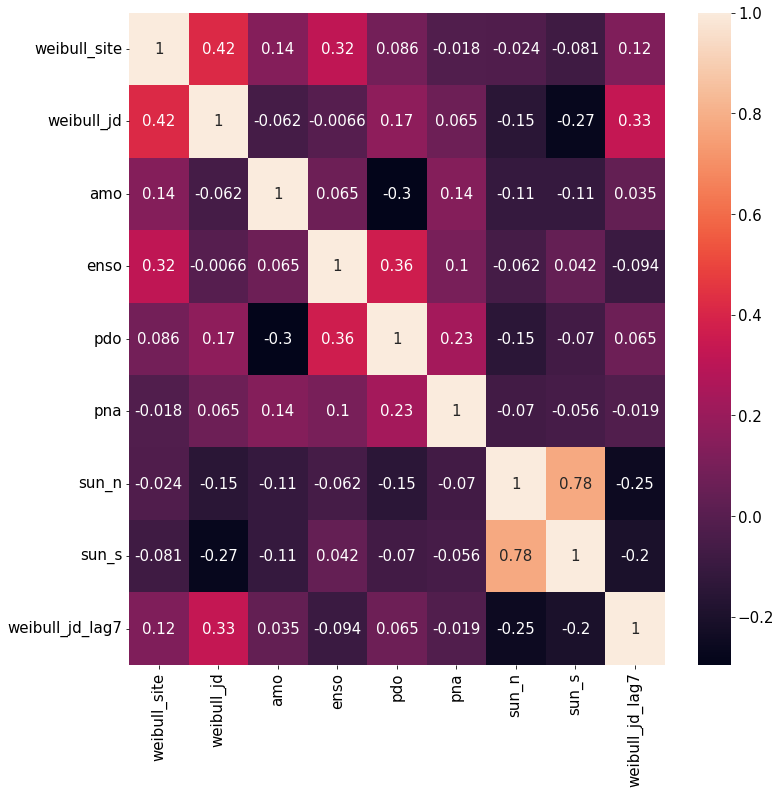

{'amo': SpearmanrResult(correlation=0.03508195251673063, pvalue=0.4665388583032811), 'enso': SpearmanrResult(correlation=-0.09431594747344614, pvalue=0.04984538982837124), 'pdo': SpearmanrResult(correlation=0.06470191784937589, pvalue=0.17898839887605272), 'pna': SpearmanrResult(correlation=-0.019170927321827354, pvalue=0.6907742521139488), 'sun_n': SpearmanrResult(correlation=-0.25086512084742285, pvalue=1.2238276813552995e-07), 'sun_s': SpearmanrResult(correlation=-0.2009443350998825, pvalue=2.5274316704274275e-05)}


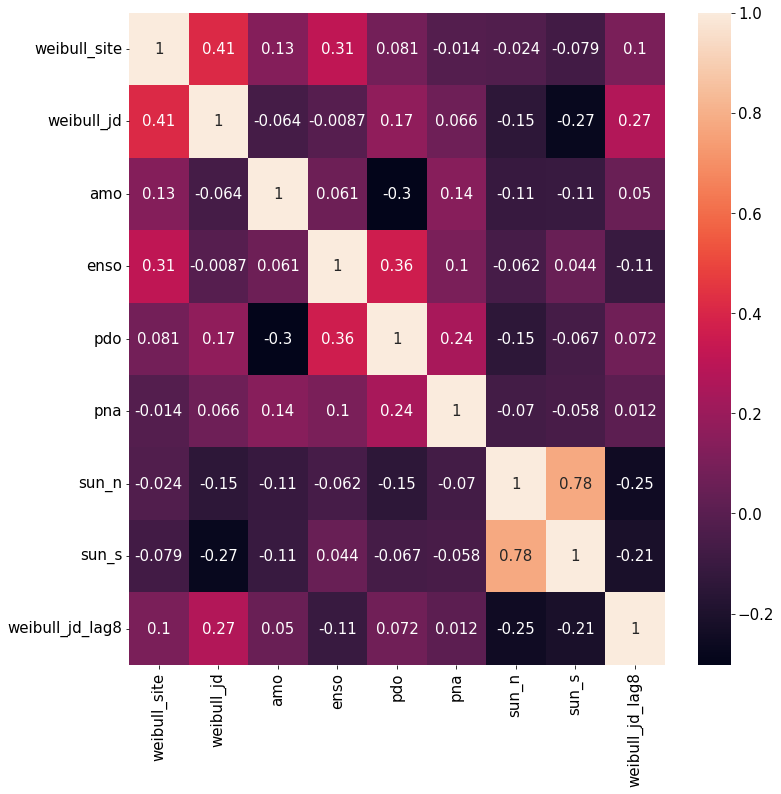

{'amo': SpearmanrResult(correlation=0.04963508174809749, pvalue=0.30334282791202305), 'enso': SpearmanrResult(correlation=-0.1091286531170266, pvalue=0.023304642977995945), 'pdo': SpearmanrResult(correlation=0.07238593966616637, pvalue=0.1330647170005746), 'pna': SpearmanrResult(correlation=0.012048778742558544, pvalue=0.8028095823380043), 'sun_n': SpearmanrResult(correlation=-0.2494503285751903, pvalue=1.496630507119324e-07), 'sun_s': SpearmanrResult(correlation=-0.21437683371812366, pvalue=6.9505972251724055e-06)}


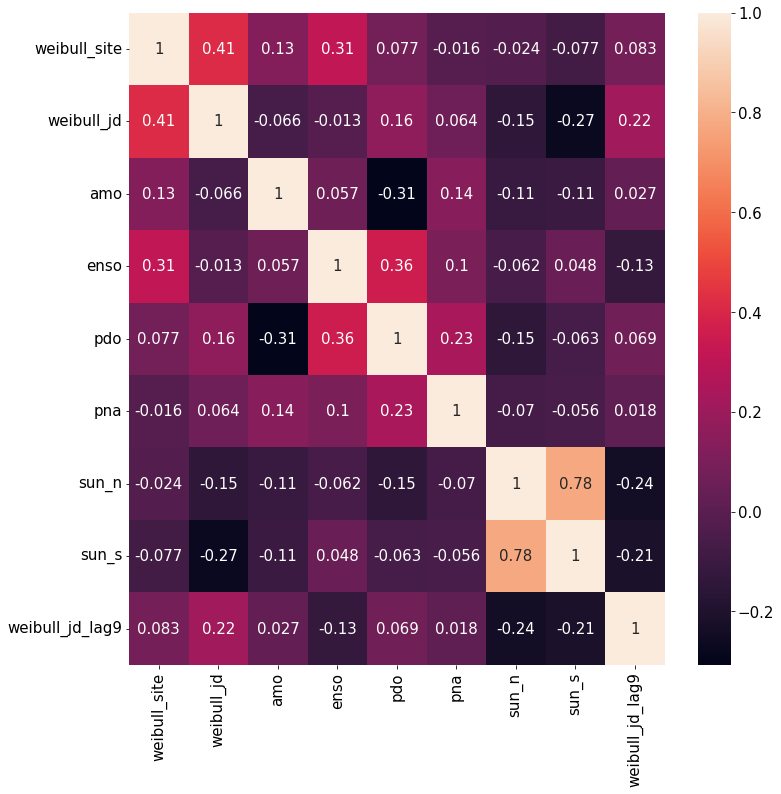

{'amo': SpearmanrResult(correlation=0.026660822702143663, pvalue=0.5809594631288262), 'enso': SpearmanrResult(correlation=-0.12664874571186235, pvalue=0.008481699773616931), 'pdo': SpearmanrResult(correlation=0.06915879655929791, pvalue=0.1517661566116111), 'pna': SpearmanrResult(correlation=0.01817465777694002, pvalue=0.7067302934611446), 'sun_n': SpearmanrResult(correlation=-0.2422102725828361, pvalue=3.58449078389428e-07), 'sun_s': SpearmanrResult(correlation=-0.21368520811590871, pvalue=7.636497092892618e-06)}


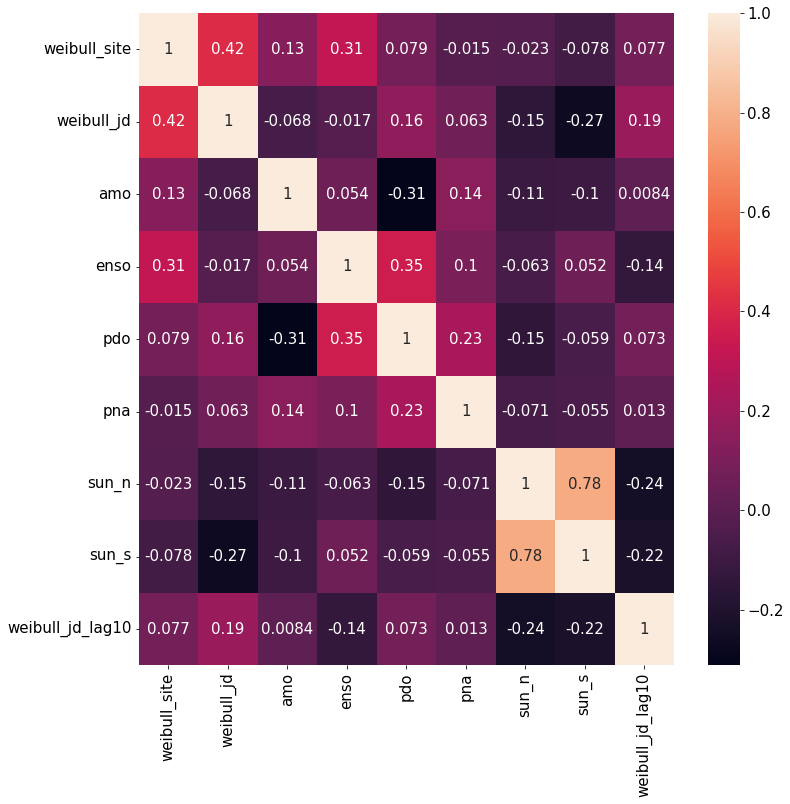

{'amo': SpearmanrResult(correlation=0.008426486256955076, pvalue=0.8616848673562587), 'enso': SpearmanrResult(correlation=-0.13776637195982636, pvalue=0.004208073779808434), 'pdo': SpearmanrResult(correlation=0.07339793186591859, pvalue=0.12860353796957033), 'pna': SpearmanrResult(correlation=0.013415485630035712, pvalue=0.7814790156688658), 'sun_n': SpearmanrResult(correlation=-0.241863421848489, pvalue=3.8475610068279024e-07), 'sun_s': SpearmanrResult(correlation=-0.21673142366230164, pvalue=5.7556425110598515e-06)}


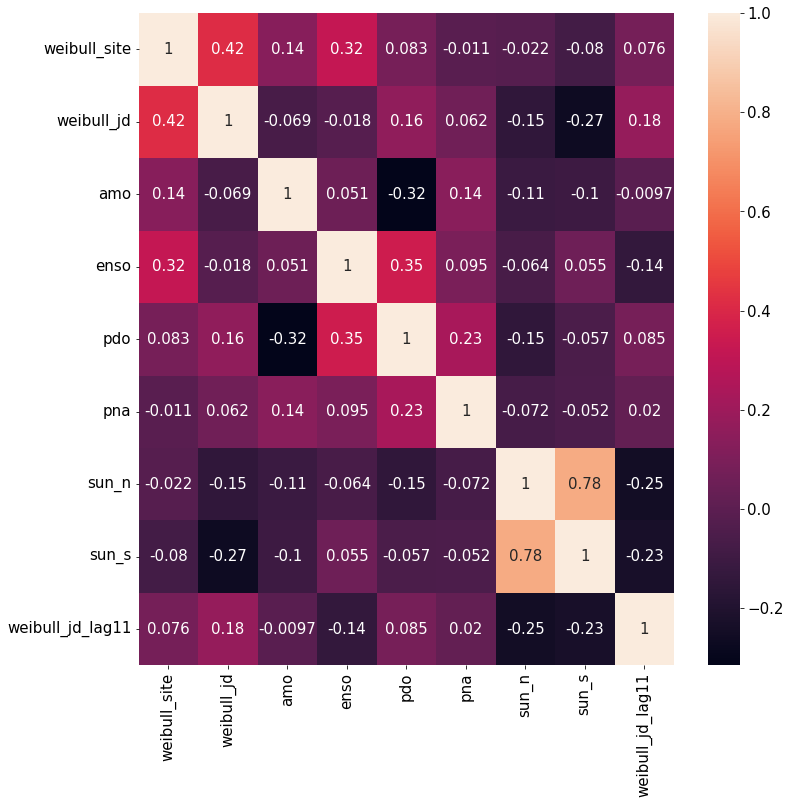

{'amo': SpearmanrResult(correlation=-0.009712944144153902, pvalue=0.8410150152133228), 'enso': SpearmanrResult(correlation=-0.13688812208814768, pvalue=0.004505987340977961), 'pdo': SpearmanrResult(correlation=0.08520112715104121, pvalue=0.07793924361936169), 'pna': SpearmanrResult(correlation=0.019589307700891376, pvalue=0.6857752875285275), 'sun_n': SpearmanrResult(correlation=-0.2505610940919707, pvalue=1.450968211167531e-07), 'sun_s': SpearmanrResult(correlation=-0.2286106384885219, pvalue=1.7120082403725582e-06)}


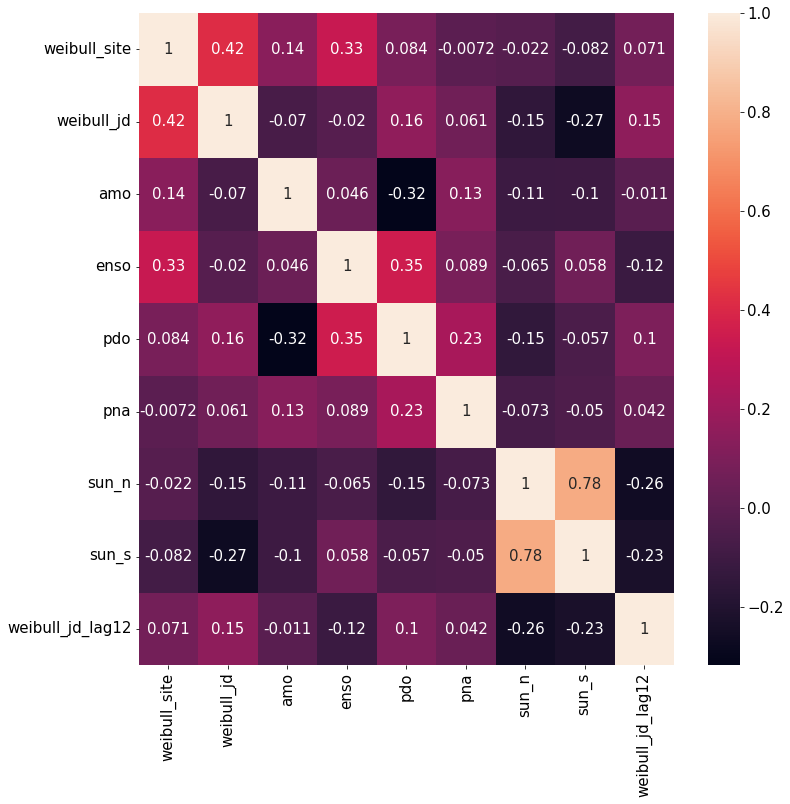

{'amo': SpearmanrResult(correlation=-0.011488428327613475, pvalue=0.8126667224479883), 'enso': SpearmanrResult(correlation=-0.11569628110365425, pvalue=0.01663897157831683), 'pdo': SpearmanrResult(correlation=0.10256638958774053, pvalue=0.03389642002392202), 'pna': SpearmanrResult(correlation=0.04175592065076269, pvalue=0.3888511164210816), 'sun_n': SpearmanrResult(correlation=-0.2574176001659998, pvalue=6.619293373165196e-08), 'sun_s': SpearmanrResult(correlation=-0.22846797632854476, pvalue=1.7875153202093536e-06)}


In [53]:
periods = np.arange(-1, -13, -1)
for period in periods:
    df_17["weibull_jd_lag" + str(period)[1:]] = df_17["weibull_jd"].shift(periods=period)
    df_17_cross_corr = df_17[df_17["weibull_jd_lag" + str(period)[1:]].notnull()]

    corr_matrix = df_17_cross_corr.corr(method='spearman')

    f, ax = plt.subplots(figsize=(12,12))
    ax = sns.heatmap(corr_matrix, annot=True)
    ax = plt.rcParams.update({'font.size': 15})
    plt.show()

    weibull_jd_spearman = {}
    for var in df_17_cross_corr.columns.values[2:-1]:
        weibull_jd_spearman[var] = spearmanr(
            df_17_cross_corr["weibull_jd_lag" + str(period)[1:]], 
            df_17_cross_corr[var]
        )
    print(weibull_jd_spearman)

    df_17 = df_17.drop(["weibull_jd_lag" + str(period)[1:]], axis=1)

## Transformations

First, try SciPy.

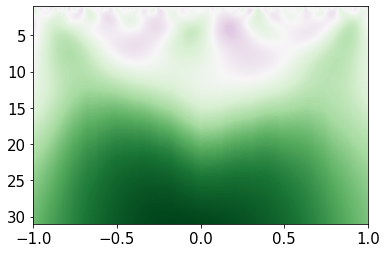

In [118]:
widths = np.arange(1, 220)
cwtmatr = signal.cwt(df_10U["weibull_jd"], signal.ricker, widths)
plt.imshow(cwtmatr, extent=[-1, 1, 31, 1], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())
plt.show()

This visualization is super strange. Try PyWavelets next.

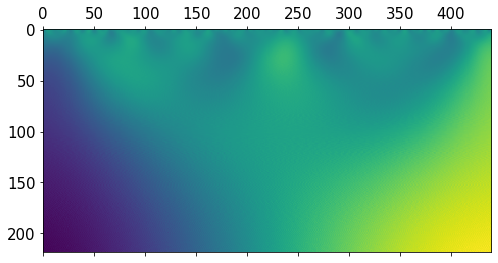

In [119]:
coef, freqs = pywt.cwt(df_10U["weibull_jd"], np.arange(1, 220),'gaus1')
plt.matshow(coef)
plt.show()

This visualization is also odd, trying Scaleogram next.

In [126]:
scg.set_default_wavelet('cmor1-1.5')  # Morlet wavelet

In [127]:
scales = scg.periods2scales(np.logspace(np.log10(2), np.log10(220), 200))  # 220 months, half the dataset

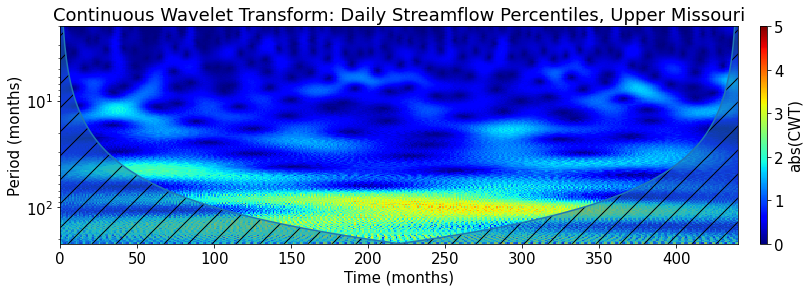

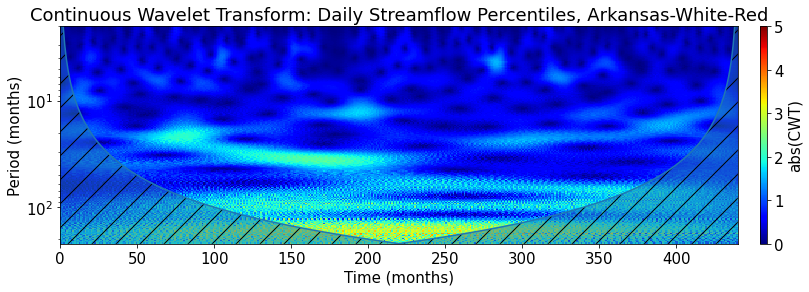

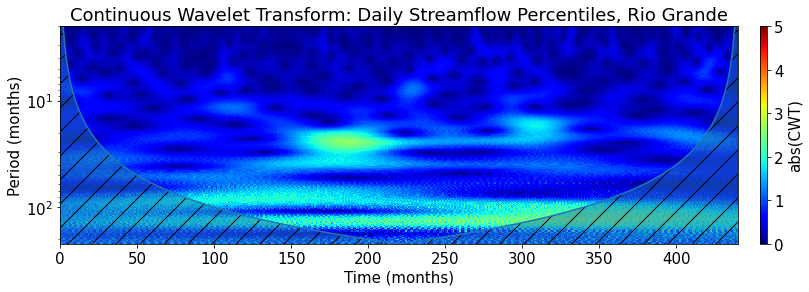

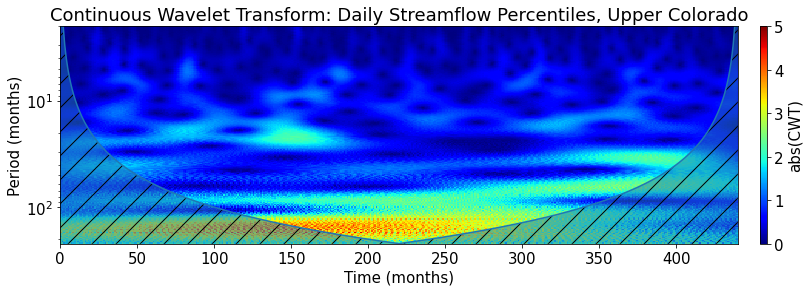

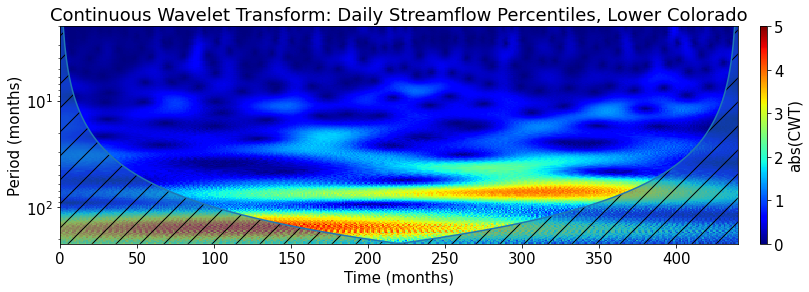

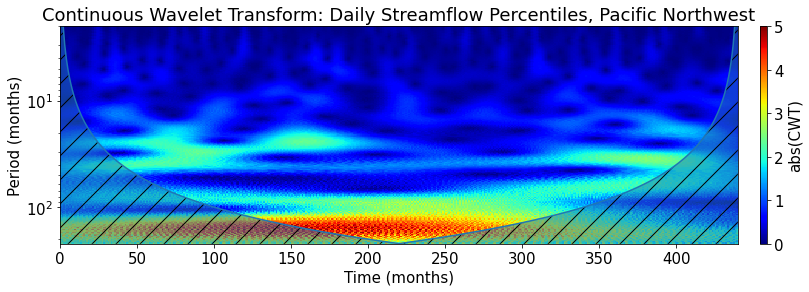

In [135]:
title = "Continuous Wavelet Transform: Daily Streamflow Percentiles"
variable = 'weibull_jd'

df_10U_var = df_10U[variable].to_numpy()
df_10U_var_norm = (df_10U_var - df_10U_var.mean()) / df_10U_var.std()
cwt_10U = scg.CWT(df_10U_var_norm, scales=scales) 
ax = scg.cws(
    cwt_10U, 
    figsize=(13.2, 4), 
    clim=(0, 5),
    title=title + ", Upper Missouri", 
    xlabel="Time (months)",
    ylabel="Period (months)",
    yscale='log'
)

df_11_var = df_11[variable].to_numpy()
df_11_var_norm = (df_11_var - df_11_var.mean()) / df_11_var.std()
cwt_11 = scg.CWT(df_11_var_norm, scales=scales) 
ax = scg.cws(
    cwt_11, 
    figsize=(13.2, 4), 
    clim=(0, 5),
    title=title + ", Arkansas-White-Red", 
    xlabel="Time (months)",
    ylabel="Period (months)",
    yscale='log'
)

df_13_var = df_13[variable].to_numpy()
df_13_var_norm = (df_13_var - df_13_var.mean()) / df_13_var.std()
cwt_13 = scg.CWT(df_13_var_norm, scales=scales) 
ax = scg.cws(
    cwt_13, 
    figsize=(13.2, 4), 
    clim=(0, 5),
    title=title + ", Rio Grande", 
    xlabel="Time (months)",
    ylabel="Period (months)",
    yscale='log'
)

df_14_var = df_14[variable].to_numpy()
df_14_var_norm = (df_14_var - df_14_var.mean()) / df_14_var.std()
cwt_14 = scg.CWT(df_14_var_norm, scales=scales) 
ax = scg.cws(
    cwt_14, 
    figsize=(13.2, 4), 
    clim=(0, 5),
    title=title + ", Upper Colorado", 
    xlabel="Time (months)",
    ylabel="Period (months)",
    yscale='log'
)

df_15_var = df_15[variable].to_numpy()
df_15_var_norm = (df_15_var - df_15_var.mean()) / df_15_var.std()
cwt_15 = scg.CWT(df_15_var_norm, scales=scales) 
ax = scg.cws(
    cwt_15, 
    figsize=(13.2, 4), 
    clim=(0, 5),
    title=title + ", Lower Colorado", 
    xlabel="Time (months)",
    ylabel="Period (months)",
    yscale='log'
)

df_17_var = df_17[variable].to_numpy()
df_17_var_norm = (df_17_var - df_17_var.mean()) / df_17_var.std()
cwt_17 = scg.CWT(df_17_var_norm, scales=scales) 
ax = scg.cws(
    cwt_17, 
    figsize=(13.2, 4), 
    clim=(0, 5),
    title=title + ", Pacific Northwest", 
    xlabel="Time (months)",
    ylabel="Period (months)",
    yscale='log'
)
plt.show()

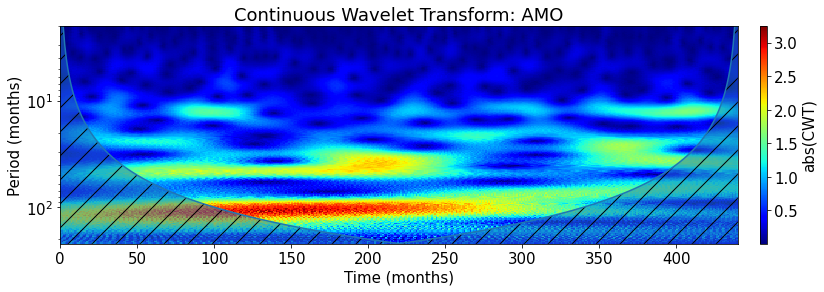

In [129]:
title = "Continuous Wavelet Transform: AMO"
variable = 'amo'

# Region doesn't matter, the data is the same
df_10U_var = df_10U[variable].to_numpy()
df_10U_var_norm = (df_10U_var - df_10U_var.mean()) / df_10U_var.std()
cwt_10U = scg.CWT(df_10U_var_norm, scales=scales) 
ax = scg.cws(
    cwt_10U, 
    figsize=(13.2, 4), 
    title=title, 
    xlabel="Time (months)",
    ylabel="Period (months)",
    yscale='log'
)
plt.show()

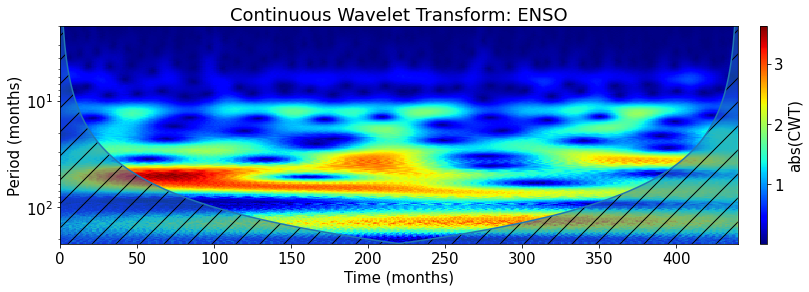

In [130]:
title = "Continuous Wavelet Transform: ENSO"
variable = 'enso'

# Region doesn't matter, the data is the same
df_10U_var = df_10U[variable].to_numpy()
df_10U_var_norm = (df_10U_var - df_10U_var.mean()) / df_10U_var.std()
cwt_10U = scg.CWT(df_10U_var_norm, scales=scales) 
ax = scg.cws(
    cwt_10U, 
    figsize=(13.2, 4), 
    title=title, 
    xlabel="Time (months)",
    ylabel="Period (months)",
    yscale='log'
)
plt.show()

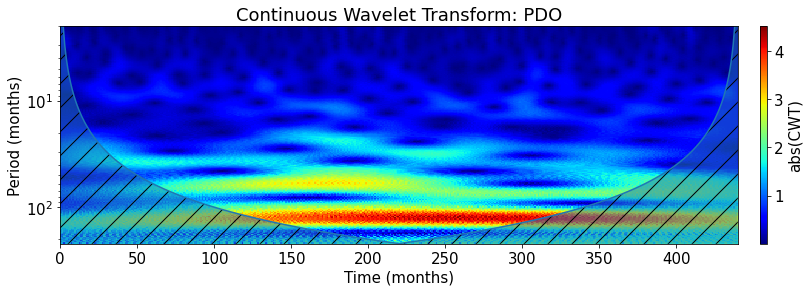

In [131]:
title = "Continuous Wavelet Transform: PDO"
variable = 'pdo'

# Region doesn't matter, the data is the same
df_10U_var = df_10U[variable].to_numpy()
df_10U_var_norm = (df_10U_var - df_10U_var.mean()) / df_10U_var.std()
cwt_10U = scg.CWT(df_10U_var_norm, scales=scales) 
ax = scg.cws(
    cwt_10U, 
    figsize=(13.2, 4), 
    title=title, 
    xlabel="Time (months)",
    ylabel="Period (months)",
    yscale='log'
)
plt.show()

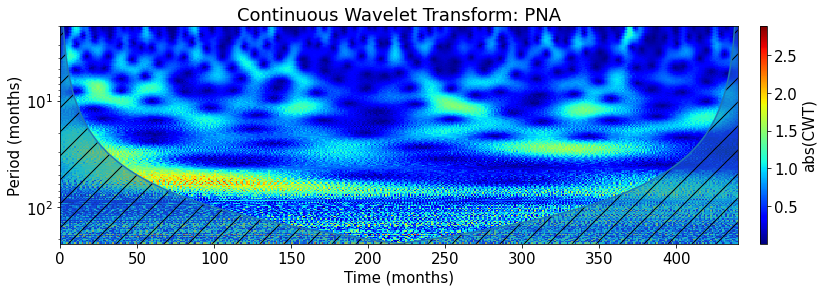

In [132]:
title = "Continuous Wavelet Transform: PNA"
variable = 'pna'

# Region doesn't matter, the data is the same
df_10U_var = df_10U[variable].to_numpy()
df_10U_var_norm = (df_10U_var - df_10U_var.mean()) / df_10U_var.std()
cwt_10U = scg.CWT(df_10U_var_norm, scales=scales) 
ax = scg.cws(
    cwt_10U, 
    figsize=(13.2, 4), 
    title=title, 
    xlabel="Time (months)",
    ylabel="Period (months)",
    yscale='log'
)
plt.show()

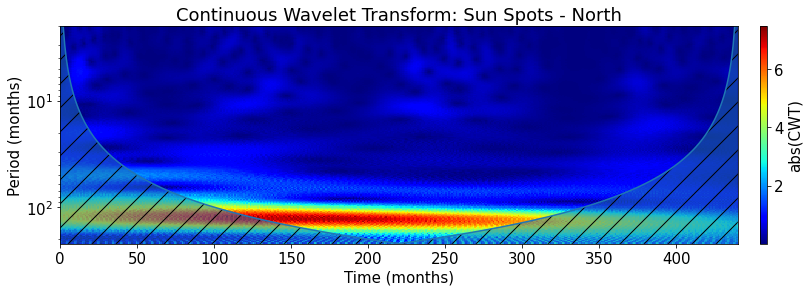

In [133]:
title = "Continuous Wavelet Transform: Sun Spots - North"
variable = 'sun_n'

# Region doesn't matter, the data is the same
df_10U_var = df_10U[variable].to_numpy()
df_10U_var_norm = (df_10U_var - df_10U_var.mean()) / df_10U_var.std()
cwt_10U = scg.CWT(df_10U_var_norm, scales=scales) 
ax = scg.cws(
    cwt_10U, 
    figsize=(13.2, 4), 
    title=title, 
    xlabel="Time (months)",
    ylabel="Period (months)",
    yscale='log'
)
plt.show()

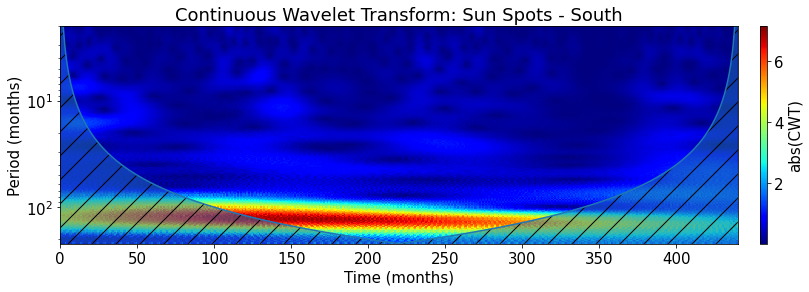

In [134]:
title = "Continuous Wavelet Transform: Sun Spots - South"
variable = 'sun_s'

# Region doesn't matter, the data is the same
df_10U_var = df_10U[variable].to_numpy()
df_10U_var_norm = (df_10U_var - df_10U_var.mean()) / df_10U_var.std()
cwt_10U = scg.CWT(df_10U_var_norm, scales=scales) 
ax = scg.cws(
    cwt_10U, 
    figsize=(13.2, 4), 
    title=title, 
    xlabel="Time (months)",
    ylabel="Period (months)",
    yscale='log'
)
plt.show()

## Wavelet Coherence

Using PyCWT package

In [84]:
fs = 12  # sample frequency of once per month
L = 12*5  # signal length of 5 years
t = np.arange(0, L) / fs

dt=t[1]-t[0]

In [85]:
df_10U['weibull_jd']

dt
1980-05-31    74.508261
1980-06-30    58.455285
1980-07-31    74.901652
1980-08-31    38.001574
1980-09-30    35.609756
                ...    
2016-08-31     5.900865
2016-09-30    11.463415
2016-10-31    80.173092
2016-11-30    96.991870
2016-12-31    93.884558
Freq: M, Name: weibull_jd, Length: 440, dtype: float64

In [86]:
df_10U_var_norm

array([ 3.47172386,  2.39740955,  1.6370392 ,  0.82116307,  1.22269609,
        1.81782899,  0.96278174,  1.79336432,  0.83434911,  0.88568643,
        0.959658  , -0.10009914,  0.07834923,  0.60097548,  2.17783289,
        2.77145368,  1.75486494,  2.36467665,  1.30256427,  1.28972377,
        0.88269794,  2.20545783,  1.86642662,  0.61708623,  0.71940661,
        0.62822664,  0.18831587,  0.53820217,  1.04684899,  0.41687397,
        0.8424653 ,  1.69973511,  0.78765891,  0.22332168,  0.87656104,
        1.05181933,  1.40408575,  0.99800258,  0.73408542,  0.8065672 ,
        0.17421205, -0.38001094, -0.27337537, -0.48972878, -0.23620842,
        0.46560028,  0.79852288,  0.60680277,  0.52999199,  0.06117973,
       -0.24143308, -0.71115481, -0.8532766 , -1.11619029, -0.78257784,
       -0.89269098, -0.88174408, -1.00096049, -1.04611351, -1.06571566,
       -0.80494988, -0.59473337, -0.39128957, -1.07256853, -1.12475984,
       -1.14894807, -0.86141767, -1.04826972, -1.15102135, -0.57

In [87]:
WCT, aWCT, corr_coi, freq, sig = wavelet.wct(df_10U['weibull_jd'], df_10U_var_norm, dt=dt, dj=1/12, s0=-1, J=-1,
                                             sig=False, significance_level=0.95,
                                             wavelet='morlet', normalize=True,
                                             cache=True)

From "https://github.com/CyclingNinja/sunkit-sst/blob/master/sunkitsst/analysis/dataclass.py"

/var/folders/6k/y32xmpgx70183w3dk8bd9scw0000gn/T/ipykernel_38226/4164172584.py:12: RuntimeWarning: divide by zero encountered in true_divide
  cor_sig = np.abs(WCT) / cor_sig
/Users/matthewthompson/opt/anaconda3/lib/python3.9/site-packages/matplotlib/contour.py:1486: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/Users/matthewthompson/opt/anaconda3/lib/python3.9/site-packages/matplotlib/contour.py:1487: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
/var/folders/6k/y32xmpgx70183w3dk8bd9scw0000gn/T/ipykernel_38226/4164172584.py:31: UserWarning: No contour levels were found within the data range.
  ax2.contour(t1, cor_period[:idx], cor_sig[:idx,:], [-99, 1], colors='k', linewidths=2, extent=extent_corr)


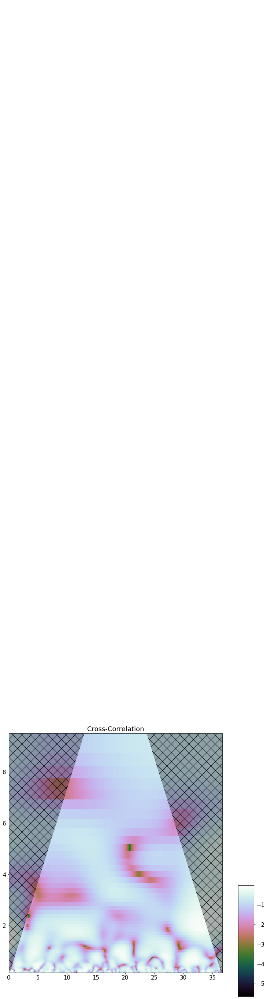

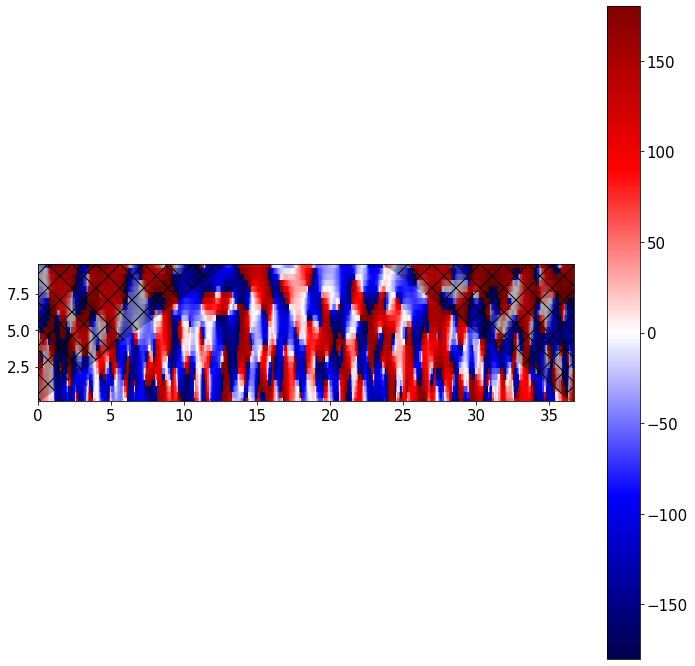

In [88]:
mother = 'morlet'
signal_1 = df_10U['weibull_jd']
signal_2 = df_10U_var_norm

WCT, aWCT, corr_coi, freq, sig = wavelet.wct(signal_1, signal_2, dt=dt, dj=1/12, s0=-1, J=-1,
                                        sig=False, significance_level=0.95, wavelet=mother,
                                        normalize=True)

cor_sig = np.ones([1, signal_1.size]) * sig[:, None]
cor_sig = np.abs(WCT) / cor_sig
cor_period = 1/freq

angle = 0.5 * np.pi - aWCT
u, v = np.cos(angle), np.sin(angle)

t1 = np.linspace(0,dt*signal_1.size,signal_1.size)
extent_corr =  [t1.min(),t1.max(),0,max(cor_period)]

## indices for stuff
idx = 70

fig2, ax2 = plt.subplots(nrows=1,ncols=1, sharex=True, sharey=True, figsize=(12,12))
fig2.subplots_adjust(right=0.8)
cbar_ax_1 = fig2.add_axes([0.85, 0.05, 0.05, 0.35])
im2 = NonUniformImage(ax2, interpolation='nearest', extent=extent_corr)
im2.set_cmap('cubehelix')
im2.set_data(t1, cor_period[:idx], np.log10(WCT[:idx,:]))
ax2.images.append(im2)
ax2.contour(t1, cor_period[:idx], cor_sig[:idx,:], [-99, 1], colors='k', linewidths=2, extent=extent_corr)
ax2.fill(np.concatenate([t1, t1[-1:]+dt, t1[-1:]+dt,t1[:1]-dt, t1[:1]-dt]),
        (np.concatenate([corr_coi,[1e-9], cor_period[-1:], cor_period[-1:], [1e-9]])),
        'k', alpha=0.3,hatch='x')
ax2.set_ylim(([min(cor_period), cor_period[idx]]))
ax2.set_xlim(t1.min(),t1.max())
fig2.colorbar(im2, cax=cbar_ax_1)

plt.show()

plt.figure(figsize=(12,12))
im3= plt.imshow(np.rad2deg(aWCT), origin='lower',interpolation='nearest', cmap='seismic', extent=extent_corr)
plt.fill(np.concatenate([t1, t1[-1:]+dt, t1[-1:]+dt,t1[:1]-dt, t1[:1]-dt]),
        (np.concatenate([corr_coi,[1e-9], cor_period[-1:], cor_period[-1:], [1e-9]])),
        'k', alpha=0.3,hatch='x')
plt.ylim(([min(cor_period), cor_period[idx]]))
plt.xlim(t1.min(),t1.max())
plt.colorbar(im3)
plt.show()

In [89]:
WCT

array([[0.92790708, 0.92708705, 0.92516438, ..., 0.16653557, 0.24541514,
        0.3105153 ],
       [0.88222715, 0.88279793, 0.88215145, ..., 0.1200695 , 0.18112811,
        0.22972359],
       [0.82759514, 0.83075956, 0.8322978 , ..., 0.08245434, 0.12665764,
        0.15959423],
       ...,
       [0.94168403, 0.94168369, 0.94168335, ..., 0.94169539, 0.94169543,
        0.94169548],
       [0.96446584, 0.96446569, 0.96446553, ..., 0.96447023, 0.96447027,
        0.96447031],
       [0.98553272, 0.98553268, 0.98553265, ..., 0.98553353, 0.98553355,
        0.98553356]])

In [90]:
aWCT

array([[0.78501388, 0.86868751, 0.89435306, ..., 1.34292037, 1.73042854,
        2.12351198],
       [0.79089582, 0.87985305, 0.89915282, ..., 1.15494584, 1.60727871,
        2.05958466],
       [0.81374151, 0.91202019, 0.9236256 , ..., 0.94189941, 1.47518962,
        2.0112005 ],
       ...,
       [0.73692862, 0.73691794, 0.7369072 , ..., 0.73747598, 0.737473  ,
        0.73746988],
       [0.73659544, 0.73659462, 0.73659378, ..., 0.73663798, 0.73663775,
        0.7366375 ],
       [0.73656901, 0.73656897, 0.73656893, ..., 0.73657117, 0.73657116,
        0.73657115]])

In [91]:
corr_coi

array([ 0.03043634,  0.09130902,  0.1521817 ,  0.21305438,  0.27392706,
        0.33479974,  0.39567242,  0.45654511,  0.51741779,  0.57829047,
        0.63916315,  0.70003583,  0.76090851,  0.82178119,  0.88265387,
        0.94352655,  1.00439923,  1.06527191,  1.12614459,  1.18701727,
        1.24788995,  1.30876264,  1.36963532,  1.430508  ,  1.49138068,
        1.55225336,  1.61312604,  1.67399872,  1.7348714 ,  1.79574408,
        1.85661676,  1.91748944,  1.97836212,  2.0392348 ,  2.10010748,
        2.16098017,  2.22185285,  2.28272553,  2.34359821,  2.40447089,
        2.46534357,  2.52621625,  2.58708893,  2.64796161,  2.70883429,
        2.76970697,  2.83057965,  2.89145233,  2.95232501,  3.0131977 ,
        3.07407038,  3.13494306,  3.19581574,  3.25668842,  3.3175611 ,
        3.37843378,  3.43930646,  3.50017914,  3.56105182,  3.6219245 ,
        3.68279718,  3.74366986,  3.80454254,  3.86541523,  3.92628791,
        3.98716059,  4.04803327,  4.10890595,  4.16977863,  4.23

In [92]:
freq

array([6.        , 5.66324588, 5.34539231, 5.04537849, 4.76220316,
       4.49492123, 4.24264069, 4.00451956, 3.77976315, 3.56762135,
       3.36738614, 3.17838928, 3.        , 2.83162294, 2.67269615,
       2.52268925, 2.38110158, 2.24746062, 2.12132034, 2.00225978,
       1.88988157, 1.78381067, 1.68369307, 1.58919464, 1.5       ,
       1.41581147, 1.33634808, 1.26134462, 1.19055079, 1.12373031,
       1.06066017, 1.00112989, 0.94494079, 0.89190534, 0.84184654,
       0.79459732, 0.75      , 0.70790573, 0.66817404, 0.63067231,
       0.59527539, 0.56186515, 0.53033009, 0.50056495, 0.47247039,
       0.44595267, 0.42092327, 0.39729866, 0.375     , 0.35395287,
       0.33408702, 0.31533616, 0.2976377 , 0.28093258, 0.26516504,
       0.25028247, 0.2362352 , 0.22297633, 0.21046163, 0.19864933,
       0.1875    , 0.17697643, 0.16704351, 0.15766808, 0.14881885,
       0.14046629, 0.13258252, 0.12514124, 0.1181176 , 0.11148817,
       0.10523082, 0.09932467, 0.09375   , 0.08848822, 0.08352

In [93]:
sig

array([0])

Due to the complexity of PyCWT, I will try the PIWavelet package instead

In [94]:
# # Normalization
# df_10U_stream = df_10U['weibull_jd'].to_numpy()
# df_10U_stream_norm = (df_10U_stream - df_10U_stream.mean()) / df_10U_stream.std()

# variable = 'pdo'
# df_10U_var = df_10U[variable].to_numpy()
# df_10U_var_norm = (df_10U_var - df_10U_var.mean()) / df_10U_var.std()



# myCoherence = piwavelet.wcoherence(df_10U_stream, df_10U_var)
# myCoherence.plot(t=dates, title='Test', units='years')
# Rsq, period, scale, coi, sig95 = myCoherence()

In [95]:
y1 = np.random.rand(100) #Generation of the Random Signal 1
y2 = np.random.rand(100) #Generation of the Random Signal 2
x = np.arange(0,100,1) # Time step
y1 = (y1-y1.mean())/y1.std() #Normalization of the Signal 1
y2 = (y2-y2.mean())/y2.std() #Normalization of the Signal 2
myCoherence = piwavelet.wcoherence(y1,y2) #Wavelet Coherence Analysis
myCoherence.plot(t = x, title='Test',units='sec') # Plot of the Coherence Map
Rsq,period,scale,coi,sig95=myCoherence() # If you want to know the individual properties

ValueError: invalid literal for int() with base 10: '\x1b[?2004h'

Cannot figure out the pathing error I am receiving. Has something to do with the interaction between Oct2Py and Octave.

## Export Dataframes

I have unfortunately exhausted all my clear options for wavelet coherence within Python, but after some research the packages 'biwavelet' and 'WaveletComp' within R both seem promising. I will export my current dataframes as csv files and attempt to run the wavelet coherence analysis in an R script.

In [96]:
df_10U = df_10U.reset_index()
df_11 = df_11.reset_index()
df_13 = df_13.reset_index()
df_14 = df_14.reset_index()
df_15 = df_15.reset_index()
df_17 = df_17.reset_index()

In [97]:
df_10U.to_csv('../Data/DataFrames/df_10U.csv')
df_11.to_csv('../Data/DataFrames/df_11.csv')
df_13.to_csv('../Data/DataFrames/df_13.csv')
df_14.to_csv('../Data/DataFrames/df_14.csv')
df_15.to_csv('../Data/DataFrames/df_15.csv')
df_17.to_csv('../Data/DataFrames/df_17.csv')